**Exploratory data analysis of Zomato food delivery app**

# Предобработка данных

База данных приложения для доставки еды Zomato представляет собой всеобъемлющий набор таблиц, в которых хранится вся важная информация, связанная с приложением для доставки еды (Учетные данные, такие как имя пользователя, адрес электронной почты, пароль и продажи). База данных содержит информацию о заказах, сделанных пользователями, доступных в приложении продуктах питания, меню различных ресторанов, самих ресторанах и пользователях, зарегистрированных в приложении. Таблицы взаимосвязаны и хранят конкретную информацию, что позволяет эффективно извлекать данные. Таблица orders содержит информацию о заказах, включая дату, количество продаж, сумму продаж, валюту, идентификатор пользователя и идентификатор ресторана. В таблице food хранится информация о продуктах питания, включая их идентификатор, название и вегетарианский или невегетарианский статус. Таблица menu содержит информацию о меню ресторана, включая идентификатор меню, идентификатор ресторана, идентификатор блюда, кухню и цену. В таблице restaurant хранится информация о ресторанах, включая идентификатор, название, рейтинг, количество оценок, стоимость, кухню, номер лицензии, ссылку на веб-сайт, адрес и меню. Таблица users содержит информацию о пользователях приложения, включая их идентификатор, имя, адрес электронной почты, пароль, возраст, пол, семейное положение, профессию, ежемесячный доход, уровень образования и размер семьи. Эта база данных обеспечивает бесперебойную и эффективную работу приложения для доставки еды.
Датасет: https://www.kaggle.com/datasets/anas123siddiqui/zomato-database?resource=download&select=restaurant.csv

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from datetime import datetime
from scipy import stats as st
import statsmodels.formula.api as smf
import collections as coll
import seaborn as sns
from tqdm import tqdm

In [2]:
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


/Users/sergeyvikulin/anaconda3/lib/python3.11/site-packages/IPython/core/magics/pylab.py:162: UserWarning: pylab import has clobbered these variables: ['datetime']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


Подгружаем датасеты:

In [3]:
users = pd.read_csv('users.csv', index_col=0)
orders = pd.read_csv('orders.csv', index_col=0)
restaurant = pd.read_csv('restaurant.csv', index_col=0)
menu = pd.read_csv('menu.csv', index_col=0)
food = pd.read_csv('food.csv', index_col=0)

/tmp/ipykernel_54114/3212413924.py:4: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  menu = pd.read_csv('menu.csv', index_col=0)


## users

In [4]:
users

,user_id,name,email,password,Age,Gender,Marital Status,Occupation,Monthly Income,Educational Qualifications,Family size
0,1,Claire Ferguson,fordanthony@example.net,NKz0fWDh!5,20,Female,Single,Student,No Income,Post Graduate,4
1,2,Jennifer Young,ann96@example.com,+i5Q91jt!s,24,Female,Single,Student,Below Rs.10000,Graduate,3
2,3,Jermaine Roberson,uwalker@example.org,eO4GqGusF(,22,Male,Single,Student,Below Rs.10000,Post Graduate,3
3,4,Rachel Carpenter,kimberlypatterson@example.net,d^c7O6odaS,22,Female,Single,Student,No Income,Graduate,6
4,5,Shawn Parker,daniellebennett@example.com,8J#E5RMl1o,22,Male,Single,Student,Below Rs.10000,Post Graduate,4
...,...,...,...,...,...,...,...,...,...,...,...
99995,99996,James Ellis,maddentabitha@example.org,SvO6QoCcv!,23,Female,Prefer not to say,Employee,10001 to 25000,Graduate,4
99996,99997,Justin Christensen,sextonrenee@example.org,+5L+HXxq(Q,19,Male,Single,Student,No Income,Graduate,6
99997,99998,Mark Collier,gwelch@example.org,+kAMm!u5m8,21,Female,Single,Student,No Income,Graduate,2
99998,99999,Lori Henderson MD,howardwilliam@example.org,C)0lH%d^b),23,Male,Single,Student,No Income,Graduate,4


Числовые переменные - Age, Family size. Остальные переменные категориальные:

In [5]:
users.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100000 entries, 0 to 99999
Data columns (total 11 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   user_id                     100000 non-null  int64 
 1   name                        100000 non-null  object
 2   email                       100000 non-null  object
 3   password                    100000 non-null  object
 4   Age                         100000 non-null  int64 
 5   Gender                      100000 non-null  object
 6   Marital Status              100000 non-null  object
 7   Occupation                  100000 non-null  object
 8   Monthly Income              100000 non-null  object
 9   Educational Qualifications  100000 non-null  object
 10  Family size                 100000 non-null  int64 
dtypes: int64(3), object(8)
memory usage: 9.2+ MB


В таблице users нет пропущенных значений:

In [6]:
users.isnull().sum().sort_values()

user_id                       0
name                          0
email                         0
password                      0
Age                           0
Gender                        0
Marital Status                0
Occupation                    0
Monthly Income                0
Educational Qualifications    0
Family size                   0
dtype: int64

Сделаем переменную user_id категориальной:

In [7]:
users['user_id']=users['user_id'].astype('object')

Посмотрим распределение интересующих нас категориальных переменных:

In [8]:
coll.Counter(users['Gender'])

Counter({'Male': 57218, 'Female': 42782})

In [9]:
coll.Counter(users['Marital Status'])

Counter({'Single': 69077, 'Married': 27831, 'Prefer not to say': 3092})

In [10]:
coll.Counter(users['Occupation'])

Counter({'Student': 53357,
         'Employee': 30408,
         'Self Employeed': 13913,
         'House wife': 2322})

Переменную Monthly Income некорректно переводить в числовую (например, присвоить каждому интервалу среднее значение), 
так как такое представление будет некорректно описывать общую выборку. Переменную Monthly Income лучше оставить в виде порядковой переменной. 

In [11]:
coll.Counter(users['Monthly Income'])

Counter({'No Income': 48204,
         '25001 to 50000': 17779,
         'More than 50000': 15976,
         '10001 to 25000': 11599,
         'Below Rs.10000': 6442})

In [12]:
coll.Counter(users['Educational Qualifications'])

Counter({'Graduate': 45610,
         'Post Graduate': 44852,
         'Ph.D': 5928,
         'School': 3094,
         'Uneducated': 516})

Столбцы email и password не интересуют нас в анализе данных, поэтому удалим их:

In [13]:
users=users.drop(['email', 'password'], axis=1)

Обработанная таблица users:

In [14]:
users

,user_id,name,Age,Gender,Marital Status,Occupation,Monthly Income,Educational Qualifications,Family size
0,1,Claire Ferguson,20,Female,Single,Student,No Income,Post Graduate,4
1,2,Jennifer Young,24,Female,Single,Student,Below Rs.10000,Graduate,3
2,3,Jermaine Roberson,22,Male,Single,Student,Below Rs.10000,Post Graduate,3
3,4,Rachel Carpenter,22,Female,Single,Student,No Income,Graduate,6
4,5,Shawn Parker,22,Male,Single,Student,Below Rs.10000,Post Graduate,4
...,...,...,...,...,...,...,...,...,...
99995,99996,James Ellis,23,Female,Prefer not to say,Employee,10001 to 25000,Graduate,4
99996,99997,Justin Christensen,19,Male,Single,Student,No Income,Graduate,6
99997,99998,Mark Collier,21,Female,Single,Student,No Income,Graduate,2
99998,99999,Lori Henderson MD,23,Male,Single,Student,No Income,Graduate,4


## orders

In [15]:
orders

,order_date,sales_qty,sales_amount,currency,user_id,r_id
0,2017-10-10,100,41241,INR,49226,567335.0
1,2018-05-08,3,-1,INR,77359,531342.0
2,2018-04-06,1,875,INR,5321,158203.0
3,2018-04-11,1,583,INR,21343,187912.0
4,2018-06-18,6,7176,INR,75378,543530.0
...,...,...,...,...,...,...
150276,2019-04-18,1,394,INR\n,79856,NaN
150277,2019-04-23,1,667,INR\n,65798,NaN
150278,2019-04-23,1,625,INR\n,49176,NaN
150279,2019-04-24,7,8625,INR\n,87924,NaN


In [16]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
Index: 150281 entries, 0 to 150280
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   order_date    150281 non-null  object 
 1   sales_qty     150281 non-null  int64  
 2   sales_amount  150281 non-null  int64  
 3   currency      150281 non-null  object 
 4   user_id       150281 non-null  int64  
 5   r_id          148664 non-null  float64
dtypes: float64(1), int64(3), object(2)
memory usage: 8.0+ MB


Есть пропуски в r_id (id ресторана):

In [17]:
orders.isnull().sum().sort_values()

order_date         0
sales_qty          0
sales_amount       0
currency           0
user_id            0
r_id            1617
dtype: int64

Удалим наблюдения с пропусками, так как мы не знаем, какой ресторан отвечал за заказ, и таких наблюдений немного:

In [18]:
orders= orders.dropna(subset=['r_id'])
orders

,order_date,sales_qty,sales_amount,currency,user_id,r_id
0,2017-10-10,100,41241,INR,49226,567335.0
1,2018-05-08,3,-1,INR,77359,531342.0
2,2018-04-06,1,875,INR,5321,158203.0
3,2018-04-11,1,583,INR,21343,187912.0
4,2018-06-18,6,7176,INR,75378,543530.0
...,...,...,...,...,...,...
148659,2019-03-15,1,1630,INR\n,25901,390478.0
148660,2019-03-15,1,2611,INR\n,97820,103649.0
148661,2019-03-15,7,10458,INR\n,6041,430451.0
148662,2019-03-18,1,713,INR\n,81310,518548.0


Удалим ошибки в данных, где сумма заказа отрицательна:

In [19]:
orders[orders['sales_qty']<0]

,order_date,sales_qty,sales_amount,currency,user_id,r_id


In [20]:
orders[orders['sales_amount']<0]

,order_date,sales_qty,sales_amount,currency,user_id,r_id
1,2018-05-08,3,-1,INR,77359,531342.0
282,2018-05-08,3,-1,INR\n,357,509389.0


In [21]:
orders = orders.drop([1,282]).reset_index(drop=True)
orders

,order_date,sales_qty,sales_amount,currency,user_id,r_id
0,2017-10-10,100,41241,INR,49226,567335.0
1,2018-04-06,1,875,INR,5321,158203.0
2,2018-04-11,1,583,INR,21343,187912.0
3,2018-06-18,6,7176,INR,75378,543530.0
4,2017-11-20,59,500,USD,34323,158204.0
...,...,...,...,...,...,...
148657,2019-03-15,1,1630,INR\n,25901,390478.0
148658,2019-03-15,1,2611,INR\n,97820,103649.0
148659,2019-03-15,7,10458,INR\n,6041,430451.0
148660,2019-03-18,1,713,INR\n,81310,518548.0


Сделаем переменную r_id типа object:

In [22]:
orders['r_id'] = orders['r_id'].astype('int')
orders['r_id'] = orders['r_id'].astype('object')

Сделаем переменную order_date типа datetime:

In [23]:
from datetime import date
a=[0]*148662
for i in range(len(orders)):
    year1=int(orders['order_date'][i][:4])
    month1=int(orders['order_date'][i][5:7])
    date1=int(orders['order_date'][i][8:10])
    a[i]=datetime.date(year1, month1, date1)
orders['order_date']=a
orders

,order_date,sales_qty,sales_amount,currency,user_id,r_id
0,2017-10-10,100,41241,INR,49226,567335
1,2018-04-06,1,875,INR,5321,158203
2,2018-04-11,1,583,INR,21343,187912
3,2018-06-18,6,7176,INR,75378,543530
4,2017-11-20,59,500,USD,34323,158204
...,...,...,...,...,...,...
148657,2019-03-15,1,1630,INR\n,25901,390478
148658,2019-03-15,1,2611,INR\n,97820,103649
148659,2019-03-15,7,10458,INR\n,6041,430451
148660,2019-03-18,1,713,INR\n,81310,518548


Посмотрим распределение интересующих нас переменных:

In [24]:
coll.Counter(orders['currency'])

Counter({'INR\n': 148382, 'INR': 278, 'USD': 2})

Судя по всему, валюта INR и INR\r обозначают одно и то же (индийскую рупию), и у нас опечатка в данных!

In [25]:
orders.groupby(['currency']).agg({'sales_amount':['mean']})

,sales_amount
,mean
currency,
INR,6300.557554
INR\n,6486.682832
USD,375.000000


Переведем операции в долларах в рупии. Для этого воспользуемся курсом на дату проведения операции (ниже приведены ссылки):

In [26]:
orders[orders['currency']=='USD']

,order_date,sales_qty,sales_amount,currency,user_id,r_id
4,2017-11-20,59,500,USD,34323,158204
5,2017-11-22,36,250,USD,33246,156588


In [27]:
list(orders[orders['currency']=='USD']['order_date'])

[datetime.date(2017, 11, 20), datetime.date(2017, 11, 22)]

Курс доллара 2017-11-20: 1 USD to INR = 65.0372
https://www.exchangerates.org.uk/historical/USD/20_11_2017

Курс доллара 2017-11-22: 1 USD to INR = 64.7843
https://www.exchangerates.org.uk/historical/USD/22_11_2017

In [28]:
orders['sales_amount'][4]=float(orders['sales_amount'][4])*65.0372
orders['sales_amount'][5]=float(orders['sales_amount'][5])*64.7843


/tmp/ipykernel_54114/2802899564.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  orders['sales_amount'][4]=float(orders['sales_amount'][4])*65.0372


In [29]:
orders[orders['currency']=='USD']

,order_date,sales_qty,sales_amount,currency,user_id,r_id
4,2017-11-20,59,32518.600,USD,34323,158204
5,2017-11-22,36,16196.075,USD,33246,156588


Далее мы можем удалить столбец currency, так все значения покупок отражены в индийских рупиях:

In [30]:
orders=orders.drop(['currency'], axis=1)

Обработанная таблица orders:

In [31]:
orders

,order_date,sales_qty,sales_amount,user_id,r_id
0,2017-10-10,100,41241.0,49226,567335
1,2018-04-06,1,875.0,5321,158203
2,2018-04-11,1,583.0,21343,187912
3,2018-06-18,6,7176.0,75378,543530
4,2017-11-20,59,32518.6,34323,158204
...,...,...,...,...,...
148657,2019-03-15,1,1630.0,25901,390478
148658,2019-03-15,1,2611.0,97820,103649
148659,2019-03-15,7,10458.0,6041,430451
148660,2019-03-18,1,713.0,81310,518548


## restaurant

In [32]:
restaurant

,id,name,city,rating,rating_count,cost,cuisine,lic_no,link,address,menu
0,567335,AB FOODS POINT,Abohar,--,Too Few Ratings,₹ 200,"Beverages,Pizzas",22122652000138,https://www.swiggy.com/restaurants/ab-foods-po...,"AB FOODS POINT, NEAR RISHI NARANG DENTAL CLINI...",Menu/567335.json
1,531342,Janta Sweet House,Abohar,4.4,50+ ratings,₹ 200,"Sweets,Bakery",12117201000112,https://www.swiggy.com/restaurants/janta-sweet...,"Janta Sweet House, Bazar No.9, Circullar Road,...",Menu/531342.json
2,158203,theka coffee desi,Abohar,3.8,100+ ratings,₹ 100,Beverages,22121652000190,https://www.swiggy.com/restaurants/theka-coffe...,"theka coffee desi, sahtiya sadan road city",Menu/158203.json
3,187912,Singh Hut,Abohar,3.7,20+ ratings,₹ 250,"Fast Food,Indian",22119652000167,https://www.swiggy.com/restaurants/singh-hut-n...,"Singh Hut, CIRCULAR ROAD NEAR NEHRU PARK ABOHAR",Menu/187912.json
4,543530,GRILL MASTERS,Abohar,--,Too Few Ratings,₹ 250,"Italian-American,Fast Food",12122201000053,https://www.swiggy.com/restaurants/grill-maste...,"GRILL MASTERS, ADA Heights, Abohar - Hanumanga...",Menu/543530.json
...,...,...,...,...,...,...,...,...,...,...,...
148536,553122,The Food Delight,Yavatmal,--,Too Few Ratings,₹ 200,"Fast Food,Snacks",21522053000452,https://www.swiggy.com/restaurants/the-food-de...,"The Food Delight, 94MC+X35, New Singhania Naga...",Menu/553122.json
148537,562647,MAITRI FOODS & BEVERAGES,Yavatmal,--,Too Few Ratings,₹ 300,Pizzas,license,https://www.swiggy.com/restaurants/maitri-food...,"MAITRI FOODS & BEVERAGES, POLIC MITRYA SOCIETY...",Menu/562647.json
148538,559435,Cafe Bella Ciao,Yavatmal,--,Too Few Ratings,₹ 300,"Fast Food,Snacks",21522251000378,https://www.swiggy.com/restaurants/cafe-bella-...,"Cafe Bella Ciao, SHOP NO 2 NEMANI MARKET SBI S...",Menu/559435.json
148539,418989,GRILL ZILLA,Yavatmal,--,Too Few Ratings,₹ 250,Continental,21521251000241,https://www.swiggy.com/restaurants/grill-zilla...,"GRILL ZILLA, SHO NO 2/6, POSTEL GROUND CHOWPAT...",Menu/418989.json


In [33]:
restaurant.info()

<class 'pandas.core.frame.DataFrame'>
Index: 148541 entries, 0 to 148540
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            148541 non-null  int64 
 1   name          148455 non-null  object
 2   city          148541 non-null  object
 3   rating        148455 non-null  object
 4   rating_count  148455 non-null  object
 5   cost          148410 non-null  object
 6   cuisine       148442 non-null  object
 7   lic_no        148312 non-null  object
 8   link          148541 non-null  object
 9   address       148455 non-null  object
 10  menu          148541 non-null  object
dtypes: int64(1), object(10)
memory usage: 13.6+ MB


Сделаем переменную id категориальной:

In [34]:
restaurant['id'] = restaurant['id'].astype('object')


Во многих переменных есть пропуски:

In [35]:
restaurant.isnull().sum().sort_values()

id                0
city              0
link              0
menu              0
name             86
rating           86
rating_count     86
address          86
cuisine          99
cost            131
lic_no          229
dtype: int64

Заметим, что в 86 строчках пропущены значения в столбцах name, rating, rating_count, address, cuisine, cost, lic_no:

In [36]:
restaurant[restaurant['name'].isnull()==True]

,id,name,city,rating,rating_count,cost,cuisine,lic_no,link,address,menu
31044,397961,NaN,"Greater Mohali,Chandigarh",NaN,NaN,NaN,NaN,NaN,https://www.swiggy.com/restaurants/5-tara-grea...,NaN,Menu/397961.json
32912,308071,NaN,"West Chd,Chandigarh",NaN,NaN,NaN,NaN,NaN,https://www.swiggy.com/restaurants/food-under-...,NaN,Menu/308071.json
33046,308662,NaN,"West Chd,Chandigarh",NaN,NaN,NaN,NaN,NaN,https://www.swiggy.com/restaurants/franks-frie...,NaN,Menu/308662.json
33488,170889,NaN,"South Chd,Chandigarh",NaN,NaN,NaN,NaN,NaN,https://www.swiggy.com/restaurants/dhaba-7-pre...,NaN,Menu/170889.json
36492,390394,NaN,"George Town,Chennai",NaN,NaN,NaN,NaN,NaN,https://www.swiggy.com/restaurants/frozen-cafe...,NaN,Menu/390394.json
...,...,...,...,...,...,...,...,...,...,...,...
137122,256827,NaN,Satara,NaN,NaN,NaN,NaN,NaN,https://www.swiggy.com/restaurants/rajdhani-pa...,NaN,Menu/256827.json
137546,567595,NaN,Shillong,NaN,NaN,NaN,NaN,NaN,https://www.swiggy.com/restaurants/the-blue-ri...,NaN,Menu/567595.json
137614,116615,NaN,Shivamogga,NaN,NaN,NaN,NaN,NaN,https://www.swiggy.com/restaurants/bakers-bowl...,NaN,Menu/116615.json
138380,401760,NaN,Sirsa,NaN,NaN,NaN,NaN,NaN,https://www.swiggy.com/restaurants/murga-dlf-p...,NaN,Menu/401760.json


Так как все 86 ресторанов с пропущенными значениями есть в таблице orders, то их нельзя удалять:

In [37]:
a=set(restaurant[restaurant['name'].isnull()==True]['id'])

In [38]:
b=set()
for i in orders['r_id']:
    if i in a:
        b.add(i)
print(a==b)

True


Поэтому назовем эти 86 ресторанов - Other:

In [39]:
restaurant['name'] = restaurant['name']. fillna('Other')

Видим, что помимо 86 ресторанов с пропусками в rating, есть еще большое количество ресторанов (87014) с недостаточным количеством отзывов для получения рейтинга:

In [40]:
coll.Counter(restaurant['rating']).most_common(10)

[('--', 87014),
 ('4.0', 6532),
 ('4.1', 6296),
 ('4.2', 5821),
 ('3.8', 5736),
 ('3.9', 5435),
 ('4.3', 5011),
 ('3.7', 4253),
 ('4.4', 3149),
 ('3.5', 2963)]

Пока заменим 86 пропусков на '--':

In [41]:
restaurant['rating'] = restaurant['rating']. fillna('--')

Чтобы оставить переменную rating в численном виде, заменим рейтинг ресторанов с малым количеством отзывов на средний рейтинг ресторанов:

In [42]:
c=list(restaurant['rating'])
s=0
count=0
for i in range(len(c)):
    if c[i]!='--':
        s=s+float(c[i])
        count=count+1
for i in range(len(c)):
    if c[i]=='--':
        c[i]=str(round(s/count,1))
print(round(s/count,1))


3.9


In [43]:
restaurant['rating']= c
restaurant['rating'] = restaurant['rating']. astype('float')

In [44]:
coll.Counter(restaurant['rating_count'])

Counter({'Too Few Ratings': 87014,
         '20+ ratings': 21636,
         '100+ ratings': 20548,
         '50+ ratings': 12009,
         '500+ ratings': 4396,
         '1K+ ratings': 2739,
         '5K+ ratings': 98,
         nan: 86,
         '10K+ ratings': 15})

Заменим 86 пропусков в переменной rating_count на 'Too Few Ratings' (недостаточно отзывов):

In [45]:
restaurant['rating_count'] = restaurant['rating_count']. fillna('Too Few Ratings')

In [46]:
coll.Counter(restaurant['cost']).most_common(10)

[('₹ 200', 38635),
 ('₹ 300', 29701),
 ('₹ 250', 19745),
 ('₹ 150', 12096),
 ('₹ 400', 11711),
 ('₹ 500', 6378),
 ('₹ 350', 6296),
 ('₹ 100', 6186),
 ('₹ 600', 2558),
 ('₹ 450', 1456)]

Заменим пропуски в перменной cost на '₹ --', а затем заполним их средним значением по аналогии с переменной rating:

In [47]:
restaurant['cost'] = restaurant['cost']. fillna('₹ --')
c=list(restaurant['cost'])
for i in range(len(c)):
    c[i]=c[i][2:]
s=0
count=0
for i in range(len(c)):
    if c[i]!='--':
        s=s+float(c[i])
        count=count+1
for i in range(len(c)):
    if c[i]=='--':
        c[i]=str(round(s/count,1))
print(round(s/count,1))

287.6


In [48]:
restaurant['cost']= c
restaurant['cost'] = restaurant['cost']. astype('float')

Видим, что в столбце cuisine каждый ресторан написал кухню как захотел. Теперь невозможно адекватно разделить рестораны по кухням и блюдам:

In [49]:
coll.Counter(restaurant['cuisine']).most_common(20)

[('North Indian,Chinese', 6471),
 ('Indian', 6414),
 ('Chinese', 5051),
 ('North Indian', 4775),
 ('Indian,Chinese', 4374),
 ('South Indian', 3303),
 ('Bakery', 3132),
 ('Chinese,Indian', 2308),
 ('Chinese,North Indian', 2288),
 ('Bakery,Desserts', 2233),
 ('Biryani', 2227),
 ('Pizzas', 2215),
 ('Beverages', 2157),
 ('North Indian,Indian', 2004),
 ('Snacks', 1788),
 ('Fast Food', 1671),
 ('Biryani,North Indian', 1644),
 ('Chinese,Snacks', 1622),
 ('Fast Food,Snacks', 1601),
 ('Ice Cream,Desserts', 1577)]

Заполним пропуски переменной cuisine на 'Other':

In [50]:
restaurant['cuisine'] = restaurant['cuisine']. fillna('Other')

Далее посмотрим распределение кухонь и блюд среди ресторанов (для этого сделаем split по запятой, так как многие рестораны попадают в несколько категорий). Замечание: распределение не совсем корректно, так как где-то были опечатки и был лишний пробел. Однако это не так существенно и можно этим пренебречь:

In [51]:
c=list(restaurant['cuisine'])
e=dict()
for i in range(len(c)):
    d=c[i].split(',')
    for j in range(len(d)):
        if d[j] not in e:
            e[d[j]]=1
        else:
            e[d[j]]+=1
e = dict(sorted(e.items(), key=lambda item: item[1]))
print(e)
     

{'Biryani - Shivaji Military Hotel': 1, 'Use Code JUMBO30 to avail': 1, 'Attractive Combos Available': 1, 'Default': 1, 'Bakery products': 1, 'Code valid on bill over Rs.99': 1, 'Free Delivery ! Limited Stocks!': 1, 'MAX 2 Combos per Order!': 1, 'Navratri Special': 1, 'BEVERAGE': 1, 'Meat': 1, 'Discount offer from Garden Cafe Express Kankurgachi': 1, 'Use code XPRESS121 to avail.': 1, 'Bowl Company': 1, 'Special Discount from (Hotel Swagath)': 1, 'indian': 1, 'Khasi': 1, 'Grocery products': 1, 'Australian': 2, 'Sri Lankan': 2, 'Tandoor ': 2, 'Mongolian': 3, 'Popular Brand Store': 4, 'Tribal': 4, 'Konkan': 5, 'Greek': 6, 'German': 6, 'South American': 6, 'Telangana': 6, 'Bhutanese': 6, 'SVANidhi Street Food Vendor': 8, 'Rayalaseema': 8, '8:15 To 11:30 Pm': 9, 'Steakhouse': 10, 'Persian': 10, 'Spanish': 11, 'Vietnamese': 12, 'Singaporean': 12, 'Indonesian': 13, 'Portuguese': 14, 'African': 14, 'Tex-Mex': 14, 'Parsi': 14, 'Sindhi': 15, 'Kashmiri': 18, 'Malaysian': 21, 'Bangladeshi': 24, '

In [52]:
148541*0.005

742.705

Разделим характеристику cuisine на cuisines(какая кухня в ресторане) и foods(основные продукты и еда) и оставим только те категории, которые встречаются минимум в 0,5% ресторанах(>742):

In [53]:
cuisines=['Chinese','Indian','Italian', 'Continental', 'American', 'Mughlai',
          'Arabian', 'Punjabi', 'Asian', 'Bengali', 'Maharashtrian']
foods=['Snack', 'Biryani', 'Beverage', 'Fast Food', 
       'Dessert', 'Pizza', 'Bakery', 'Ice Cream',
      'Sweet', 'Tandoor', 'Street Food', 'Thalis',
      'Juice', 'Chaat', 'Healthy Food', 'Kebab',
      'Pasta', 'Salad', 'Combo', 'Burger', 'Seafood']

Тут мы ищем в каждой строке характеристику из cuisines и характеристику из foods, если характеристики нет среди популярных, то заменим ее на 'Other'. Если есть вторая характеристика из foods или из cuisines, то добавим ее в столбцы additional_food и additional_cuisine соответственно. По умолчанию в данных столбцах стоит:'No':

In [54]:
cuisine=['Other']*148541
additional_cuisine=['No']*148541
additional_foo=['No']*148541
foo=['Other']*148541
for i in range(len(c)):
    t=True
    for j in range(len(cuisines)):
        if t and c[i].find(cuisines[j])!=-1:
            cuisine[i]=cuisines[j]
            t=False
        elif c[i].find(cuisines[j])!=-1:
            additional_cuisine[i]=cuisines[j]
            break
                      
for i in range(len(c)):
    t=True
    for j in range(len(foods)):
        if t and c[i].find(foods[j])!=-1:
            foo[i]=foods[j]
            t=False
        elif c[i].find(foods[j])!=-1:
            additional_foo[i]=foods[j]
            break

In [55]:
restaurant['cuisine']=cuisine
restaurant['food']=foo
restaurant['additional_cuisine']=additional_cuisine
restaurant['additional_food']=additional_foo

Распределение в столбце cuisine:

In [56]:
coll.Counter(restaurant['cuisine'])

Counter({'Other': 50938,
         'Indian': 46574,
         'Chinese': 36464,
         'Italian': 5008,
         'American': 2993,
         'Continental': 2189,
         'Arabian': 1676,
         'Mughlai': 1211,
         'Bengali': 463,
         'Maharashtrian': 411,
         'Asian': 330,
         'Punjabi': 284})

Распределение в столбце food:

In [57]:
coll.Counter(restaurant['food'])

Counter({'Other': 61588,
         'Snack': 17231,
         'Biryani': 14159,
         'Beverage': 12247,
         'Fast Food': 10044,
         'Dessert': 9075,
         'Pizza': 6935,
         'Bakery': 4280,
         'Tandoor': 2006,
         'Thalis': 1681,
         'Ice Cream': 1423,
         'Sweet': 1294,
         'Street Food': 1252,
         'Healthy Food': 1074,
         'Chaat': 799,
         'Seafood': 763,
         'Combo': 665,
         'Kebab': 650,
         'Juice': 512,
         'Pasta': 347,
         'Salad': 332,
         'Burger': 184})

Распределение в столбце additional_cuisine:

In [58]:
coll.Counter(restaurant['additional_cuisine'])

Counter({'No': 121102,
         'Indian': 17258,
         'Continental': 1773,
         'Punjabi': 1632,
         'Mughlai': 1541,
         'American': 1306,
         'Asian': 1295,
         'Italian': 988,
         'Arabian': 788,
         'Bengali': 477,
         'Maharashtrian': 381})

Распределение в столбце additional_food:

In [59]:
coll.Counter(restaurant['additional_food'])

Counter({'No': 119551,
         'Bakery': 4559,
         'Ice Cream': 3930,
         'Fast Food': 3848,
         'Pizza': 2910,
         'Dessert': 2118,
         'Beverage': 2023,
         'Sweet': 1742,
         'Juice': 1273,
         'Chaat': 954,
         'Pasta': 852,
         'Street Food': 749,
         'Salad': 749,
         'Burger': 727,
         'Healthy Food': 602,
         'Kebab': 601,
         'Biryani': 365,
         'Combo': 358,
         'Tandoor': 341,
         'Thalis': 158,
         'Seafood': 131})

Удалим стоблцы link,menu,lic_no,address, так как они не понадобятся нам в анализе данных, а также переименуем столбец id для дальнейшего удобства (чтобы было удобно соединять таблицы):

In [60]:
restaurant=restaurant.drop(['link','menu','lic_no','address'], axis=1)
restaurant=restaurant.rename(columns = {'id':'r_id', 'name': 'restaurant_name'})

Обработанная таблица restaurant:

In [61]:
restaurant

,r_id,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
0,567335,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
1,531342,Janta Sweet House,Abohar,4.4,50+ ratings,200.0,Other,Bakery,No,Sweet
2,158203,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No
3,187912,Singh Hut,Abohar,3.7,20+ ratings,250.0,Indian,Fast Food,No,No
4,543530,GRILL MASTERS,Abohar,3.9,Too Few Ratings,250.0,Italian,Fast Food,American,No
...,...,...,...,...,...,...,...,...,...,...
148536,553122,The Food Delight,Yavatmal,3.9,Too Few Ratings,200.0,Other,Snack,No,Fast Food
148537,562647,MAITRI FOODS & BEVERAGES,Yavatmal,3.9,Too Few Ratings,300.0,Other,Pizza,No,No
148538,559435,Cafe Bella Ciao,Yavatmal,3.9,Too Few Ratings,300.0,Other,Snack,No,Fast Food
148539,418989,GRILL ZILLA,Yavatmal,3.9,Too Few Ratings,250.0,Continental,Other,No,No


In [62]:
restaurant.isnull().sum().sort_values()

r_id                  0
restaurant_name       0
city                  0
rating                0
rating_count          0
cost                  0
cuisine               0
food                  0
additional_cuisine    0
additional_food       0
dtype: int64

## Menu

In [63]:
menu

,menu_id,r_id,f_id,cuisine,price
0,mn0,567335,fd0,"Beverages,Pizzas",40.0
1,mn0,567335,fd669322,"Beverages,Pizzas",40.0
2,mn328,158203,fd0,Beverages,65.0
3,mn328,158203,fd669322,Beverages,65.0
4,mn449,158203,fd0,Beverages,65.0
...,...,...,...,...,...
1179931,mn1048555,96525,fd1048555,"Ice Cream,Desserts",300.0
1179932,mn1048556,96525,fd1048556,"Ice Cream,Desserts",300.0
1179933,mn1048558,96525,fd1048558,"Ice Cream,Desserts",350.0
1179934,mn1048561,96525,fd1048561,"Ice Cream,Desserts",200.0


In [64]:
menu.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1179936 entries, 0 to 1179935
Data columns (total 5 columns):
 #   Column   Non-Null Count    Dtype 
---  ------   --------------    ----- 
 0   menu_id  1179936 non-null  object
 1   r_id     1179936 non-null  int64 
 2   f_id     1179936 non-null  object
 3   cuisine  1179936 non-null  object
 4   price    1179936 non-null  object
dtypes: int64(1), object(4)
memory usage: 54.0+ MB


Сделаем столбец price типа float, а столбец r_id типа object: 

In [65]:
price=[0]*1179936
for i in range(len(menu['price'])):
    if str(menu['price'][i]).find('₹')!=-1:
        price[i]=float(menu['price'][i][1:-7])
    else:
        price[i]=float(menu['price'][i])

In [66]:
menu['r_id']=menu['r_id'].astype('object')
menu['price']=price

В таблице menu нет пропусков:

In [67]:
menu.isnull().sum().sort_values()

menu_id    0
r_id       0
f_id       0
cuisine    0
price      0
dtype: int64

In [68]:
e=coll.Counter(menu['menu_id'])

Видим, что в каждом меню либо 1, либо 2 продукта. Скорее всего это зависит от того, представлен ли продукт для вегетарианцев или нет:

In [69]:
e = dict(reversed(sorted(e.items(), key=lambda item: item[1])))
print(max(e.values()),min(e.values()))

2 1


Проверив данную гипотезу, видим, что это действительно так и в каждом меню представлен один продукт:

In [70]:
resultdf=menu.merge(food,how="inner",on="f_id")
resultdf

,menu_id,r_id,f_id,cuisine,price,item,veg_or_non_veg
0,mn0,567335,fd0,"Beverages,Pizzas",40.0,Aloo Tikki Burger,Veg
1,mn328,158203,fd0,Beverages,65.0,Aloo Tikki Burger,Veg
2,mn449,158203,fd0,Beverages,65.0,Aloo Tikki Burger,Veg
3,mn729,158204,fd0,Continental,60.0,Aloo Tikki Burger,Veg
4,mn755,158204,fd0,Continental,60.0,Aloo Tikki Burger,Veg
...,...,...,...,...,...,...,...
1179931,mn1048555,96525,fd1048555,"Ice Cream,Desserts",300.0,Sizzlers De- Verdure,Veg
1179932,mn1048556,96525,fd1048556,"Ice Cream,Desserts",300.0,Veg Bbq Sizzler,Veg
1179933,mn1048558,96525,fd1048558,"Ice Cream,Desserts",350.0,Veg Sizzling Italian,Veg
1179934,mn1048561,96525,fd1048561,"Ice Cream,Desserts",200.0,Veg Overload Sandwich,Veg


In [71]:
sl={}
r=0
for i in range(len(resultdf['menu_id'])):
    if  resultdf['menu_id'][i] not in sl:
        sl[resultdf['menu_id'][i]]=resultdf['item'][i]
    else:
        if sl[resultdf['menu_id'][i]]!=resultdf['item'][i]:
            r=r+1
print(r)

0


Количество продуктов в меню ресторанов(здесь мы считаем продукт fd1 для вегетарианцев(veg) и продукт fd1 для невегатарианцев(non-veg) за разные продукты):

In [72]:
coll.Counter(menu['r_id']).most_common(10)

[(223089, 982),
 (150713, 690),
 (332479, 628),
 (36175, 603),
 (344312, 599),
 (345934, 597),
 (451489, 585),
 (80701, 584),
 (112399, 563),
 (75335, 544)]

Здесь та же беда с столбцом cuisine, как и в таблице restaurant:

In [73]:
coll.Counter(menu['cuisine']).most_common(10)

[('North Indian,Chinese', 82883),
 ('Indian,Chinese', 61419),
 ('North Indian', 45504),
 ('Indian', 43396),
 ('Chinese,North Indian', 26188),
 ('Chinese', 24129),
 ('Chinese,Indian', 21073),
 ('South Indian,North Indian', 20901),
 ('Pizzas', 18693),
 ('North Indian,Indian', 16271)]

Сделаем те же самые действия со столбцом cuisine, что и в таблице restaurant(характеристика cuisine в таблицах restaurant и menu разная):

In [74]:
c=list(menu['cuisine'])
e=dict()
for i in range(len(c)):
    d=c[i].split(',')
    for j in range(len(d)):
        if d[j] not in e:
            e[d[j]]=1
        else:
            e[d[j]]+=1
e = dict(sorted(e.items(), key=lambda item: item[1]))
print(e)

{' Sa...': 1, ' Bir...': 1, ' P...': 1, ' Offer Valid o...': 1, ' Desse...': 1, ' Mongolian': 1, ' Ice Cream Cakes': 1, ' European': 1, ' Mexican...': 1, ' Pizzas...': 1, ' Persian': 1, ' French': 1, ' Hyde...': 1, ' Healthy F...': 1, ' Burmese': 1, ' Sushi': 1, ' Keto': 1, ' Des...': 1, ' Desserts...': 1, ' Italia...': 1, ' Goan': 1, ' Asi...': 1, ' Awadhi': 1, ' Turkish': 1, ' Dess...': 1, ' Grill': 1, ' Kerala': 1, ' Andhra': 1, ' Tando...': 1, ' Vietnamese': 1, ' Beverage...': 2, ' Greek': 2, ' Middle Eastern': 2, ' Rajasthani': 2, ' Bengali': 2, ' Japanese': 2, ' Korean': 2, ' Maharashtrian': 2, ' Afghani': 2, ' Ital...': 2, ' Cafe': 3, ' Waffle': 3, ' Arabian': 3, ' Lucknowi': 3, ' Burgers': 3, ' Home Food': 4, ' Barbecue': 4, ' Hyderabadi': 4, ' Tibetan': 4, ' Pan-Asian': 5, ' Mediterranean': 6, ' Oriental': 6, ' Lebanese': 8, ' Italian-American': 10, ' Kebabs': 10, ' Jain': 11, ' Seafood': 11, ' Juices': 12, ' Asian': 14, ' Thai': 14, ' Sweets': 16, ' Healthy Food': 17, ' Chaat

In [75]:
1179936*0.005

5899.68

In [76]:
cuisines1=['Chinese','Indian','Italian', 'Continental', 'American', 'Mughlai',
          'Arabian', 'Punjabi', 'Asian', 'Bengali', 'Maharashtrian', 'Mexican',
          'Thai','Kerala','Andhra','Gujarati','Other']
foods1=['Snack', 'Biryani', 'Beverage', 'Fast Food', 
       'Dessert', 'Pizza', 'Bakery', 'Ice Cream',
      'Sweet', 'Tandoor', 'Street Food', 'Thalis',
      'Juice', 'Chaat', 'Healthy Food',
      'Pasta', 'Salad', 'Burger']

In [77]:
cuisine1=['Other']*1179936
additional_cuisine1=['No']*1179936
additional_foo1=['No']*1179936
foo1=['Other']*1179936
for i in range(len(c)):
    t=True
    for j in range(len(cuisines1)):
        if t and c[i].find(cuisines1[j])!=-1:
            cuisine1[i]=cuisines1[j]
            t=False
        elif c[i].find(cuisines1[j])!=-1:
            additional_cuisine1[i]=cuisines1[j]
            break
                      
for i in range(len(c)):
    t=True
    for j in range(len(foods1)):
        if t and c[i].find(foods1[j])!=-1:
            foo1[i]=foods1[j]
            t=False
        elif c[i].find(foods1[j])!=-1:
            additional_foo1[i]=foods1[j]
            break

In [78]:
menu['menu_cuisine']=cuisine1
menu['menu_food']=foo1
menu['menu_additional_cuisine']=additional_cuisine1
menu['menu_additional_food']=additional_foo1

Получившееся распределение переменной menu_cuisine:

In [79]:
coll.Counter(menu['menu_cuisine'])

Counter({'Indian': 378288,
         'Other': 333670,
         'Chinese': 329973,
         'Italian': 52832,
         'American': 24591,
         'Continental': 18005,
         'Mughlai': 11039,
         'Arabian': 6320,
         'Andhra': 5156,
         'Punjabi': 4600,
         'Gujarati': 3620,
         'Maharashtrian': 2864,
         'Bengali': 2503,
         'Kerala': 2051,
         'Asian': 1987,
         'Mexican': 1938,
         'Thai': 499})

Получившееся распределение переменной menu_food:

In [80]:
coll.Counter(menu['menu_food'])

Counter({'Other': 592404,
         'Snack': 110553,
         'Beverage': 100797,
         'Biryani': 78105,
         'Fast Food': 72044,
         'Pizza': 70956,
         'Dessert': 60030,
         'Bakery': 20507,
         'Tandoor': 15720,
         'Thalis': 11522,
         'Sweet': 10508,
         'Street Food': 8911,
         'Ice Cream': 8377,
         'Healthy Food': 6978,
         'Chaat': 4675,
         'Pasta': 2728,
         'Juice': 2257,
         'Salad': 1772,
         'Burger': 1092})

Получившееся распределение переменной menu_additional_cuisine:

In [81]:
coll.Counter(menu['menu_additional_cuisine'])

Counter({'No': 836347,
         'Indian': 209554,
         'Continental': 22577,
         'Punjabi': 21959,
         'American': 14850,
         'Mughlai': 13042,
         'Italian': 11414,
         'Asian': 9632,
         'Thai': 7120,
         'Arabian': 6388,
         'Mexican': 6143,
         'Gujarati': 6006,
         'Maharashtrian': 5454,
         'Bengali': 4378,
         'Kerala': 3883,
         'Andhra': 1189})

Получившееся распределение переменной menu_additional_food:

In [82]:
coll.Counter(menu['menu_additional_food'])

Counter({'No': 965510,
         'Pizza': 32226,
         'Bakery': 30994,
         'Fast Food': 29520,
         'Ice Cream': 25249,
         'Beverage': 16541,
         'Dessert': 15284,
         'Sweet': 11910,
         'Pasta': 9719,
         'Street Food': 8757,
         'Juice': 8515,
         'Burger': 7178,
         'Healthy Food': 5173,
         'Salad': 5148,
         'Tandoor': 3556,
         'Chaat': 3540,
         'Biryani': 860,
         'Thalis': 256})

Удалим старый столбец cuisine:

In [83]:
menu=menu.drop(['cuisine'], axis=1)

Обработанная таблица menu:

In [84]:
menu

,menu_id,r_id,f_id,price,menu_cuisine,menu_food,menu_additional_cuisine,menu_additional_food
0,mn0,567335,fd0,40.0,Other,Beverage,No,Pizza
1,mn0,567335,fd669322,40.0,Other,Beverage,No,Pizza
2,mn328,158203,fd0,65.0,Other,Beverage,No,No
3,mn328,158203,fd669322,65.0,Other,Beverage,No,No
4,mn449,158203,fd0,65.0,Other,Beverage,No,No
...,...,...,...,...,...,...,...,...
1179931,mn1048555,96525,fd1048555,300.0,Other,Dessert,No,Ice Cream
1179932,mn1048556,96525,fd1048556,300.0,Other,Dessert,No,Ice Cream
1179933,mn1048558,96525,fd1048558,350.0,Other,Dessert,No,Ice Cream
1179934,mn1048561,96525,fd1048561,200.0,Other,Dessert,No,Ice Cream


In [85]:
menu.isnull().sum().sort_values()

menu_id                    0
r_id                       0
f_id                       0
price                      0
menu_cuisine               0
menu_food                  0
menu_additional_cuisine    0
menu_additional_food       0
dtype: int64

## food

In [86]:
food

,f_id,item,veg_or_non_veg
0,fd0,Aloo Tikki Burger,Veg
1,fd1,Veg Creamy Burger,Veg
2,fd2,Cheese Burst Burger,Veg
3,fd3,Paneer Creamy Burger,Veg
4,fd4,Maxican Burger,Veg
...,...,...,...
371556,fd1048555,Sizzlers De- Verdure,Veg
371557,fd1048556,Veg Bbq Sizzler,Veg
371558,fd1048558,Veg Sizzling Italian,Veg
371559,fd1048561,Veg Overload Sandwich,Veg


In [87]:
food.info()

<class 'pandas.core.frame.DataFrame'>
Index: 371561 entries, 0 to 371560
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   f_id            371561 non-null  object
 1   item            371560 non-null  object
 2   veg_or_non_veg  371560 non-null  object
dtypes: object(3)
memory usage: 11.3+ MB


In [88]:
food.isnull().sum().sort_values()

f_id              0
item              1
veg_or_non_veg    1
dtype: int64

Заполним пропуски в таблице на Unknown:

In [89]:
food['item'] = food['item']. fillna('Unknown')
food['veg_or_non_veg'] = food['veg_or_non_veg']. fillna('Unknown')

В дальнейшей обработке таблица food не нуждается :

In [90]:
food

,f_id,item,veg_or_non_veg
0,fd0,Aloo Tikki Burger,Veg
1,fd1,Veg Creamy Burger,Veg
2,fd2,Cheese Burst Burger,Veg
3,fd3,Paneer Creamy Burger,Veg
4,fd4,Maxican Burger,Veg
...,...,...,...
371556,fd1048555,Sizzlers De- Verdure,Veg
371557,fd1048556,Veg Bbq Sizzler,Veg
371558,fd1048558,Veg Sizzling Italian,Veg
371559,fd1048561,Veg Overload Sandwich,Veg


## df1

Для удобства соединим таблицу orders с таблицей users и restaurant, для того чтобы удобно было анализировать заказы:

Замечание: в данной таблице отсутствуют users, которые не совершили ни одного заказа, а также отсутствуют рестораны, в которых не было ни одного заказа. Поэтому для полного анализа пользователей и ресторанов необходимо пользоваться таблицами users и restaurant соответственно.

In [91]:
df1=orders.merge(users, how="inner",on="user_id")
df1

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,Monthly Income,Educational Qualifications,Family size
0,2017-10-10,100,41241.0,49226,567335,Teresa Garcia,27,Male,Married,Self Employeed,25001 to 50000,Graduate,6
1,2019-03-07,1,130.0,49226,555824,Teresa Garcia,27,Male,Married,Self Employeed,25001 to 50000,Graduate,6
2,2018-04-06,1,875.0,5321,158203,Donald Anderson,24,Male,Married,Employee,More than 50000,Post Graduate,3
3,2020-03-23,8,17495.0,5321,47241,Donald Anderson,24,Male,Married,Employee,More than 50000,Post Graduate,3
4,2018-04-17,2,2676.0,5321,399517,Donald Anderson,24,Male,Married,Employee,More than 50000,Post Graduate,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
148657,2019-03-05,1,1417.0,9984,486482,Mark Montgomery,24,Female,Single,Employee,25001 to 50000,Graduate,3
148658,2019-03-06,1,731.0,21004,109839,Nicholas Blanchard,23,Female,Single,Student,No Income,Post Graduate,2
148659,2019-03-11,4,8630.0,6044,109549,Richard Rogers,32,Male,Married,Employee,More than 50000,Graduate,5
148660,2019-03-11,1,477.0,21409,487422,Heather Williams,23,Female,Single,Student,No Income,Post Graduate,4


In [92]:
df1=df1.merge(restaurant, how="inner",on="r_id")
df1

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,Family size,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
0,2017-10-10,100,41241.0,49226,567335,Teresa Garcia,27,Male,Married,Self Employeed,...,6,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
1,2019-03-07,1,130.0,49226,555824,Teresa Garcia,27,Male,Married,Self Employeed,...,6,Masala Kechup Amar's Kitchen,"Aminabad,Lucknow",3.9,Too Few Ratings,250.0,American,Fast Food,No,No
2,2018-04-06,1,875.0,5321,158203,Donald Anderson,24,Male,Married,Employee,...,3,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No
3,2020-03-23,8,17495.0,5321,47241,Donald Anderson,24,Male,Married,Employee,...,3,Biskut,"Vastrapur,Ahmedabad",4.5,50+ ratings,250.0,Other,Dessert,No,No
4,2018-04-17,2,2676.0,5321,399517,Donald Anderson,24,Male,Married,Employee,...,3,Hotel Harmony Vaodara,"Akota,Vadodara",3.9,Too Few Ratings,1000.0,Chinese,Other,Indian,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148657,2019-01-11,1,1625.0,9221,197786,Joy Smith,24,Male,Single,Student,...,3,Cake Pastry and Cafe,Yavatmal,3.9,Too Few Ratings,200.0,Other,Bakery,No,No
148658,2019-01-16,2,3606.0,66229,211591,Felicia Walls,22,Male,Single,Student,...,3,Cafe Chocolicious,Yavatmal,3.9,Too Few Ratings,200.0,Other,Beverage,No,No
148659,2019-01-17,1,1523.0,53604,242762,Aaron Mccarthy,25,Male,Single,Student,...,4,Frost and Feather,Yavatmal,3.9,Too Few Ratings,250.0,Other,Fast Food,No,Pizza
148660,2019-01-23,1,1477.0,3414,562647,Mr. Reginald Chen,23,Male,Single,Student,...,2,MAITRI FOODS & BEVERAGES,Yavatmal,3.9,Too Few Ratings,300.0,Other,Pizza,No,No


In [93]:
df1.isnull().sum().sort_values()

order_date                    0
food                          0
cuisine                       0
cost                          0
rating_count                  0
rating                        0
city                          0
restaurant_name               0
Family size                   0
Educational Qualifications    0
Monthly Income                0
Occupation                    0
Marital Status                0
Gender                        0
Age                           0
name                          0
r_id                          0
user_id                       0
sales_amount                  0
sales_qty                     0
additional_cuisine            0
additional_food               0
dtype: int64

## df2

Так как в таблице orders отсутствует информация о заказанных блюдах, то таблицы menu и food никак не соотносятся с таблицами users и orders и должны рассматриваться как отдельная информация.
Для удобства также соединим таблицу menu с таблицей food и restaurant, для того чтобы удобно было анализировать меню:


In [94]:
df2=menu.merge(food, how="inner",on="f_id")
df2

,menu_id,r_id,f_id,price,menu_cuisine,menu_food,menu_additional_cuisine,menu_additional_food,item,veg_or_non_veg
0,mn0,567335,fd0,40.0,Other,Beverage,No,Pizza,Aloo Tikki Burger,Veg
1,mn328,158203,fd0,65.0,Other,Beverage,No,No,Aloo Tikki Burger,Veg
2,mn449,158203,fd0,65.0,Other,Beverage,No,No,Aloo Tikki Burger,Veg
3,mn729,158204,fd0,60.0,Continental,Other,No,No,Aloo Tikki Burger,Veg
4,mn755,158204,fd0,60.0,Continental,Other,No,No,Aloo Tikki Burger,Veg
...,...,...,...,...,...,...,...,...,...,...
1179931,mn1048555,96525,fd1048555,300.0,Other,Dessert,No,Ice Cream,Sizzlers De- Verdure,Veg
1179932,mn1048556,96525,fd1048556,300.0,Other,Dessert,No,Ice Cream,Veg Bbq Sizzler,Veg
1179933,mn1048558,96525,fd1048558,350.0,Other,Dessert,No,Ice Cream,Veg Sizzling Italian,Veg
1179934,mn1048561,96525,fd1048561,200.0,Other,Dessert,No,Ice Cream,Veg Overload Sandwich,Veg


In [95]:
df2=df2.merge(restaurant, how="inner",on="r_id")
df2

,menu_id,r_id,f_id,price,menu_cuisine,menu_food,menu_additional_cuisine,menu_additional_food,item,veg_or_non_veg,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
0,mn0,567335,fd0,40.0,Other,Beverage,No,Pizza,Aloo Tikki Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
1,mn0,567335,fd669322,40.0,Other,Beverage,No,Pizza,Aloo Tikki Burger,Non-veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
2,mn1,567335,fd1,50.0,Other,Beverage,No,Pizza,Veg Creamy Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
3,mn2,567335,fd2,65.0,Other,Beverage,No,Pizza,Cheese Burst Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
4,mn3,567335,fd3,80.0,Other,Beverage,No,Pizza,Paneer Creamy Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1179658,mn1043764,294677,fd1043764,1249.0,Other,Pizza,No,No,Heavily Loaded Roasted & Peppery Lamb Deep Dis...,Non-veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No
1179659,mn1043765,294677,fd1043765,679.0,Other,Pizza,No,No,Heavily Loaded Forestiere Deep Dish Veg Pizza,Veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No
1179660,mn1043766,294677,fd1043766,799.0,Other,Pizza,No,No,Chicken Deep Dish Pizza,Non-veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No
1179661,mn1043767,294677,fd1043767,899.0,Other,Pizza,No,No,Roasted & Peppery Lamb Deep Dish Pizza,Non-veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No


In [96]:
df2.isnull().sum().sort_values()

menu_id                    0
food                       0
cuisine                    0
cost                       0
rating_count               0
rating                     0
city                       0
restaurant_name            0
additional_cuisine         0
veg_or_non_veg             0
menu_additional_food       0
menu_additional_cuisine    0
menu_food                  0
menu_cuisine               0
price                      0
f_id                       0
r_id                       0
item                       0
additional_food            0
dtype: int64

# Статистический анализ данных

## Заказы (df1)

In [97]:
df1

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,Family size,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
0,2017-10-10,100,41241.0,49226,567335,Teresa Garcia,27,Male,Married,Self Employeed,...,6,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
1,2019-03-07,1,130.0,49226,555824,Teresa Garcia,27,Male,Married,Self Employeed,...,6,Masala Kechup Amar's Kitchen,"Aminabad,Lucknow",3.9,Too Few Ratings,250.0,American,Fast Food,No,No
2,2018-04-06,1,875.0,5321,158203,Donald Anderson,24,Male,Married,Employee,...,3,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No
3,2020-03-23,8,17495.0,5321,47241,Donald Anderson,24,Male,Married,Employee,...,3,Biskut,"Vastrapur,Ahmedabad",4.5,50+ ratings,250.0,Other,Dessert,No,No
4,2018-04-17,2,2676.0,5321,399517,Donald Anderson,24,Male,Married,Employee,...,3,Hotel Harmony Vaodara,"Akota,Vadodara",3.9,Too Few Ratings,1000.0,Chinese,Other,Indian,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148657,2019-01-11,1,1625.0,9221,197786,Joy Smith,24,Male,Single,Student,...,3,Cake Pastry and Cafe,Yavatmal,3.9,Too Few Ratings,200.0,Other,Bakery,No,No
148658,2019-01-16,2,3606.0,66229,211591,Felicia Walls,22,Male,Single,Student,...,3,Cafe Chocolicious,Yavatmal,3.9,Too Few Ratings,200.0,Other,Beverage,No,No
148659,2019-01-17,1,1523.0,53604,242762,Aaron Mccarthy,25,Male,Single,Student,...,4,Frost and Feather,Yavatmal,3.9,Too Few Ratings,250.0,Other,Fast Food,No,Pizza
148660,2019-01-23,1,1477.0,3414,562647,Mr. Reginald Chen,23,Male,Single,Student,...,2,MAITRI FOODS & BEVERAGES,Yavatmal,3.9,Too Few Ratings,300.0,Other,Pizza,No,No


Основными численными характеристиками всех данных являются количество блюд в заказе и сумма заказа (sales_qty и sales_amount).
Заметим, что распределние этих переменных не похоже на нормальное, видно, что присутствуют выбросы, так как среднее значение сильно отличается от медианы, а также максимальное значение больше чем в сто раз превышает среднее значение. Поэтому давайте избавимся от выбросов, используя межквартильное расстояние:

In [98]:
df1.describe()

,sales_qty,sales_amount,Age,Family size,rating,cost
count,148662.00000,1.486620e+05,148662.000000,148662.000000,148662.000000,148662.000000
mean,16.35539,6.486575e+03,24.633619,3.280374,3.897640,287.565616
std,115.35873,2.976538e+04,2.964236,1.351813,0.295989,796.061855
min,1.00000,0.000000e+00,18.000000,1.000000,1.000000,1.000000
25%,1.00000,1.670000e+02,23.000000,2.000000,3.900000,200.000000
50%,1.00000,4.950000e+02,24.000000,3.000000,3.900000,250.000000
75%,7.00000,2.963000e+03,26.000000,4.000000,3.900000,300.000000
max,14049.00000,1.510944e+06,33.000000,6.000000,5.000000,300350.000000


Найдем межквартильное расстояние для переменной sales_amount:

In [99]:
IQR = df1['sales_amount'].quantile(0.75) - df1 ['sales_amount'].quantile(0.25)
IQR

2796.0

In [100]:
print("Границы выбросов для переменной sales_amount: [{f}, {l}]".
      format(f=df1['sales_amount'].quantile(0.25)-1.5*IQR, l=df1['sales_amount'].quantile(0.75)+1.5*IQR))

Границы выбросов для переменной sales_amount: [-4027.0, 7157.0]


Выбросы для переменной sales_amount:

In [101]:
df1[(df1['sales_amount'].quantile(0.75)+1.5*IQR<df1['sales_amount'])
    |(df1['sales_amount'].quantile(0.25)-1.5*IQR>df1['sales_amount'])]

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,Family size,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
0,2017-10-10,100,41241.0,49226,567335,Teresa Garcia,27,Male,Married,Self Employeed,...,6,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
3,2020-03-23,8,17495.0,5321,47241,Donald Anderson,24,Male,Married,Employee,...,3,Biskut,"Vastrapur,Ahmedabad",4.5,50+ ratings,250.0,Other,Dessert,No,No
6,2018-06-18,6,7176.0,75378,543530,Heather Richardson,28,Male,Married,Employee,...,3,GRILL MASTERS,Abohar,3.9,Too Few Ratings,250.0,Italian,Fast Food,American,No
8,2017-11-06,23,44903.0,75378,561841,Heather Richardson,28,Male,Married,Employee,...,3,Jay Ambika Chinese Center,Solapur,3.9,Too Few Ratings,200.0,Chinese,Other,Indian,No
9,2017-11-20,59,32518.6,34323,158204,Kevin Walters,26,Male,Single,Employee,...,1,Sam Uncle,Abohar,3.6,20+ ratings,200.0,Continental,Other,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148636,2018-11-20,4,8491.0,10442,466265,Brandon Zimmerman,27,Male,Married,Self Employeed,...,6,Bonjour Cakery & Patisserie,Yamuna-nagar,3.9,Too Few Ratings,300.0,Other,Bakery,No,No
148639,2018-11-29,8,16981.0,68622,553721,Melissa Mays,29,Male,Married,Employee,...,4,Happy Cake,Yamuna-nagar,3.9,Too Few Ratings,100.0,Other,Bakery,No,No
148644,2018-12-14,3,9838.0,94394,389207,John Smith,18,Male,Single,Student,...,5,Dau ji Sweets And Bakers,Yamuna-nagar,3.6,20+ ratings,200.0,Other,Snack,No,Dessert
148648,2018-12-21,4,9574.0,24832,234395,Charles Gill,23,Male,Single,Student,...,5,Chiness House,Yavatmal,3.5,50+ ratings,100.0,Chinese,Other,American,No


Найдем межквартильное расстояние для переменной sales_qty:

In [102]:
IQR = df1['sales_qty'].quantile(0.75) - df1 ['sales_qty'].quantile(0.25)
IQR

6.0

In [103]:
print("Границы выбросов для переменной sales_qty: [{f}, {l}]".
      format(f=df1['sales_qty'].quantile(0.25)-1.5*IQR, l=df1['sales_qty'].quantile(0.75)+1.5*IQR))

Границы выбросов для переменной sales_qty: [-8.0, 16.0]


Выбросы для переменной sales_qty:

In [104]:
df1[(df1['sales_qty'].quantile(0.75)+1.5*IQR<df1['sales_qty'])
    |(df1['sales_qty'].quantile(0.25)-1.5*IQR>df1['sales_qty'])]

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,Family size,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
0,2017-10-10,100,41241.000,49226,567335,Teresa Garcia,27,Male,Married,Self Employeed,...,6,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
8,2017-11-06,23,44903.000,75378,561841,Heather Richardson,28,Male,Married,Employee,...,3,Jay Ambika Chinese Center,Solapur,3.9,Too Few Ratings,200.0,Chinese,Other,Indian,No
9,2017-11-20,59,32518.600,34323,158204,Kevin Walters,26,Male,Single,Employee,...,1,Sam Uncle,Abohar,3.6,20+ ratings,200.0,Continental,Other,No,No
11,2017-11-22,36,16196.075,33246,156588,Stephanie Robinson,24,Female,Single,Employee,...,2,shere punjab veg,Abohar,4.0,100+ ratings,150.0,Indian,Other,No,No
12,2018-05-11,51,50991.000,33246,146339,Stephanie Robinson,24,Female,Single,Employee,...,2,Faasos - Wraps & Rolls,"Attapur,Hyderabad",3.5,100+ ratings,200.0,Other,Snack,No,Fast Food
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148417,2020-02-27,29,55148.000,35039,172853,Brian Johnson,32,Female,Married,Employee,...,5,SSM Cake World,"Dwarka Nagar,Vizag",2.7,500+ ratings,200.0,Chinese,Dessert,No,No
148418,2020-03-02,26,49074.000,8304,101795,Jasmine Bowers,23,Female,Single,Student,...,4,Idly.Com & Noodle Walk,"Dwarka Nagar,Vizag",3.9,Too Few Ratings,300.0,Chinese,Other,Indian,No
148419,2020-03-05,21,40222.000,84085,304139,Mrs. Nancy Bonilla,24,Male,Married,Employee,...,3,OPEN HOUSE- ROYAL FORT HOTEL,"Dwarka Nagar,Vizag",4.1,50+ ratings,650.0,Indian,Other,No,No
148445,2017-11-21,21,51144.000,84422,359943,Jerry Richards,28,Male,Single,Self Employeed,...,2,Dosa Junction,"Dwarka Nagar,Vizag",3.9,Too Few Ratings,200.0,Indian,Street Food,No,No


Сделаем отдельную таблицу для выбросов переменных sales_amount и sales_qty:

In [105]:
outliers1=df1[(df1['sales_amount'] > df1['sales_amount'].quantile(0.75)+1.5*IQR)
            |(df1['sales_qty'] > df1['sales_qty'].quantile(0.75)+1.5*IQR)]
outliers1

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,Family size,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
0,2017-10-10,100,41241.0,49226,567335,Teresa Garcia,27,Male,Married,Self Employeed,...,6,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
3,2020-03-23,8,17495.0,5321,47241,Donald Anderson,24,Male,Married,Employee,...,3,Biskut,"Vastrapur,Ahmedabad",4.5,50+ ratings,250.0,Other,Dessert,No,No
6,2018-06-18,6,7176.0,75378,543530,Heather Richardson,28,Male,Married,Employee,...,3,GRILL MASTERS,Abohar,3.9,Too Few Ratings,250.0,Italian,Fast Food,American,No
8,2017-11-06,23,44903.0,75378,561841,Heather Richardson,28,Male,Married,Employee,...,3,Jay Ambika Chinese Center,Solapur,3.9,Too Few Ratings,200.0,Chinese,Other,Indian,No
9,2017-11-20,59,32518.6,34323,158204,Kevin Walters,26,Male,Single,Employee,...,1,Sam Uncle,Abohar,3.6,20+ ratings,200.0,Continental,Other,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148644,2018-12-14,3,9838.0,94394,389207,John Smith,18,Male,Single,Student,...,5,Dau ji Sweets And Bakers,Yamuna-nagar,3.6,20+ ratings,200.0,Other,Snack,No,Dessert
148648,2018-12-21,4,9574.0,24832,234395,Charles Gill,23,Male,Single,Student,...,5,Chiness House,Yavatmal,3.5,50+ ratings,100.0,Chinese,Other,American,No
148649,2018-12-28,4,11315.0,19731,488071,Carlos Blevins,26,Male,Married,Employee,...,4,New Shegaon Kachori,Yavatmal,3.9,Too Few Ratings,100.0,Other,Snack,No,No
148652,2019-01-04,2,4245.0,8303,185298,Jeffrey Wagner,24,Female,Married,Self Employeed,...,5,Jain Varities & Icecream Corner,Yavatmal,3.7,50+ ratings,150.0,Other,Snack,No,Fast Food


Заказы с самой большой суммой:

In [106]:
outliers1.sort_values(by='sales_amount', ascending=False)[:15]

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,Family size,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
8762,2018-12-06,725,1510944.0,70591,377150,Amanda Ballard,26,Male,Prefer not to say,Self Employeed,...,2,Janta Snacks,"Navrangpura,Ahmedabad",3.9,Too Few Ratings,200.0,Indian,Street Food,No,No
70411,2018-12-27,360,1492435.0,16975,80384,Gina Carpenter,27,Female,Married,Self Employeed,...,6,Domino's Pizza,Tirupati,3.8,100+ ratings,400.0,Other,Pizza,No,No
24396,2019-01-18,360,1477458.0,62645,474086,Lisa Aguirre,22,Male,Single,Student,...,2,Happy Brew Cafe,Tirupati,3.5,20+ ratings,200.0,Continental,Pizza,No,No
27118,2020-04-16,947,1477394.0,55915,387586,Jonathan Vasquez,23,Male,Single,Student,...,4,Kouzina Kafe - The Food Court,"Electronic City,Bangalore",3.9,Too Few Ratings,150.0,Other,Beverage,No,Bakery
145170,2018-02-23,1798,1338264.0,94568,123836,Richard Edwards,24,Female,Single,Employee,...,3,Jaysika DDN Fast Food,Rishikesh,3.7,500+ ratings,400.0,Indian,Other,Continental,No
15984,2018-08-07,640,1316921.0,1159,566896,Elizabeth Martin,24,Female,Single,Student,...,3,Cafe Yummy,Raipur,3.9,Too Few Ratings,200.0,Indian,Other,No,No
8953,2018-01-19,600,1283875.0,15402,213931,Cassandra Benson,26,Female,Single,Employee,...,2,Huber & Holly,"Navrangpura,Ahmedabad",4.5,50+ ratings,350.0,Other,Pizza,No,Pasta
5410,2018-01-19,600,1283875.0,23667,435278,Brian White,23,Male,Single,Student,...,2,Krishna Food,"Ghatlodia,Ahmedabad",3.9,Too Few Ratings,260.0,Indian,Other,Punjabi,No
45481,2020-03-02,587,1235347.0,83766,455334,Elizabeth Ryan,22,Female,Single,Employee,...,4,ZAATAR SPICE,"Electronic City,Bangalore",3.9,Too Few Ratings,300.0,Chinese,Other,Arabian,No
93971,2018-01-30,1480,1228148.0,64054,378311,Jeffrey Smith,22,Female,Single,Student,...,5,Blue Tokai Coffee Roasters,"Connaught Place,Delhi",4.7,50+ ratings,500.0,Other,Beverage,No,Dessert


Заказы с самым большим количеством блюд в заказе:

In [107]:
outliers1.sort_values(by='sales_qty', ascending=False)[:15]

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,Family size,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
32183,2019-11-29,14049,628657.0,60046,416409,Donald Phillips,25,Female,Married,Employee,...,1,MAHARAJA GRILLS & ROLLS,"Electronic City,Bangalore",3.9,Too Few Ratings,250.0,Indian,Other,No,No
46599,2019-01-25,10667,534463.0,78855,407770,Michael Martinez,27,Female,Prefer not to say,Employee,...,5,New Hyderabadi Biriyani Zone,"Electronic City,Bangalore",3.3,50+ ratings,300.0,Chinese,Biryani,No,No
46125,2018-02-08,10667,450954.0,58535,385543,Lisa Logan,23,Female,Single,Student,...,1,CALLISTO,"Electronic City,Bangalore",3.9,Too Few Ratings,350.0,Chinese,Other,Indian,No
15841,2018-07-23,10667,534463.0,43819,537634,Joe Carter,26,Male,Prefer not to say,Self Employeed,...,2,Iceberg Organic Icecreams,"Electronic City,Bangalore",3.9,Too Few Ratings,200.0,Other,Ice Cream,No,No
67224,2018-01-31,8800,647778.0,66926,542825,Carmen Nelson,31,Male,Married,Self Employeed,...,6,Vibezz Kitchen,Fatehpur,3.9,Too Few Ratings,100.0,Other,Beverage,No,No
45744,2020-02-29,8000,38889.0,97856,286268,Robert Stevenson,24,Male,Single,Student,...,5,Nandanam Restaurant,"Electronic City,Bangalore",3.9,500+ ratings,400.0,Other,Biryani,No,No
46939,2019-09-30,6667,298310.0,71745,493031,Philip Smith,29,Female,Married,Employee,...,4,Chalu Momos,"Electronic City,Bangalore",3.9,Too Few Ratings,400.0,Chinese,Fast Food,No,No
45749,2020-04-14,6000,29167.0,73359,230460,Mr. Dennis Lawrence DVM,22,Female,Single,Student,...,5,Nandhana Palace,"Electronic City,Bangalore",3.9,500+ ratings,500.0,Other,Biryani,No,No
7176,2017-11-10,5333,225477.0,11486,493145,Paula Griffin,26,Male,Prefer not to say,Self Employeed,...,2,Chalu Chinese,"Electronic City,Bangalore",3.9,Too Few Ratings,400.0,Chinese,Fast Food,No,No
46967,2019-10-17,5333,267231.0,73936,456093,Jeffrey Rogers,32,Male,Married,Self Employeed,...,3,NEST RESTAURANT,"Electronic City,Bangalore",4.2,20+ ratings,300.0,Chinese,Other,Indian,No


Уберем все выбросы из данных:

In [108]:
df1=df1[(df1['sales_amount'] <= df1['sales_amount'].quantile(0.75)+1.5*IQR)
       &(df1['sales_qty'] <= df1['sales_qty'].quantile(0.75)+1.5*IQR)]
df1

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,Family size,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
1,2019-03-07,1,130.0,49226,555824,Teresa Garcia,27,Male,Married,Self Employeed,...,6,Masala Kechup Amar's Kitchen,"Aminabad,Lucknow",3.9,Too Few Ratings,250.0,American,Fast Food,No,No
2,2018-04-06,1,875.0,5321,158203,Donald Anderson,24,Male,Married,Employee,...,3,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No
4,2018-04-17,2,2676.0,5321,399517,Donald Anderson,24,Male,Married,Employee,...,3,Hotel Harmony Vaodara,"Akota,Vadodara",3.9,Too Few Ratings,1000.0,Chinese,Other,Indian,No
5,2018-04-11,1,583.0,21343,187912,Scott Cruz,22,Male,Single,Student,...,3,Singh Hut,Abohar,3.7,20+ ratings,250.0,Indian,Fast Food,No,No
7,2017-10-16,1,32.0,75378,532347,Heather Richardson,28,Male,Married,Employee,...,3,Punam's Kitchen,"Alipore,Kolkata",3.9,Too Few Ratings,150.0,Chinese,Other,Indian,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148656,2019-01-11,1,2884.0,40949,181681,Nicole Cooper,25,Male,Single,Self Employeed,...,2,Mor Zunka Bhakar Kendra,Yavatmal,3.9,Too Few Ratings,200.0,Indian,Other,No,No
148657,2019-01-11,1,1625.0,9221,197786,Joy Smith,24,Male,Single,Student,...,3,Cake Pastry and Cafe,Yavatmal,3.9,Too Few Ratings,200.0,Other,Bakery,No,No
148659,2019-01-17,1,1523.0,53604,242762,Aaron Mccarthy,25,Male,Single,Student,...,4,Frost and Feather,Yavatmal,3.9,Too Few Ratings,250.0,Other,Fast Food,No,Pizza
148660,2019-01-23,1,1477.0,3414,562647,Mr. Reginald Chen,23,Male,Single,Student,...,2,MAITRI FOODS & BEVERAGES,Yavatmal,3.9,Too Few Ratings,300.0,Other,Pizza,No,No


### sales_amount

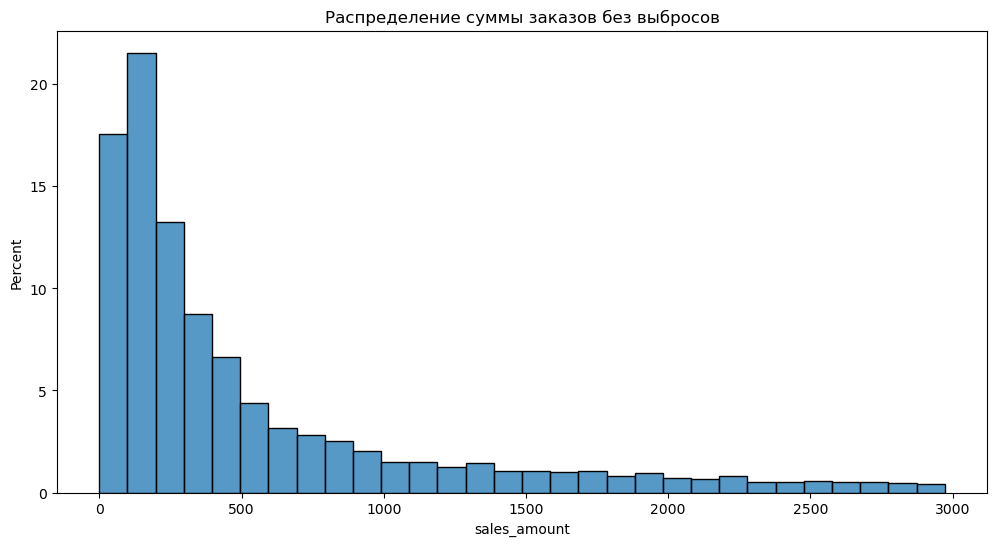

In [109]:
pylab.figure(figsize(12, 6))
plt.title('Распределение суммы заказов без выбросов')
ax=sns.histplot(df1['sales_amount'], stat='percent', binwidth=100)

Видим, что распределение переменной sales_amount не является нормальным. Логарифмирование переменной позволит убрать длинный правый "хвост":

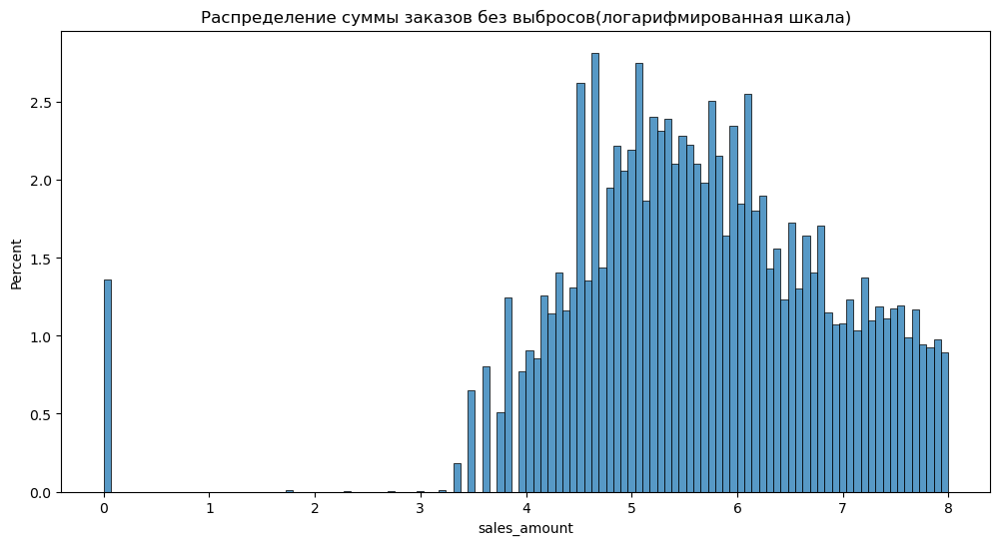

In [110]:
pylab.figure(figsize(12, 6))
plt.title('Распределение суммы заказов без выбросов(логарифмированная шкала)')
ax=sns.histplot(df1['sales_amount'].apply(lambda w: np.log(w + 1)), stat='percent')

In [111]:
df1['log_sales_amount']= df1['sales_amount'].apply(lambda w: np.log(w + 1))

/tmp/ipykernel_54114/3219128845.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['log_sales_amount']= df1['sales_amount'].apply(lambda w: np.log(w + 1))


### sales_qty

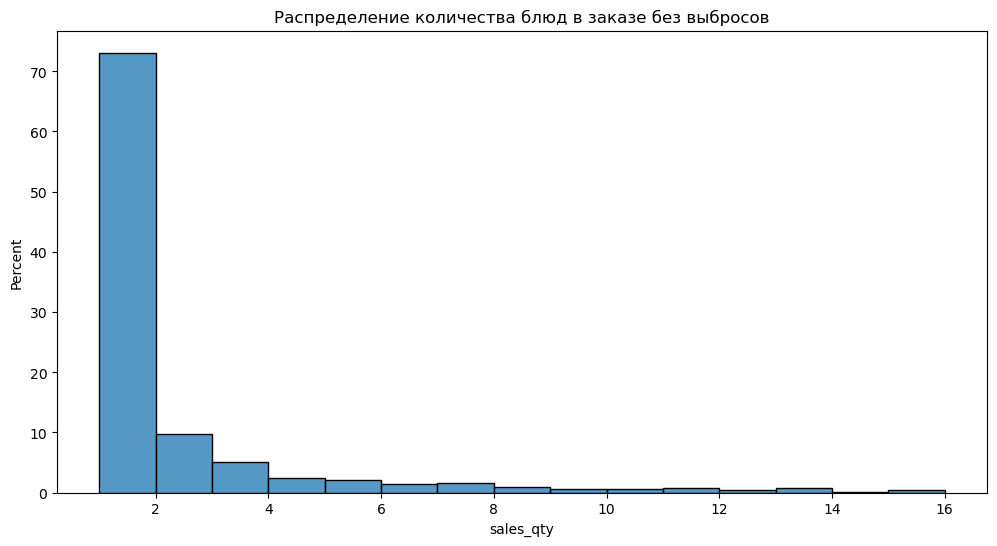

In [112]:
pylab.figure(figsize(12, 6))
plt.title('Распределение количества блюд в заказе без выбросов')
ax=sns.histplot(df1['sales_qty'], stat='percent', binwidth=1)

Видим, что распределение переменной sales_qty также не является нормальным.

### order_date

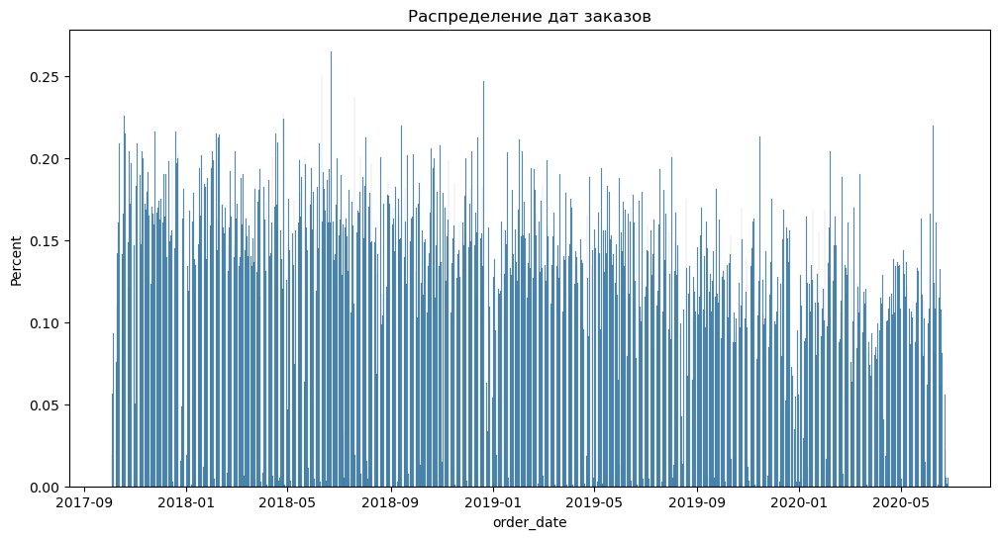

In [113]:
pylab.figure(figsize(12, 6))
plt.title('Распределение дат заказов')
ax=sns.histplot(df1['order_date'], stat='percent')

Первая и последняя дата покупок в датасете:

In [114]:
print(min(df1['order_date']), max(df1['order_date']))

2017-10-04 2020-06-26


Распределение количества заказов по датам не является нормальным согласно тесту Колмогорова-Смирнова:

In [115]:
from scipy.stats import kstest 
kstest(list(df1['order_date'].value_counts()), 'norm',
       args=(mean(list(df1['order_date'].value_counts())), 
             std(list(df1['order_date'].value_counts()),ddof=1)))

KstestResult(statistic=0.10913925584235118, pvalue=1.5141970041560546e-08, statistic_location=136, statistic_sign=-1)

Видно, что в нашем датасете покупок больше всего было сделано в 2018 и 2019 годах, однако нельзя сделать вывод о том, что 2017 и 2020 были неудачными, просто в 2017 отсутствуют данные за первые 3 месяца года, а в 2020 вообще за вторую половину года.

[Text(0, 0, '10.0197'),
 Text(0, 0, '41.5213'),
 Text(0, 0, '34.4296'),
 Text(0, 0, '14.0294')]

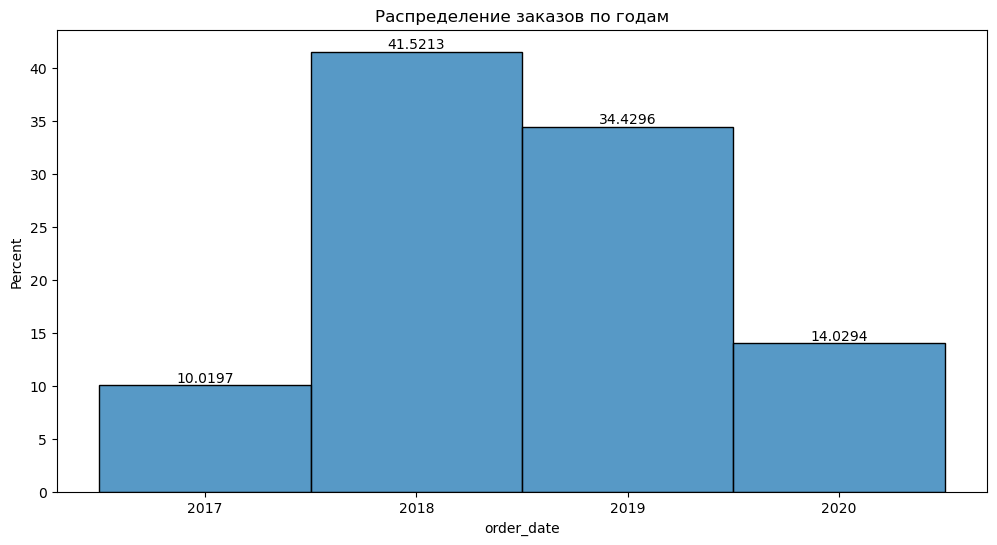

In [116]:
pylab.figure(figsize(12, 6))
plt.title('Распределение заказов по годам')
plt.xticks([2017, 2018, 2019, 2020])
ax=sns.histplot(df1['order_date'].apply(lambda x: x.year), discrete=True, stat='percent')
ax.bar_label (ax.containers [ 0 ])

Видно, что количество заказов распределено близко к равномерному по месяцам. Также заметно, что количество заказов в декабре каждого года сильно проседает по сравнению с предыдущими месяцами того же года: 

[Text(0, 0, '2.90885'),
 Text(0, 0, '3.72811'),
 Text(0, 0, '3.38273'),
 Text(0, 0, '3.56954'),
 Text(0, 0, '3.47112'),
 Text(0, 0, '3.45472'),
 Text(0, 0, '3.41918'),
 Text(0, 0, '3.57227'),
 Text(0, 0, '3.73175'),
 Text(0, 0, '3.64153'),
 Text(0, 0, '3.58594'),
 Text(0, 0, '3.32258'),
 Text(0, 0, '3.53947'),
 Text(0, 0, '3.27428'),
 Text(0, 0, '2.93893'),
 Text(0, 0, '3.1221'),
 Text(0, 0, '3.19682'),
 Text(0, 0, '3.09202'),
 Text(0, 0, '2.90612'),
 Text(0, 0, '3.2196'),
 Text(0, 0, '2.86055'),
 Text(0, 0, '3.2032'),
 Text(0, 0, '2.5334'),
 Text(0, 0, '2.75211'),
 Text(0, 0, '2.78947'),
 Text(0, 0, '2.58443'),
 Text(0, 0, '2.16979'),
 Text(0, 0, '2.5899'),
 Text(0, 0, '2.71292'),
 Text(0, 0, '2.26274'),
 Text(0, 0, '2.31013'),
 Text(0, 0, '2.30922'),
 Text(0, 0, '1.84446')]

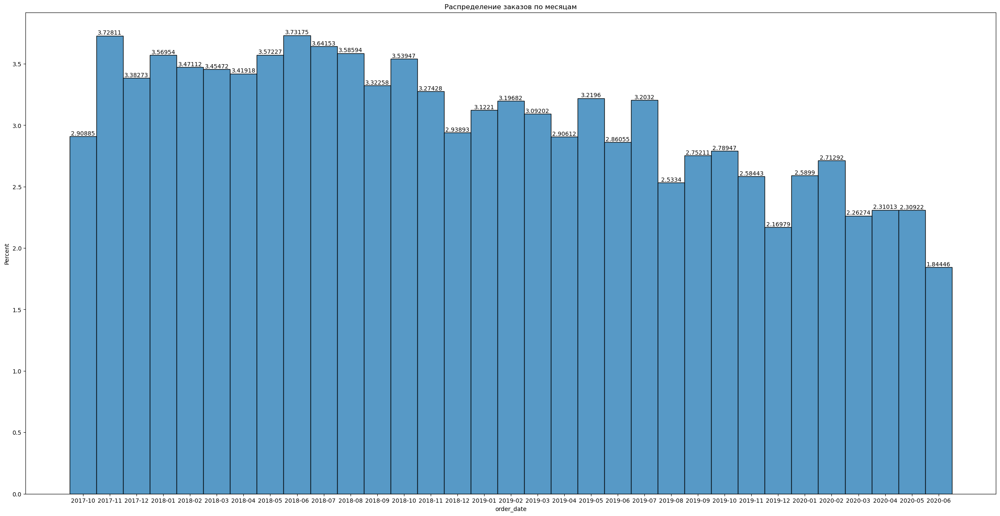

In [117]:
pylab.figure(figsize(30, 15))
plt.title('Распределение заказов по месяцам')
ax=sns.histplot(df1['order_date'].apply(lambda x: x.strftime("%Y-%m")).sort_values(), discrete=True, stat='percent')
ax.bar_label (ax.containers [ 0 ])

Очень информативным оказалось распределение заказов по дням недели: видно, что в выходной день заказов более чем в 50 раз меньше, чем в любой другой будний день:

[Text(0, 0, '18.1612'),
 Text(0, 0, '19.4242'),
 Text(0, 0, '19.16'),
 Text(0, 0, '19.6029'),
 Text(0, 0, '23.2453'),
 Text(0, 0, '0.308018'),
 Text(0, 0, '0.0984198')]

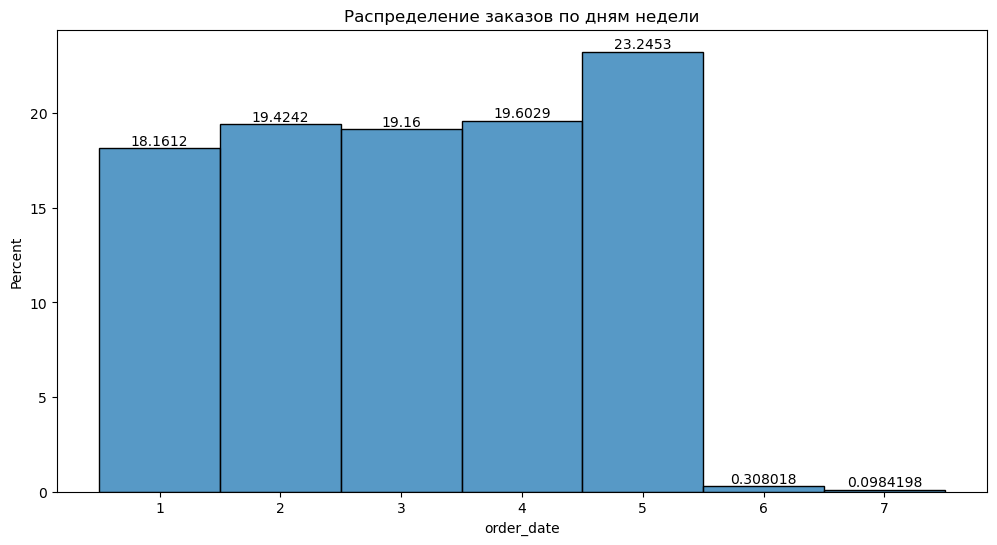

In [118]:
pylab.figure(figsize(12, 6))
plt.title('Распределение заказов по дням недели')
ax=sns.histplot(df1['order_date'].apply(lambda x: x.isoweekday()), discrete=True, stat='percent')
ax.bar_label (ax.containers [ 0 ])

In [119]:
df1['weekday']=df1['order_date'].apply(lambda x: str(x.isoweekday()))

/tmp/ipykernel_54114/1598146597.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['weekday']=df1['order_date'].apply(lambda x: str(x.isoweekday()))


Логарифмированная сумма заказа имеет примерно одинаковую медиану для всех дней, кроме воскресенья. Скорее всего это связано с тем, что у нас всего в районе 100 заказов в воскресенье:

Text(0, 0.5, 'Логарифм суммы заказа')

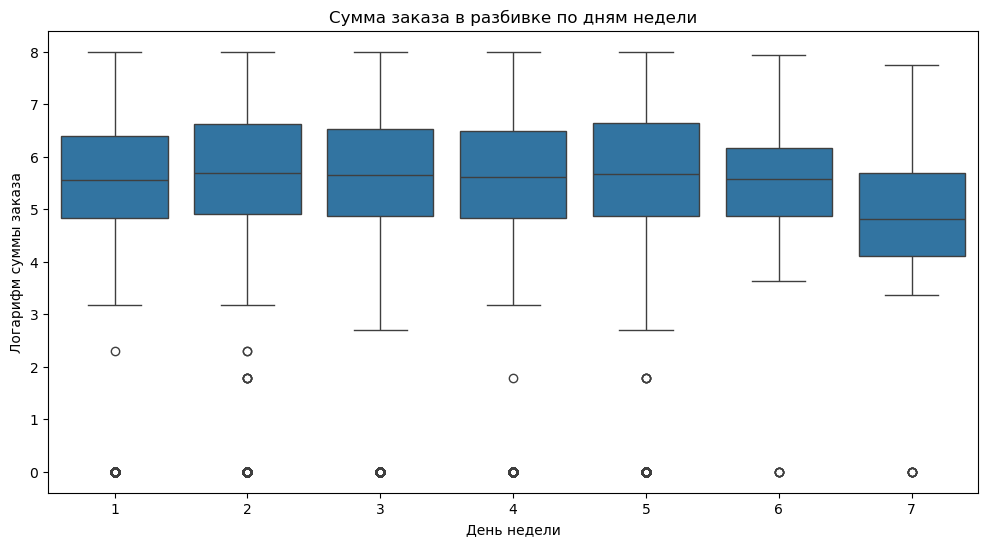

In [120]:
plt.figure(figsize=(12,6))

g = sns.boxplot(x='weekday', 
                y='log_sales_amount', 
                order=['1', '2', '3', '4', '5', '6', '7'],
                data=df1);

g.set_title('Сумма заказа в разбивке по дням недели')
g.set_xlabel('День недели')
g.set_ylabel('Логарифм суммы заказа')

In [121]:
df1

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food,log_sales_amount,weekday
1,2019-03-07,1,130.0,49226,555824,Teresa Garcia,27,Male,Married,Self Employeed,...,"Aminabad,Lucknow",3.9,Too Few Ratings,250.0,American,Fast Food,No,No,4.875197,4
2,2018-04-06,1,875.0,5321,158203,Donald Anderson,24,Male,Married,Employee,...,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No,6.775366,5
4,2018-04-17,2,2676.0,5321,399517,Donald Anderson,24,Male,Married,Employee,...,"Akota,Vadodara",3.9,Too Few Ratings,1000.0,Chinese,Other,Indian,No,7.892452,2
5,2018-04-11,1,583.0,21343,187912,Scott Cruz,22,Male,Single,Student,...,Abohar,3.7,20+ ratings,250.0,Indian,Fast Food,No,No,6.369901,3
7,2017-10-16,1,32.0,75378,532347,Heather Richardson,28,Male,Married,Employee,...,"Alipore,Kolkata",3.9,Too Few Ratings,150.0,Chinese,Other,Indian,No,3.496508,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148656,2019-01-11,1,2884.0,40949,181681,Nicole Cooper,25,Male,Single,Self Employeed,...,Yavatmal,3.9,Too Few Ratings,200.0,Indian,Other,No,No,7.967280,5
148657,2019-01-11,1,1625.0,9221,197786,Joy Smith,24,Male,Single,Student,...,Yavatmal,3.9,Too Few Ratings,200.0,Other,Bakery,No,No,7.393878,5
148659,2019-01-17,1,1523.0,53604,242762,Aaron Mccarthy,25,Male,Single,Student,...,Yavatmal,3.9,Too Few Ratings,250.0,Other,Fast Food,No,Pizza,7.329094,4
148660,2019-01-23,1,1477.0,3414,562647,Mr. Reginald Chen,23,Male,Single,Student,...,Yavatmal,3.9,Too Few Ratings,300.0,Other,Pizza,No,No,7.298445,3


Корреляционная матрица таблицы df1:

<Axes: >

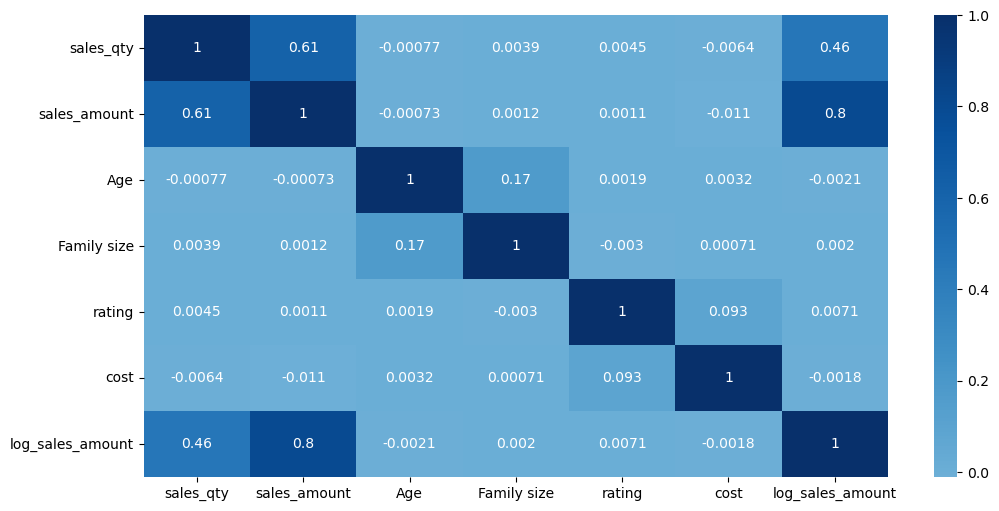

In [122]:
sns.heatmap(df1.corr(numeric_only = True), 
            xticklabels=df1.corr(numeric_only = True).columns, yticklabels=df1.corr(numeric_only = True).columns, cmap='Blues', center=0, annot=True)

### Линейная регрессия

Построим линейную регрессию, где зависимой переменной будет сумма заказа(sales_amount):

In [123]:
df1_new=df1.drop(['user_id','r_id','name', 'restaurant_name', 'order_date', 'city', 'log_sales_amount'], axis=1)
df1_reg = pd.get_dummies(df1_new, drop_first=True)
df1_reg.head()

,sales_qty,sales_amount,Age,Family size,rating,cost,Gender_Male,Marital Status_Prefer not to say,Marital Status_Single,Occupation_House wife,...,additional_food_Street Food,additional_food_Sweet,additional_food_Tandoor,additional_food_Thalis,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,weekday_7
1,1,130.0,27,6,3.9,250.0,True,False,False,False,...,False,False,False,False,False,False,True,False,False,False
2,1,875.0,24,3,3.8,100.0,True,False,False,False,...,False,False,False,False,False,False,False,True,False,False
4,2,2676.0,24,3,3.9,1000.0,True,False,False,False,...,False,False,False,False,True,False,False,False,False,False
5,1,583.0,22,3,3.7,250.0,True,False,True,False,...,False,False,False,False,False,True,False,False,False,False
7,1,32.0,28,3,3.9,150.0,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [124]:
cols = df1_reg.columns
cols = [i.replace(' ', '_') for i in cols]
cols = [i.replace('+', '') for i in cols]
cols = [i.replace('.', '_') for i in cols]
df1_reg.columns = cols

df1_reg1 = df1_reg.drop('sales_amount', axis=1)
text = ''
for i in list(df1_reg1.columns):
    text += f'+ {i} '
text = text[1:]
text

' sales_qty + Age + Family_size + rating + cost + Gender_Male + Marital_Status_Prefer_not_to_say + Marital_Status_Single + Occupation_House_wife + Occupation_Self_Employeed + Occupation_Student + Monthly_Income_25001_to_50000 + Monthly_Income_Below_Rs_10000 + Monthly_Income_More_than_50000 + Monthly_Income_No_Income + Educational_Qualifications_Ph_D + Educational_Qualifications_Post_Graduate + Educational_Qualifications_School + Educational_Qualifications_Uneducated + rating_count_10K_ratings + rating_count_1K_ratings + rating_count_20_ratings + rating_count_50_ratings + rating_count_500_ratings + rating_count_5K_ratings + rating_count_Too_Few_Ratings + cuisine_Arabian + cuisine_Asian + cuisine_Bengali + cuisine_Chinese + cuisine_Continental + cuisine_Indian + cuisine_Italian + cuisine_Maharashtrian + cuisine_Mughlai + cuisine_Other + cuisine_Punjabi + food_Beverage + food_Biryani + food_Burger + food_Chaat + food_Combo + food_Dessert + food_Fast_Food + food_Healthy_Food + food_Ice_Cre

Видим, что значимыми на 5% уровне являются коэффициенты: sales_qty, cost, Educational_Qualifications_School, rating_count_1K_ratings, rating_count_Too_Few_Ratings, cuisine_Arabian, cuisine_Bengali, food_Street_Food,    additional_food_Ice_Cream,  additional_food_No, additional_food_Pasta, additional_food_Street_Food, weekday_2,
weekday_3, weekday_4, weekday_5, weekday_7.
Однако модель крайне плохо объясняет зависимую переменную, так как R2=0.374<0.5. Скорее всего это связано с малым количеством числовых переменных, коррелирующих с sales_amount, и с нелинейной зависимостью между объясняющими переменными и зависимой переменной.

In [125]:
ols2 = smf.ols(f'sales_amount ~ {text}', data=df1_reg).fit()
print(ols2.summary())

                            OLS Regression Results                            
Dep. Variable:           sales_amount   R-squared:                       0.374
Model:                            OLS   Adj. R-squared:                  0.374
Method:                 Least Squares   F-statistic:                     698.0
Date:                Sun, 31 Mar 2024   Prob (F-statistic):               0.00
Time:                        11:14:39   Log-Likelihood:            -8.3887e+05
No. Observations:              109734   AIC:                         1.678e+06
Df Residuals:                  109639   BIC:                         1.679e+06
Df Model:                          94                                         
Covariance Type:            nonrobust                                         
                                                       coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------

## Пользователи (users)

In [126]:
users

,user_id,name,Age,Gender,Marital Status,Occupation,Monthly Income,Educational Qualifications,Family size
0,1,Claire Ferguson,20,Female,Single,Student,No Income,Post Graduate,4
1,2,Jennifer Young,24,Female,Single,Student,Below Rs.10000,Graduate,3
2,3,Jermaine Roberson,22,Male,Single,Student,Below Rs.10000,Post Graduate,3
3,4,Rachel Carpenter,22,Female,Single,Student,No Income,Graduate,6
4,5,Shawn Parker,22,Male,Single,Student,Below Rs.10000,Post Graduate,4
...,...,...,...,...,...,...,...,...,...
99995,99996,James Ellis,23,Female,Prefer not to say,Employee,10001 to 25000,Graduate,4
99996,99997,Justin Christensen,19,Male,Single,Student,No Income,Graduate,6
99997,99998,Mark Collier,21,Female,Single,Student,No Income,Graduate,2
99998,99999,Lori Henderson MD,23,Male,Single,Student,No Income,Graduate,4


Так как переменные sales_amount и sales_qty являются основными метриками, то на их основе получим три переменных для таблицы users:

    1) Общая сумма заказов для каждого пользователя (sum_sales_amount)
    2) Cуммарное количество блюд для каждого пользователя (sum_sales_qty)
    3) Количество заказов для каждого пользователя (order_qty)

In [127]:
q=df1.groupby('user_id').agg({'sales_amount':['sum'], 'sales_qty':['sum']}).reset_index()
paying_users=set(q['user_id'])
q=pd.DataFrame(q)
q

,user_id,sales_amount,sales_qty
,,sum,sum
0,1,1672.0,5
1,2,593.0,3
2,4,102.0,1
3,6,83.0,1
4,8,241.0,1
...,...,...,...
66827,99995,1454.0,3
66828,99996,1898.0,2
66829,99997,1783.0,5


In [128]:
q1=df1.groupby(['user_id'])['user_id'].count()
q1=pd.DataFrame(q1)
q1.columns=['count']
q1.reset_index(inplace=True)
q1

,user_id,count
0,1,2
1,2,2
2,4,1
3,6,1
4,8,1
...,...,...
66827,99995,2
66828,99996,2
66829,99997,2
66830,99998,1


In [129]:
sales_amount1=[0]*100000
sales_qty1=[0]*100000
order_qty1=[0]*100000
for i in tqdm(range(len(users['user_id']))):
    if users['user_id'][i] in paying_users:
        sales_amount1[i]=round(float(q[q['user_id']==users['user_id'][i]]['sales_amount']['sum']),2)
        sales_qty1[i]=round(float(q[q['user_id']==users['user_id'][i]]['sales_qty']['sum']),2)
        order_qty1[i]=int(q1[q1['user_id']==users['user_id'][i]]['count'])

  0%|                                                | 0/100000 [00:00<?, ?it/s]/tmp/ipykernel_54114/1069918553.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  sales_amount1[i]=round(float(q[q['user_id']==users['user_id'][i]]['sales_amount']['sum']),2)
/tmp/ipykernel_54114/1069918553.py:7: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  sales_qty1[i]=round(float(q[q['user_id']==users['user_id'][i]]['sales_qty']['sum']),2)
/tmp/ipykernel_54114/1069918553.py:8: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  order_qty1[i]=int(q1[q1['user_id']==users['user_id'][i]]['count'])
100%|█████████████████████████████████| 100000/100000 [01:08<00:00, 1453.27it/s]


In [130]:
users['sum_sales_amount']=sales_amount1
users['sum_sales_qty']=sales_qty1
users['order_qty']=order_qty1

Таблица users с новыми переменными:

In [131]:
users

,user_id,name,Age,Gender,Marital Status,Occupation,Monthly Income,Educational Qualifications,Family size,sum_sales_amount,sum_sales_qty,order_qty
0,1,Claire Ferguson,20,Female,Single,Student,No Income,Post Graduate,4,1672.0,5.0,2
1,2,Jennifer Young,24,Female,Single,Student,Below Rs.10000,Graduate,3,593.0,3.0,2
2,3,Jermaine Roberson,22,Male,Single,Student,Below Rs.10000,Post Graduate,3,0.0,0.0,0
3,4,Rachel Carpenter,22,Female,Single,Student,No Income,Graduate,6,102.0,1.0,1
4,5,Shawn Parker,22,Male,Single,Student,Below Rs.10000,Post Graduate,4,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99996,James Ellis,23,Female,Prefer not to say,Employee,10001 to 25000,Graduate,4,1898.0,2.0,2
99996,99997,Justin Christensen,19,Male,Single,Student,No Income,Graduate,6,1783.0,5.0,2
99997,99998,Mark Collier,21,Female,Single,Student,No Income,Graduate,2,875.0,1.0,1
99998,99999,Lori Henderson MD,23,Male,Single,Student,No Income,Graduate,4,88.0,1.0,1


In [132]:
users.describe()

,Age,Family size,sum_sales_amount,sum_sales_qty,order_qty
count,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000
mean,24.628580,3.280990,599.394000,2.16280,1.097340
std,2.971743,1.349242,876.570667,3.20683,1.041593
min,18.000000,1.000000,0.000000,0.00000,0.000000
25%,23.000000,2.000000,0.000000,0.00000,0.000000
50%,24.000000,3.000000,213.000000,1.00000,1.000000
75%,26.000000,4.000000,815.000000,3.00000,2.000000
max,33.000000,6.000000,8402.000000,40.00000,9.000000


### order_qty

[Text(0, 0, '33.168'),
 Text(0, 0, '36.775'),
 Text(0, 0, '20.324'),
 Text(0, 0, '7.229'),
 Text(0, 0, '1.997'),
 Text(0, 0, '0.421'),
 Text(0, 0, '0.073'),
 Text(0, 0, '0.012'),
 Text(0, 0, '0'),
 Text(0, 0, '0.001')]

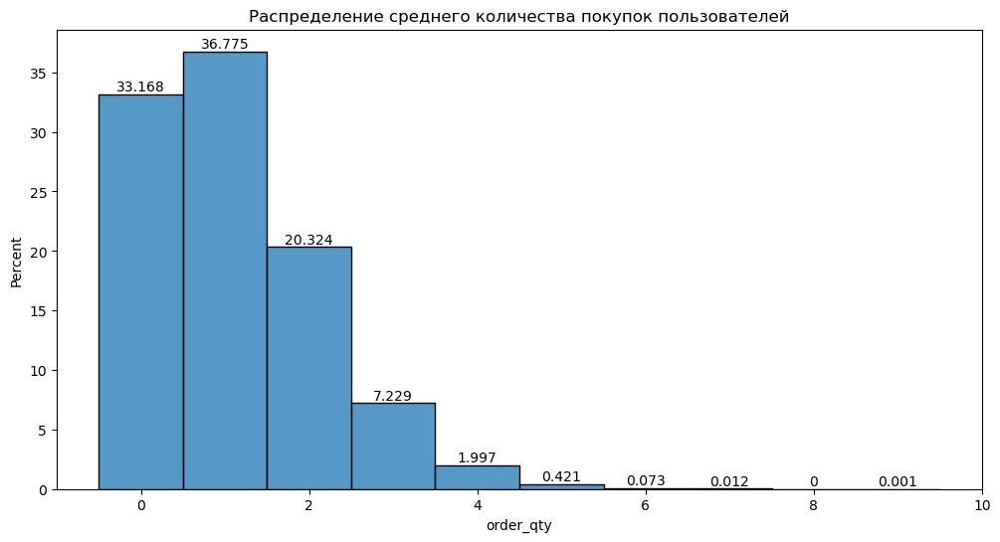

In [133]:
pylab.figure(figsize(12, 6))
plt.title('Распределение среднего количества покупок пользователей')
ax=sns.histplot(users['order_qty'], discrete=True, stat='percent')
ax.bar_label (ax.containers [ 0 ])

Видно, что распределение переменной order_qty не является нормальным.

### sum_sales_amount

[Text(0, 0, '65.386'),
 Text(0, 0, '13.244'),
 Text(0, 0, '6.956'),
 Text(0, 0, '5.055'),
 Text(0, 0, '3.836'),
 Text(0, 0, '2.918'),
 Text(0, 0, '1.24'),
 Text(0, 0, '0.595'),
 Text(0, 0, '0.363'),
 Text(0, 0, '0.191'),
 Text(0, 0, '0.119'),
 Text(0, 0, '0.057'),
 Text(0, 0, '0.022'),
 Text(0, 0, '0.005'),
 Text(0, 0, '0.007'),
 Text(0, 0, '0.004'),
 Text(0, 0, '0.002')]

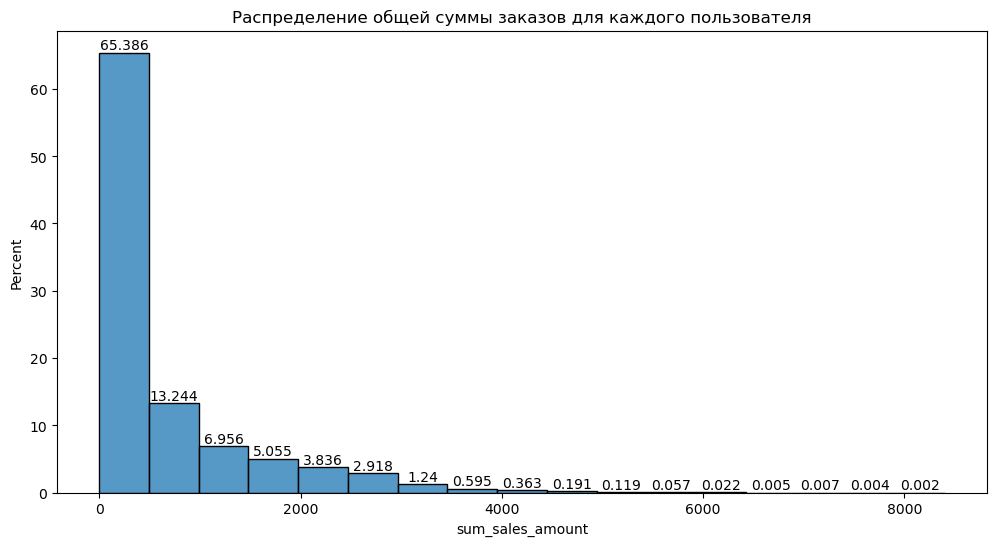

In [134]:
pylab.figure(figsize(12, 6))
plt.title('Распределение общей суммы заказов для каждого пользователя')
ax=sns.histplot(users['sum_sales_amount'], stat='percent', binwidth=500)
ax.bar_label (ax.containers [ 0 ])

Видно, что распределение переменной sum_sales_amount не является нормальным. Логарифмирование переменной позволит убрать длинный правый "хвост". Теперь распределение выглядит близким к нормальному, если исключить пользователей, не сделавших ни одного заказа:

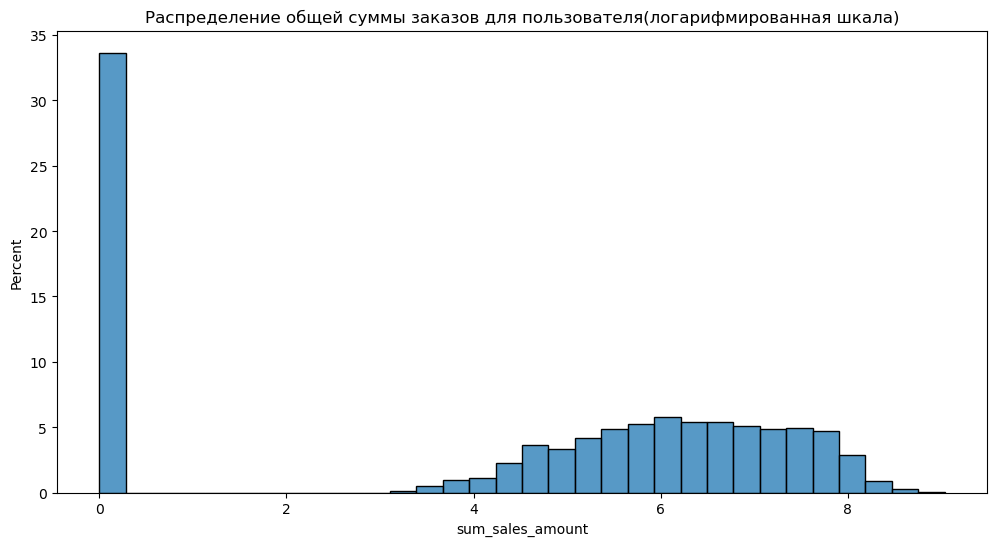

In [135]:
pylab.figure(figsize(12, 6))
plt.title('Распределение общей суммы заказов для пользователя(логарифмированная шкала)')
ax=sns.histplot(users['sum_sales_amount'].apply(lambda w: np.log(w + 1)), stat='percent')

### sum_sales_qty

[Text(0, 0, '81.938'),
 Text(0, 0, '9.343'),
 Text(0, 0, '4.071'),
 Text(0, 0, '2.186'),
 Text(0, 0, '1.501'),
 Text(0, 0, '0.671'),
 Text(0, 0, '0.161'),
 Text(0, 0, '0.071'),
 Text(0, 0, '0.036'),
 Text(0, 0, '0.016'),
 Text(0, 0, '0.005'),
 Text(0, 0, '0'),
 Text(0, 0, '0.001')]

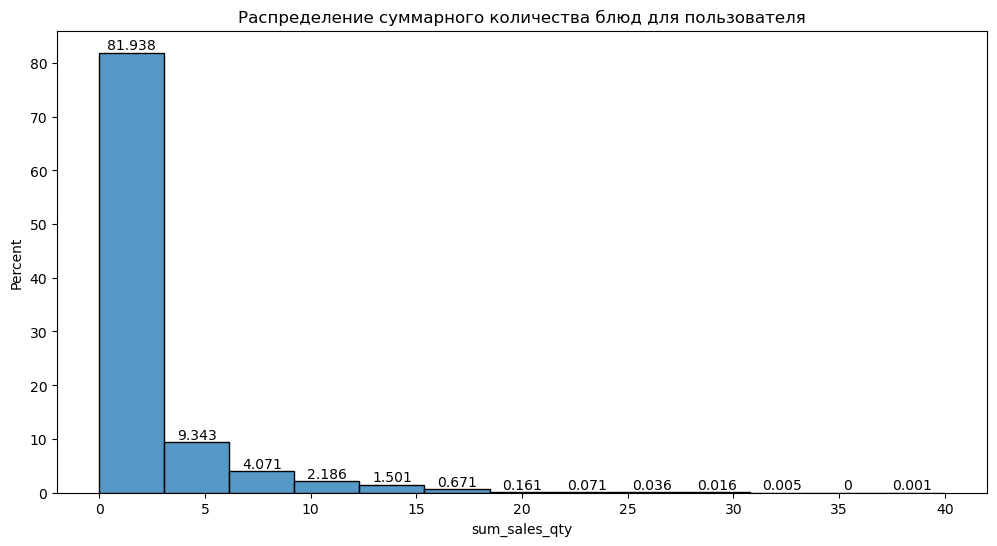

In [136]:
pylab.figure(figsize(12, 6))
plt.title('Распределение суммарного количества блюд для пользователя')
ax=sns.histplot(users['sum_sales_qty'], stat='percent', binwidth=3)
ax.bar_label (ax.containers [ 0 ])

Видно, что распределение переменной sum_sales_qty не является нормальным.

### Age

[Text(0, 0, '0.258'),
 Text(0, 0, '1.032'),
 Text(0, 0, '2.319'),
 Text(0, 0, '5.927'),
 Text(0, 0, '14.69'),
 Text(0, 0, '18.82'),
 Text(0, 0, '12.888'),
 Text(0, 0, '13.402'),
 Text(0, 0, '9.02'),
 Text(0, 0, '5.411'),
 Text(0, 0, '3.865'),
 Text(0, 0, '3.604'),
 Text(0, 0, '2.32'),
 Text(0, 0, '2.062'),
 Text(0, 0, '4.124'),
 Text(0, 0, '0.258')]

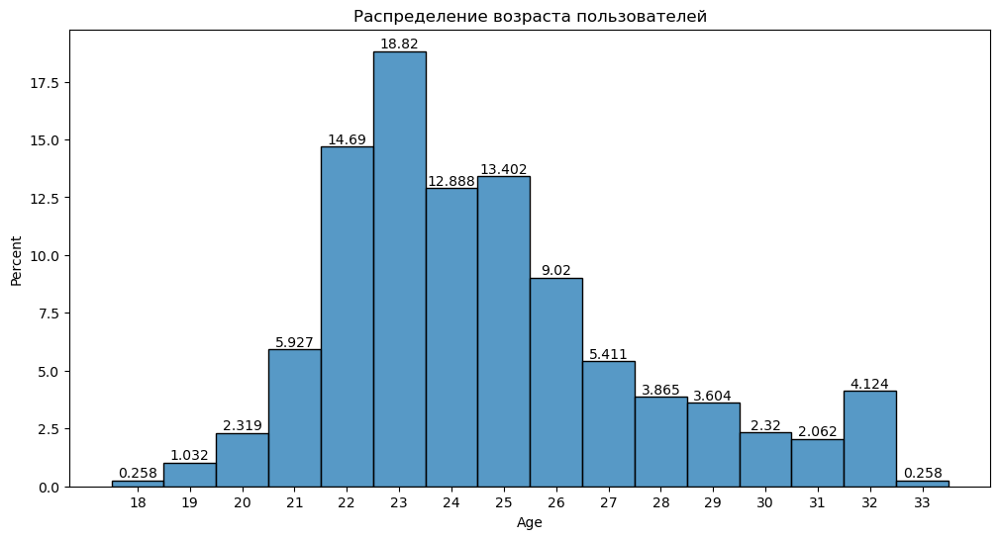

In [137]:
pylab.figure(figsize(12, 6))
plt.title('Распределение возраста пользователей')
plt.xticks(range(min(users['Age']), max(users['Age'])+1))
ax=sns.histplot(users['Age'], discrete=True, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменных sum_sales_amount, sum_sales_qty, order_qty по возрасту пользователя(Age):

In [138]:
d=users.groupby('Age').agg({'sum_sales_amount':['median', 'mean', 'std'],
                            'sum_sales_qty':['median', 'mean', 'std'],
                           'order_qty':['median', 'mean', 'std']}).reset_index()
d

Age sum_sales_amount                         sum_sales_qty            \
                 median        mean         std        median      mean   
0   18            351.5  713.062016  919.939300           1.0  2.406977   
1   19            241.0  607.846899  873.456658           1.0  2.187016   
2   20            204.0  608.131091  927.080134           1.0  2.177663   
3   21            204.0  582.306901  851.837307           1.0  2.130758   
4   22            213.0  599.868142  883.632058           1.0  2.159632   
5   23            213.0  596.000266  879.313278           1.0  2.156801   
6   24            222.0  601.327980  866.626070           1.0  2.163718   
7   25            213.0  592.226981  862.627181           1.0  2.153261   
8   26            226.0  623.189690  893.134623           1.0  2.213969   
9   27            213.0  591.323785  853.871868           1.0  2.107559   
10  28            204.0  588.420699  883.945642           1.0  2.157309   
11  29            241.0  644.878191  919.083218           1.0  2.310211   
12  30            204.0  581.551293  852.307450           1.0  2.158190   
13  31            217.5  599.783220  883.267539           1.0  2.160039   
14  32            194.0  581.610087  876.277524           1.0  2.089476   
15  33            187.5  570.120155  855.353367           1.0  2.120155   

             order_qty                      
         std    median      mean       std  
0   3.219751       1.0  1.174419  1.019558  
1   3.097965       1.0  1.158915  1.078823  
2   3.415112       1.0  1.068564  1.048870  
3   3.208937       1.0  1.085709  1.048476  
4   3.247528       1.0  1.085705  1.027337  
5   3.221925       1.0  1.088363  1.038963  
6   3.184707       1.0  1.109792  1.047993  
7   3.137774       1.0  1.110058  1.044659  
8   3.214080       1.0  1.115410  1.051446  
9   3.070864       1.0  1.100536  1.039276  
10  3.252820       1.0  1.071928  1.046537  
11  3.365479       1.0  1.126526  1.048942  
12  3.263275       1.0  1.081466  1.027774  
13  3.226767       1.0  1.093113  1.022816  
14  3.124469       1.0  1.080262  1.038716  
15  3.043955       1.0  1.058140  1.029011

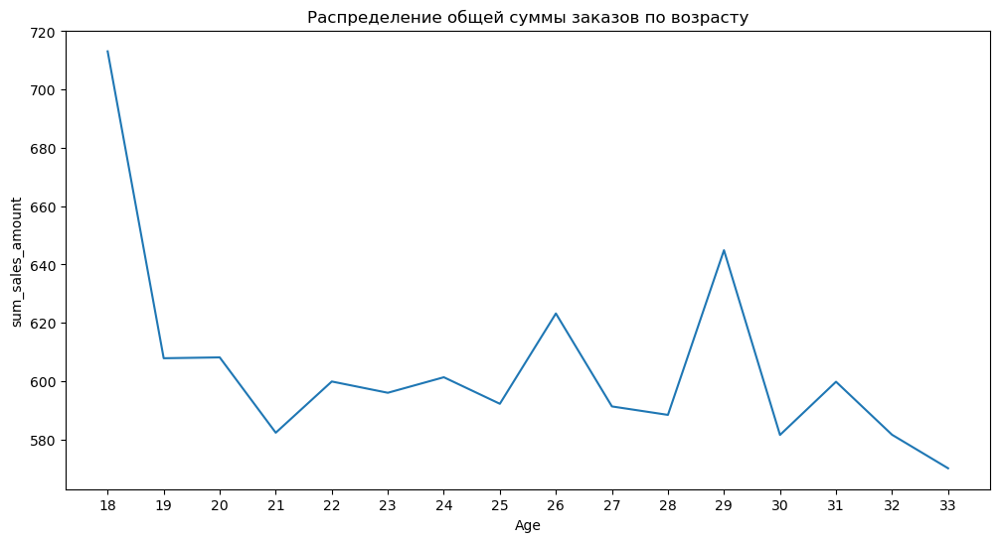

In [139]:
pylab.figure(figsize(12, 6))
plt.title('Распределение общей суммы заказов по возрасту')
plt.xticks(range(min(users['Age']), max(users['Age'])+1))
d1=pd.DataFrame({'Age':d['Age'],'sum_sales_amount':d['sum_sales_amount']['mean']})
ax=sns.lineplot(data=d1, x="Age", y="sum_sales_amount")

Протестируем гипотезу о равенстве sum_sales_amount для групп: 

    1)Пользователи младше 25 лет (включая 25 лет)
    2)Пользователи старше 25 лет

Мы видим, что наши группы независимы, но распределения групп не заданы конкретным распределением, поэтому мы не можем применить t-test. Однако для того, чтобы сделать распределения нормальными, воспользуемся бакетным преобразованием:
Разобьем каждую из групп случайным образом на N равных по числу элементов бакетов. Посчитаем средние величины для каждого бакета. Распределения получившихся средних величин будут распределены близко к нормальному по ЦПТ (главное, чтобы количество элементов в каждом бакете превышало 30!). Теперь применим t-test о равенстве средних для бакетов разных групп. Получившийся результат можно обобщить и на первоначальную гипотезу:

In [140]:
kstest(users[users['Age']<=25]['sum_sales_amount'], 'norm', 
       args=(users[users['Age']<=25]['sum_sales_amount'].mean(),
             users[users['Age']<=25]['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.24732801673263216, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

In [141]:
kstest(users[users['Age']>25]['sum_sales_amount'], 'norm', 
       args=(users[users['Age']>25]['sum_sales_amount'].mean(),
             users[users['Age']>25]['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.246426900110218, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

In [142]:
from sklearn.model_selection import KFold
def Bucketization(y1,y2,splits,column):
    kf1 = KFold(n_splits=splits, random_state=51, shuffle=True)
    kf2 = KFold(n_splits=splits, random_state=100, shuffle=True)
    r1 = list(kf1.split(y1))
    r2 = list(kf2.split(y2))
    s1=[0]*splits
    s2=[0]*splits
    for j in range(len(r1)):
        for n in range(len(r1[j][1])):
            s1[j]=s1[j]+float(y1[y1.index==int(r1[j][1][n])][column])
    for i in range(len(s1)):
        s1[i]=round(s1[i]/len(r1[i][1]),2)
    for j in range(len(r2)):
        for n in range(len(r2[j][1])):
            s2[j]=s2[j]+float(y2[y2.index==int(r2[j][1][n])][column])
    for i in range(len(s2)):
        s2[i]=round(s2[i]/len(r2[i][1]),2)
    return s1,s2,len(r1[-1][1]),len(r2[-1][1])

Разбиваем группы случайным образом на 200 бакетов:

In [143]:
y1 = pd.DataFrame(users[users['Age']<=25], columns=users.columns).reset_index(drop=True)
y2 = pd.DataFrame(users[users['Age']>25], columns=users.columns).reset_index(drop=True)
s1,s2,n1,n2 = Bucketization(y1,y2,200, 'sum_sales_amount')
print('Количество элементов в бакете для users[Age]<=25:', {n1})
print('Количество элементов в бакете для users[Age]>25:', {n2})

/tmp/ipykernel_54114/1724550939.py:11: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  s1[j]=s1[j]+float(y1[y1.index==int(r1[j][1][n])][column])
/tmp/ipykernel_54114/1724550939.py:16: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  s2[j]=s2[j]+float(y2[y2.index==int(r2[j][1][n])][column])


Количество элементов в бакете для users[Age]<=25: {346}
Количество элементов в бакете для users[Age]>25: {153}


Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов первой группы является нормальным:

ShapiroResult(statistic=0.987320065498352, pvalue=0.07122877985239029)
KstestResult(statistic=0.05394849940270441, pvalue=0.5863055369060908, statistic_location=600.19, statistic_sign=1)


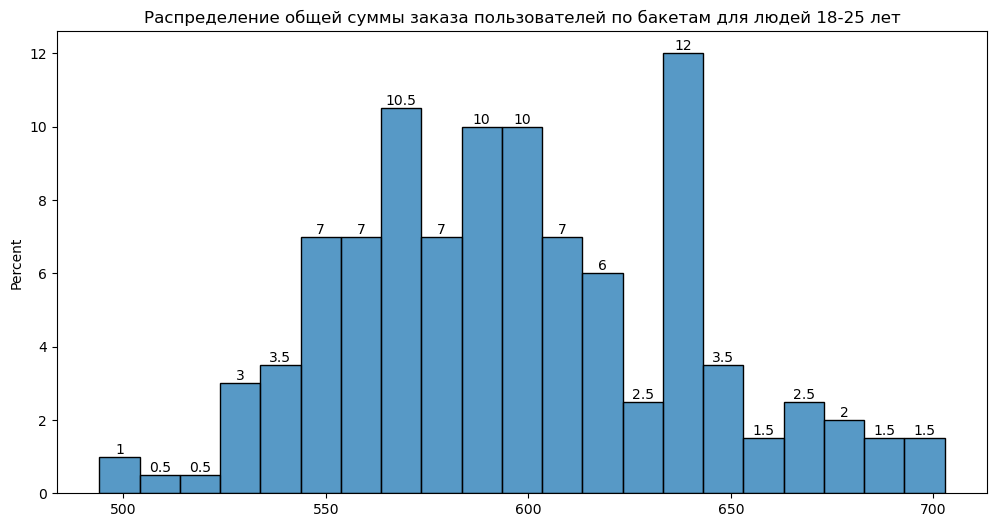

In [144]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
plt.title('Распределение общей суммы заказа пользователей по бакетам для людей 18-25 лет')
ax=sns.histplot(s1, stat='percent', binwidth=10)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s1))
print(kstest(s1, 'norm', args=(mean(s1),std(s1,ddof=1))))

Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов второй группы является нормальным:

ShapiroResult(statistic=0.9894282221794128, pvalue=0.14724503457546234)
KstestResult(statistic=0.05869202091709996, pvalue=0.47824888661752607, statistic_location=588.1, statistic_sign=1)


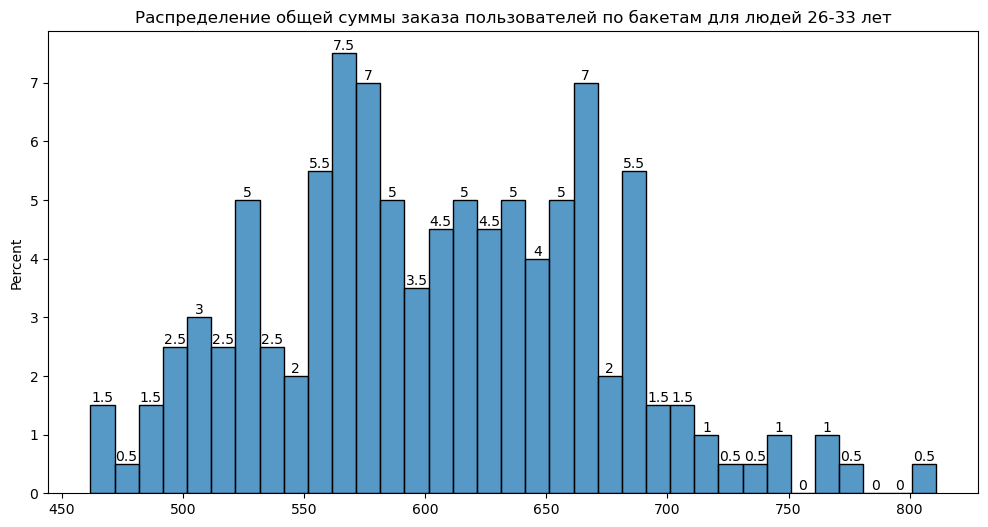

In [145]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
from scipy.stats import shapiro
plt.title('Распределение общей суммы заказа пользователей по бакетам для людей 26-33 лет')
ax=sns.histplot(s2, stat='percent', binwidth=10)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s2))
print(kstest(s2, 'norm', args=(mean(s2),std(s2,ddof=1))))

Убедившись в нормальности распределений, проведем t-test о равенстве средних:

In [146]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=-1.4343722134876933, pvalue=0.15225130929501424, df=398.0)

На 5% уровне значимости нельзя отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних значений sum_sales_amount для групп: 

    1)Пользователи младше 25 лет (включая 25 лет)
    2)Пользователи старше 25 лет
    
**нельзя отвергнуть.**

### Gender

[Text(0, 0, '42.782'), Text(0, 0, '57.218')]

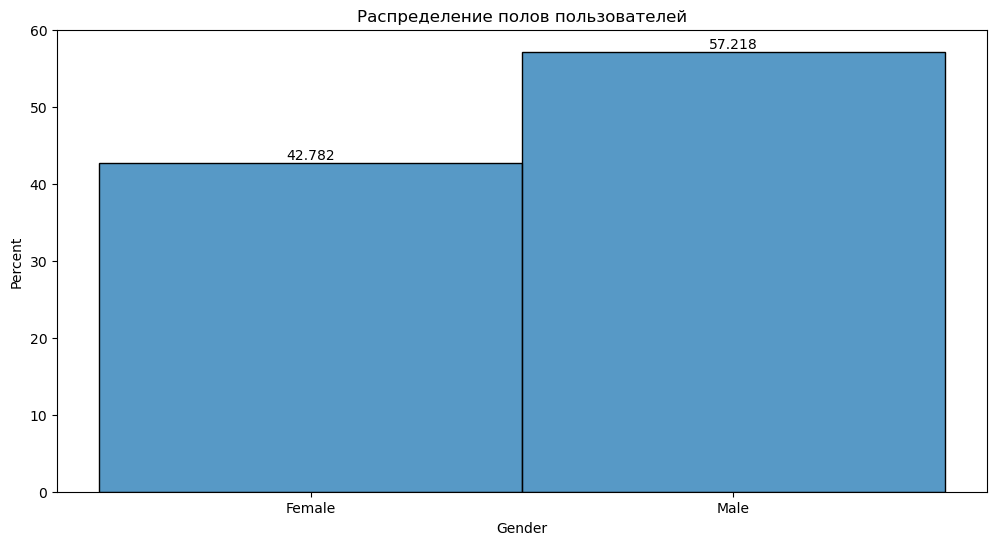

In [147]:
plt.title('Распределение полов пользователей')
ax=sns.histplot(users['Gender'], stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменных sum_sales_amount, sum_sales_qty, order_qty по полу пользователя(Gender):

In [148]:
d=users.groupby('Gender').agg({'sum_sales_amount':['median', 'mean', 'std'],
                            'sum_sales_qty':['median', 'mean', 'std'],
                              'order_qty':['median', 'mean', 'std']}).reset_index()
x1=users[users['Gender']=='Female']['sum_sales_amount']
x2=users[users['Gender']=='Male']['sum_sales_amount']
d

Gender sum_sales_amount                         sum_sales_qty            \
                    median        mean         std        median      mean   
0  Female            218.0  603.766140  877.737740           1.0  2.168950   
1    Male            213.0  596.124943  875.690437           1.0  2.158202   

            order_qty                      
        std    median      mean       std  
0  3.199589       1.0  1.102800  1.041212  
1  3.212254       1.0  1.093257  1.041868

Протестируем гипотезу о равенстве средних значений sum_sales_amount для групп: 

    1) Женщины(Female)
    2) Мужчины(Male)

Мы видим, что наши группы независимы, но распределения групп не задаются конкретным распределнием, поэтому мы не можем применить t-test. Поэтому применим бакетное преобразование.

In [149]:
kstest(users[users['Gender']=='Female']['sum_sales_amount'], 'norm', 
       args=(users[users['Gender']=='Female']['sum_sales_amount'].mean(),
             users[users['Gender']=='Female']['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.24576851587259546, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

In [150]:
kstest(users[users['Gender']=='Male']['sum_sales_amount'], 'norm', 
       args=(users[users['Gender']=='Male']['sum_sales_amount'].mean(),
             users[users['Gender']=='Male']['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.24801532399457304, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

Разбиваем группы случайным образом на 200 бакетов:

In [151]:
y1 = pd.DataFrame(users[users['Gender']=='Female'], columns=users.columns).reset_index(drop=True)
y2 = pd.DataFrame(users[users['Gender']=='Male'], columns=users.columns).reset_index(drop=True)
s1, s2, n1, n2 = Bucketization(y1,y2,200, 'sum_sales_amount')
print('Количество элементов в бакете для users[Gender]==Female:', {n1})
print('Количество элементов в бакете для users[Gender]==Male:', {n2})

/tmp/ipykernel_54114/1724550939.py:11: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  s1[j]=s1[j]+float(y1[y1.index==int(r1[j][1][n])][column])
/tmp/ipykernel_54114/1724550939.py:16: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  s2[j]=s2[j]+float(y2[y2.index==int(r2[j][1][n])][column])


Количество элементов в бакете для users[Gender]==Female: {213}
Количество элементов в бакете для users[Gender]==Male: {286}


Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов первой группы является нормальным:

ShapiroResult(statistic=0.9949720501899719, pvalue=0.7458928823471069)
KstestResult(statistic=0.043544000454834086, pvalue=0.8264997082161979, statistic_location=634.87, statistic_sign=1)


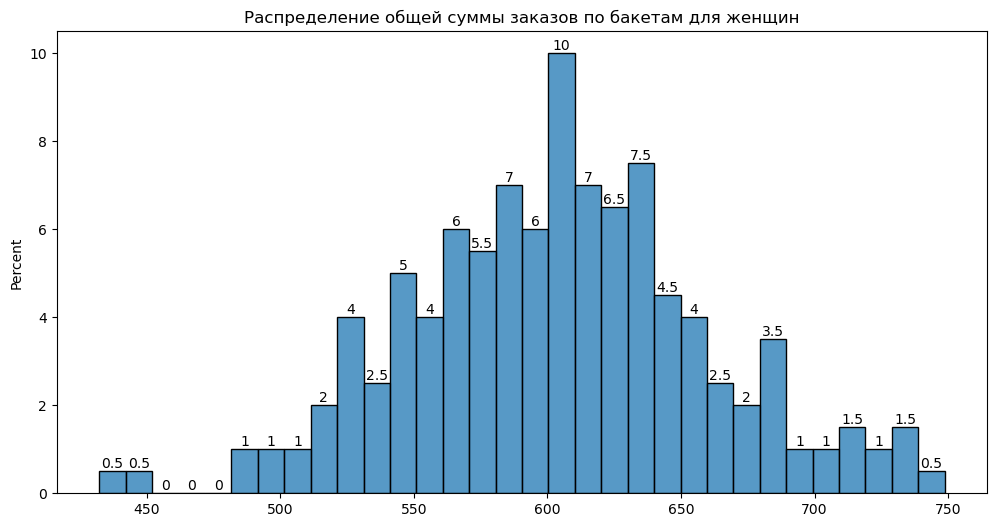

In [152]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
from scipy.stats import shapiro
plt.title('Распределение общей суммы заказов по бакетам для женщин')
ax=sns.histplot(s1, stat='percent', binwidth=10)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s1))
print(kstest(s1, 'norm', args=(mean(s1),std(s1,ddof=1))))

Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов второй группы является нормальным:

ShapiroResult(statistic=0.9924378991127014, pvalue=0.3907150626182556)
KstestResult(statistic=0.05633423696390094, pvalue=0.5309106752840992, statistic_location=610.38, statistic_sign=1)


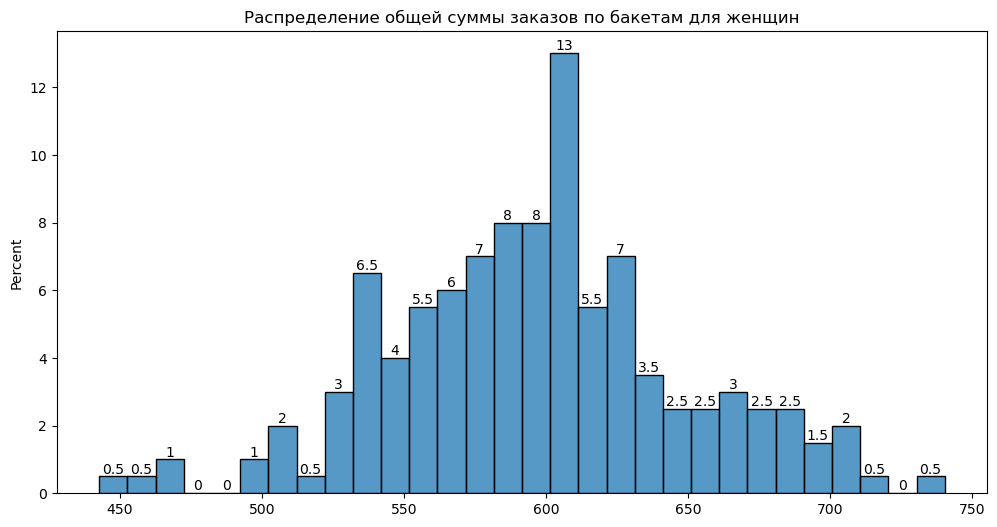

In [153]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
from scipy.stats import shapiro
plt.title('Распределение общей суммы заказов по бакетам для женщин')
ax=sns.histplot(s2, stat='percent', binwidth=10)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s2))
print(kstest(s2, 'norm', args=(mean(s2),std(s2,ddof=1))))

Убедившись в нормальности распределений, проведем t-test о равенстве средних:

In [154]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=1.4229596478450024, pvalue=0.15553119413633937, df=398.0)

На 5% уровне значимости нельзя отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних значений sum_sales_amount для групп: 

    1) Женщины(Female)
    2) Мужчины(Male)
    
**нельзя отвергнуть.**

### Family size

[Text(0, 0, '6.186'),
 Text(0, 0, '26.026'),
 Text(0, 0, '30.155'),
 Text(0, 0, '16.241'),
 Text(0, 0, '13.92'),
 Text(0, 0, '7.472')]

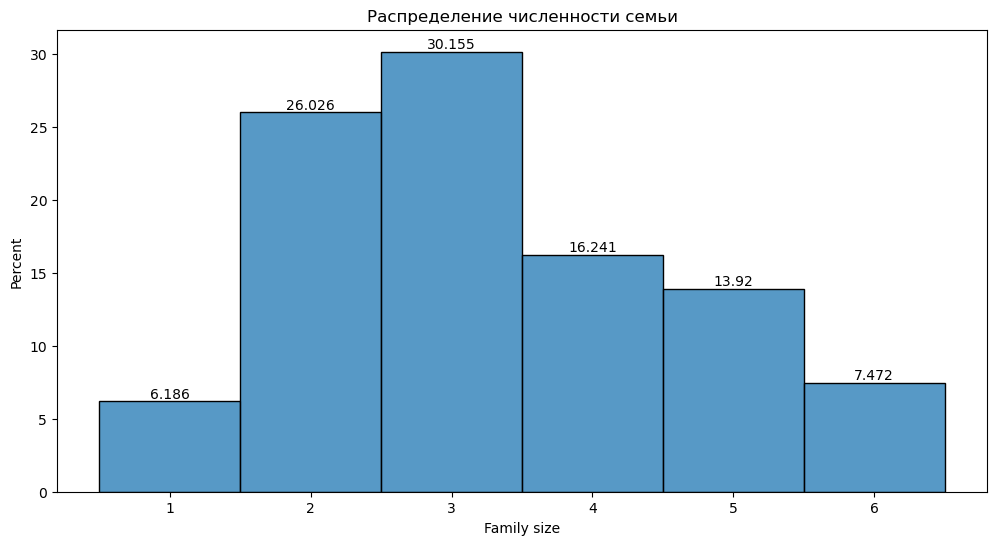

In [155]:
plt.title('Распределение численности семьи')
ax=sns.histplot(users['Family size'], discrete=True, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменных sum_sales_amount, sum_sales_qty, order_qty по размеру семьи пользователя(Family size):

In [156]:
d=users.groupby('Family size').agg({'sum_sales_amount':['median', 'mean', 'std'],
                            'sum_sales_qty':['median', 'mean', 'std'],
                                   'order_qty':['median', 'mean', 'std']}).reset_index()
d

Family size sum_sales_amount                         sum_sales_qty  \
                        median        mean         std        median   
0           1            215.0  591.292111  873.042657           1.0   
1           2            213.0  604.021171  885.181889           1.0   
2           3            213.0  593.565512  869.737602           1.0   
3           4            213.0  600.310264  874.751920           1.0   
4           5            218.0  603.454023  877.742133           1.0   
5           6            213.0  603.951419  878.686950           1.0   

                      order_qty                      
       mean       std    median      mean       std  
0  2.108632  3.107947       1.0  1.098771  1.032116  
1  2.175286  3.226370       1.0  1.100092  1.050799  
2  2.139546  3.167730       1.0  1.093119  1.037509  
3  2.180346  3.274818       1.0  1.091189  1.037533  
4  2.177874  3.197833       1.0  1.103161  1.034496  
5  2.191783  3.243151       1.0  1.106130  1.055725

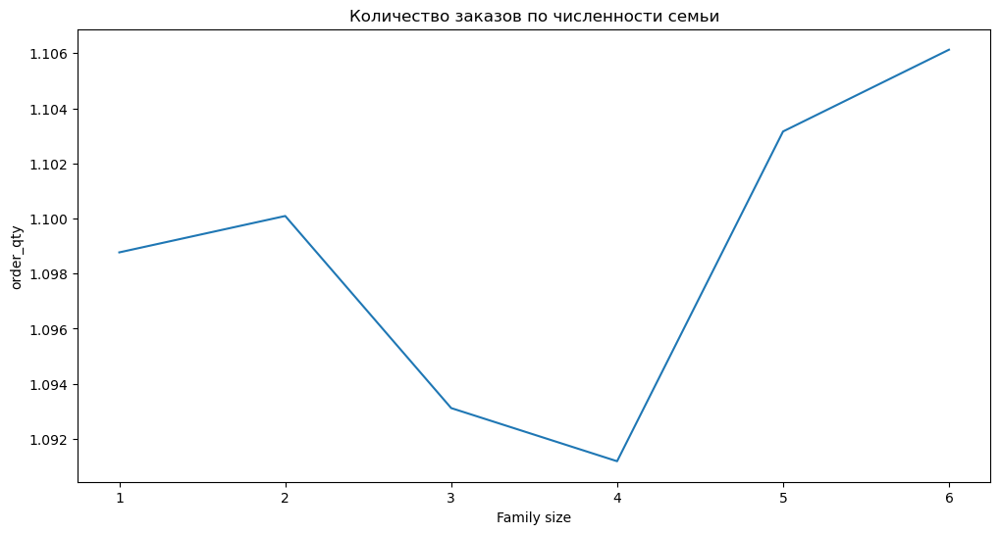

In [157]:
pylab.figure(figsize(12, 6))
plt.title('Количество заказов по численности семьи')
d1=pd.DataFrame({'Family size':d['Family size'],'order_qty':d['order_qty']['mean']})
ax=sns.lineplot(data=d1, x="Family size", y="order_qty")

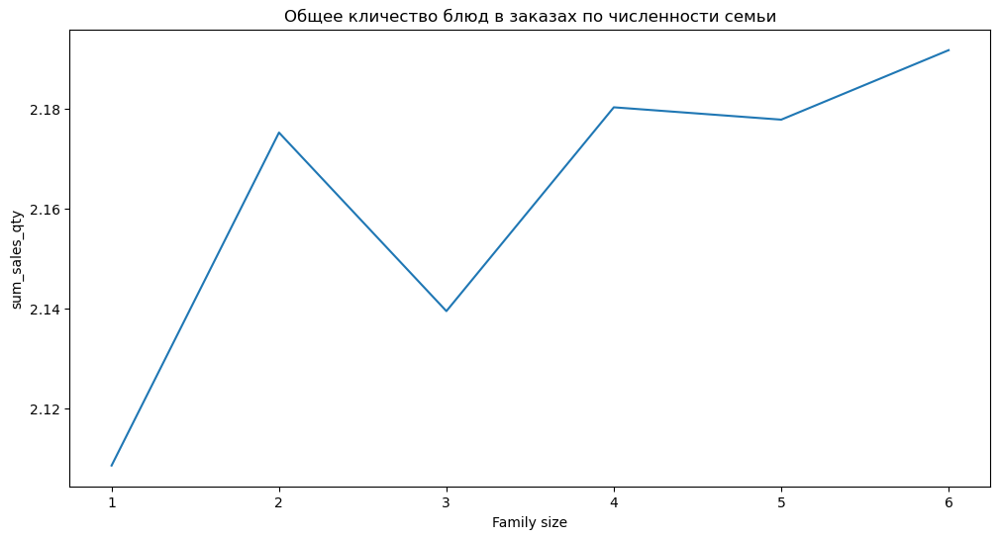

In [158]:
pylab.figure(figsize(12, 6))
plt.title('Общее кличество блюд в заказах по численности семьи')
d1=pd.DataFrame({'Family size':d['Family size'],'sum_sales_qty':d['sum_sales_qty']['mean']})
ax=sns.lineplot(data=d1, x="Family size", y="sum_sales_qty")

Протестируем гипотезу о равенстве среднего количества блюд в заказе для групп: 

    1)Пользователи с размером семьи меньшим 3 (включая 3)
    2)Пользователи с размером семьи большим 3

Так как метрика среднего количества блюд в заказе является ratio-метрикой, то применим линеризацию.

In [159]:
def linerization(y1,y2,column):
    ratio=y1[column].sum()/y1['order_qty'].sum()
    lin1=y1[column]-ratio*y1['order_qty']
    lin2=y2[column]-ratio*y2['order_qty']
    return lin1,lin2

In [160]:
y1 = pd.DataFrame(users[users['Family size']<=3], columns=users.columns).reset_index(drop=True)
y2 = pd.DataFrame(users[users['Family size']>3], columns=users.columns).reset_index(drop=True)
s1,s2 = linerization(y1,y2,'sum_sales_qty')

[Text(0, 0, '0.713518'),
 Text(0, 0, '42.2499'),
 Text(0, 0, '46.3306'),
 Text(0, 0, '5.13894'),
 Text(0, 0, '2.69373'),
 Text(0, 0, '1.69641'),
 Text(0, 0, '0.846602'),
 Text(0, 0, '0.243719'),
 Text(0, 0, '0.0416887'),
 Text(0, 0, '0.0368785'),
 Text(0, 0, '0.00801706')]

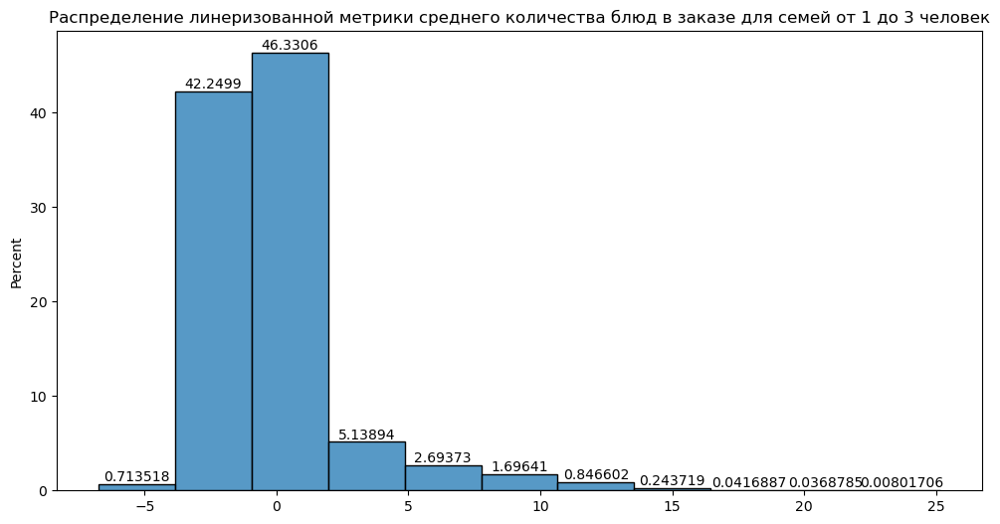

In [161]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
from scipy.stats import shapiro
plt.title('Распределение линеризованной метрики среднего количества блюд в заказе для семей от 1 до 3 человек')
ax=sns.histplot(s1, stat='percent', binwidth=3)
ax.bar_label (ax.containers [ 0 ])

[Text(0, 0, '0.79983'),
 Text(0, 0, '46.1138'),
 Text(0, 0, '44.0624'),
 Text(0, 0, '4.46151'),
 Text(0, 0, '2.08328'),
 Text(0, 0, '1.71392'),
 Text(0, 0, '0.595222'),
 Text(0, 0, '0.10629'),
 Text(0, 0, '0.0372014'),
 Text(0, 0, '0.0132862'),
 Text(0, 0, '0.010629'),
 Text(0, 0, '0.00265724')]

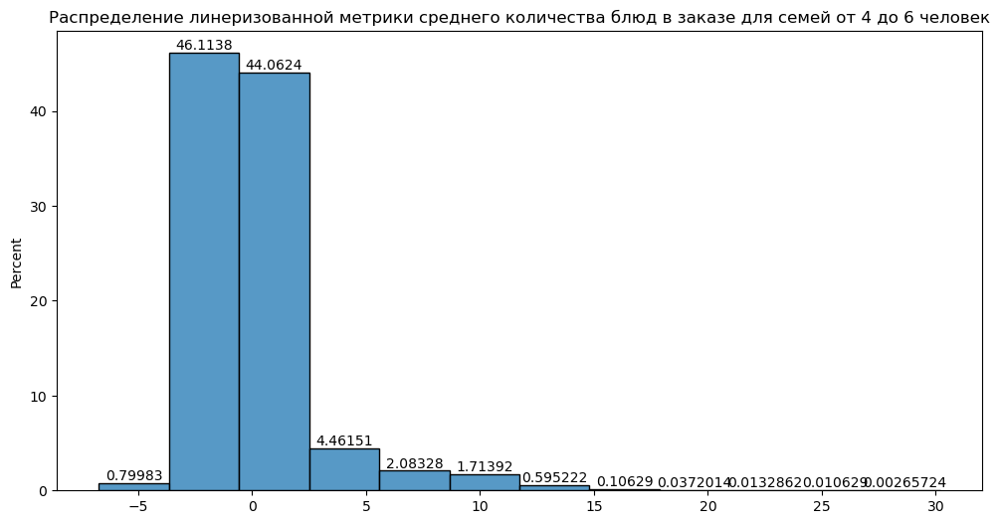

In [162]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
from scipy.stats import shapiro
plt.title('Распределение линеризованной метрики среднего количества блюд в заказе для семей от 4 до 6 человек')
ax=sns.histplot(s2, stat='percent', binwidth=3)
ax.bar_label (ax.containers [ 0 ])

Проведем t-test о равенстве средних:

In [163]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=-1.6379639705707516, pvalue=0.10143235618689361, df=99998.0)

На 5% уровне значимости нельзя отвергнуть гипотезу о равенстве средних. Следовательно, равенство среднего количества блюд в заказе для групп: 

    1)Пользователи с размером семьи меньшим 3 (включая 3)
    2)Пользователи с размером семьи большим 3
    
**нельзя отвергнуть на 5% уровне значимости.**

### Occupation

[Text(0, 0, '53.357'),
 Text(0, 0, '30.408'),
 Text(0, 0, '13.913'),
 Text(0, 0, '2.322')]

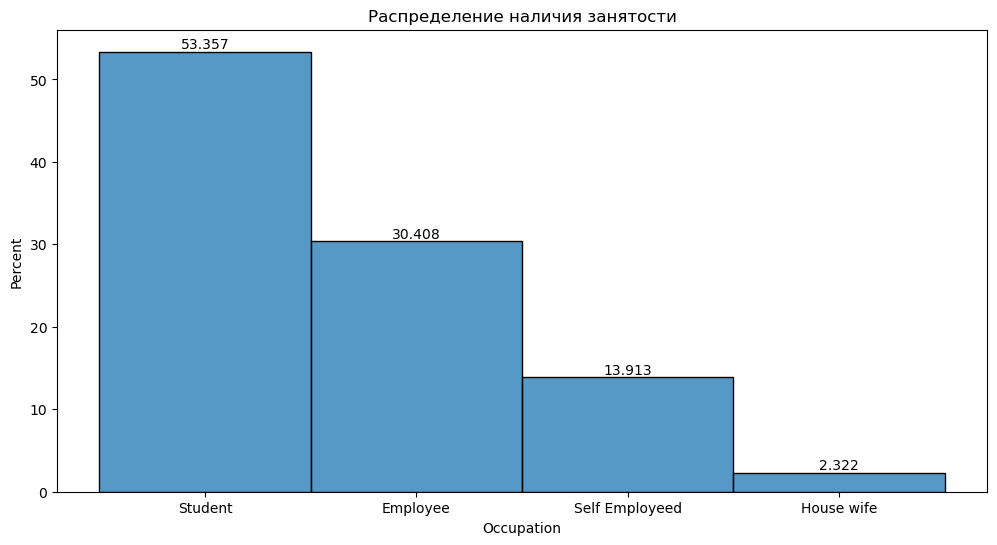

In [164]:
plt.title('Распределение наличия занятости')
ax=sns.histplot(users['Occupation'], discrete=True, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменных sum_sales_amount, sum_sales_qty, order_qty по типу занятости пользователя(Occupation):

In [165]:
d=users.groupby('Occupation').agg({'sum_sales_amount':['median', 'mean', 'std'],
                            'sum_sales_qty':['median', 'mean', 'std'],
                                  'order_qty':['median', 'mean', 'std']}).reset_index()
d

Occupation sum_sales_amount                         sum_sales_qty  \
                            median        mean         std        median   
0        Employee            213.0  600.071922  876.672656           1.0   
1      House wife            222.0  598.536176  874.432618           1.0   
2  Self Employeed            218.0  603.627471  875.843895           1.0   
3         Student            213.0  597.941095  876.815423           1.0   

                      order_qty                      
       mean       std    median      mean       std  
0  2.163279  3.208573       1.0  1.100007  1.049360  
1  2.159776  3.184796       1.0  1.091731  1.020991  
2  2.159132  3.128842       1.0  1.105944  1.038707  
3  2.163615  3.226905       1.0  1.093821  1.038796

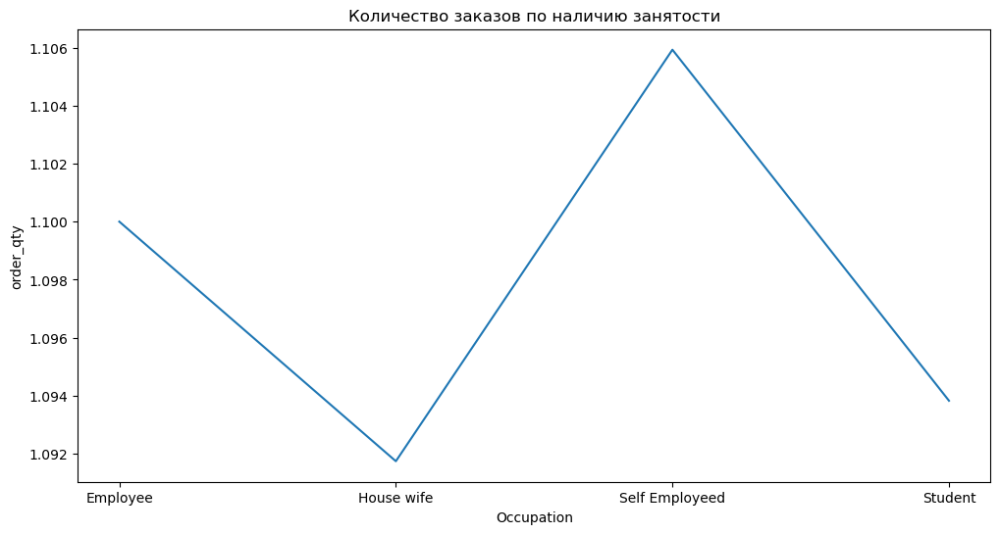

In [166]:
pylab.figure(figsize(12, 6))
plt.title('Количество заказов по наличию занятости')
d1=pd.DataFrame({'Occupation':d['Occupation'],'order_qty':d['order_qty']['mean']})
ax=sns.lineplot(data=d1, x="Occupation", y="order_qty")

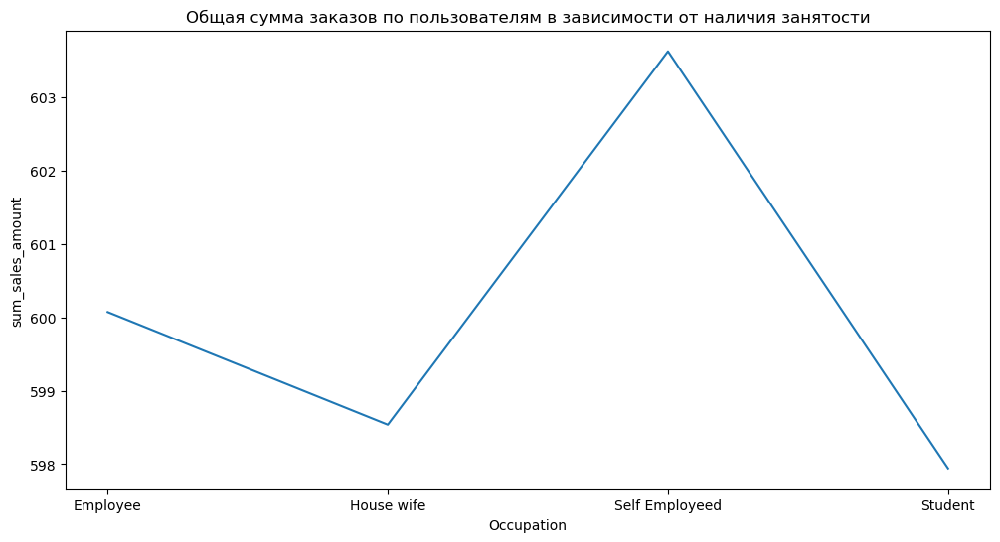

In [167]:
pylab.figure(figsize(12, 6))
plt.title('Общая сумма заказов по пользователям в зависимости от наличия занятости')
d1=pd.DataFrame({'Occupation':d['Occupation'],'sum_sales_amount':d['sum_sales_amount']['mean']})
ax=sns.lineplot(data=d1, x="Occupation", y="sum_sales_amount")

Протестируем гипотезу о равенстве средних чеков для групп: 

    1) Наемные сотруднки(занятые)
    2) Студенты

Так как средний чек является ratio-метрикой, то применим линеризацию.

In [168]:
y1 = pd.DataFrame(users[users['Occupation']=='Employee'], columns=users.columns).reset_index(drop=True)
y2 = pd.DataFrame(users[users['Occupation']=='Student'], columns=users.columns).reset_index(drop=True)
s1,s2 = linerization(y1,y2,'sum_sales_amount')


[Text(0, 0, '0.131544'),
 Text(0, 0, '2.17706'),
 Text(0, 0, '29.7455'),
 Text(0, 0, '52.6408'),
 Text(0, 0, '7.45527'),
 Text(0, 0, '4.79479'),
 Text(0, 0, '2.37438'),
 Text(0, 0, '0.47356'),
 Text(0, 0, '0.144699'),
 Text(0, 0, '0.0460405'),
 Text(0, 0, '0.0131544'),
 Text(0, 0, '0'),
 Text(0, 0, '0.00328861')]

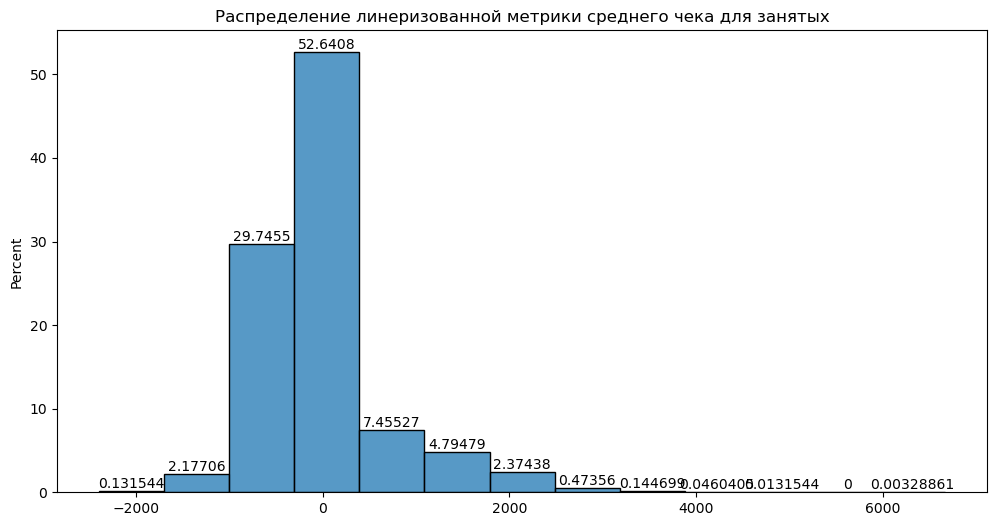

In [169]:
pylab.figure(figsize(12, 6))
plt.title('Распределение линеризованной метрики среднего чека для занятых')
ax=sns.histplot(s1, stat='percent', binwidth=700)
ax.bar_label (ax.containers [ 0 ])

[Text(0, 0, '0.129318'),
 Text(0, 0, '2.88247'),
 Text(0, 0, '33.8662'),
 Text(0, 0, '49.3056'),
 Text(0, 0, '7.10497'),
 Text(0, 0, '4.52799'),
 Text(0, 0, '1.66614'),
 Text(0, 0, '0.346721'),
 Text(0, 0, '0.133066'),
 Text(0, 0, '0.0243642'),
 Text(0, 0, '0.0131192')]

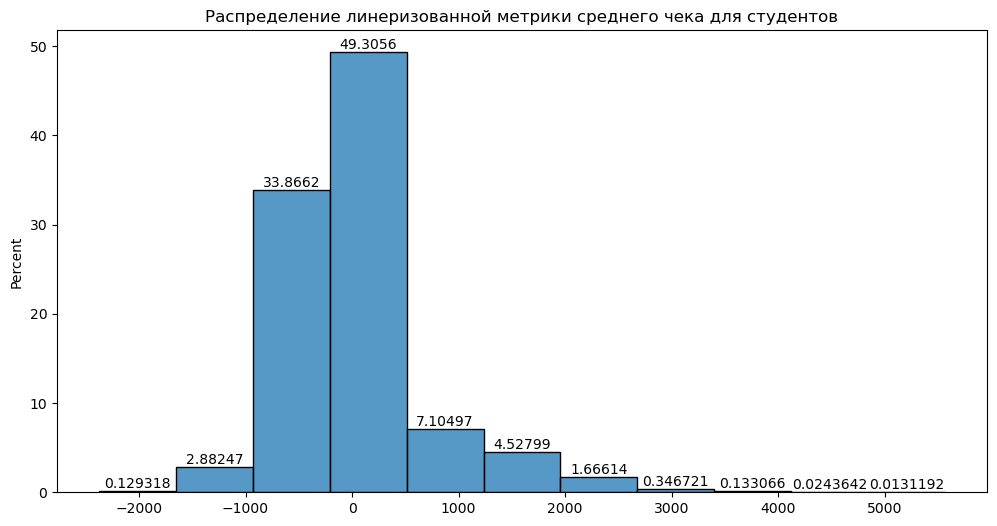

In [170]:
pylab.figure(figsize(12, 6))
plt.title('Распределение линеризованной метрики среднего чека для студентов')
ax=sns.histplot(s2, stat='percent', binwidth=700)
ax.bar_label (ax.containers [ 0 ])

Проведем t-test о равенстве средних:

In [171]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=-0.25911526326484635, pvalue=0.7955469452368727, df=83763.0)

На 5% уровне значимости нельзя отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних чеков  для групп: 

    1) Наемные сотруднки(занятые)
    2) Студенты
    
**нельзя отвергнуть.**

### Monthly Income

[Text(0, 0, '48.204'),
 Text(0, 0, '6.442'),
 Text(0, 0, '11.599'),
 Text(0, 0, '17.779'),
 Text(0, 0, '15.976')]

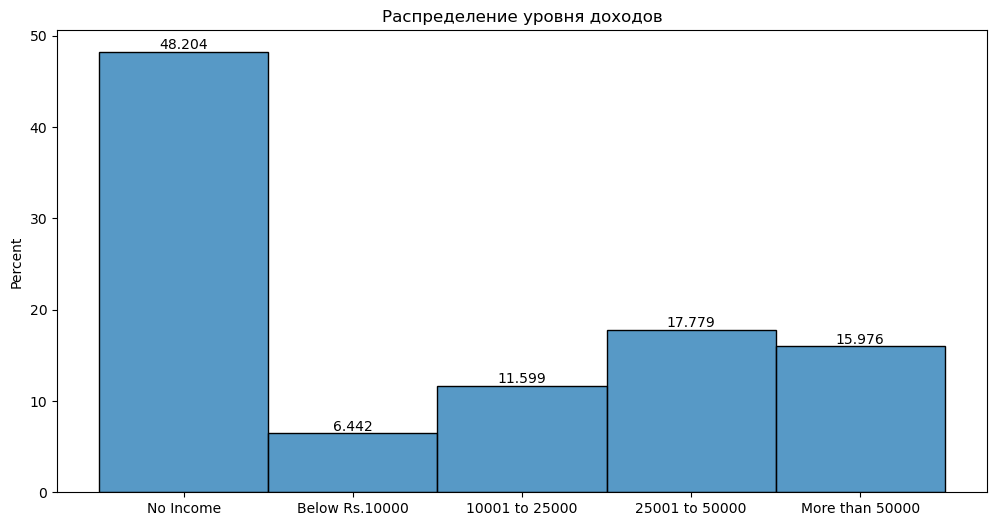

In [172]:
plt.title('Распределение уровня доходов')
income = pd.Categorical(users['Monthly Income'], ['No Income','Below Rs.10000', '10001 to 25000', '25001 to 50000', 'More than 50000'])
ax=sns.histplot(income, discrete=True, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменных sum_sales_amount, sum_sales_qty, order_qty по уровню дохода пользователя(Monthly Income):

In [173]:
d=pd.DataFrame(users.groupby('Monthly Income').agg({'sum_sales_amount':['median', 'mean', 'std'],
                            'sum_sales_qty':['median', 'mean', 'std'],
                                    'order_qty':['median', 'mean', 'std']}).reset_index())
a = copy(d[0:1])
d[0:1]=d[4:5]
d[4:5]=d[3:4]
d[3:4]=d[1:2]
d[1:2]=d[2:3]
d[2:3] = a
d


Monthly Income sum_sales_amount                         sum_sales_qty  \
                             median        mean         std        median   
0        No Income            213.0  596.852730  876.732839           1.0   
1   Below Rs.10000            218.0  609.486184  888.327816           1.0   
2   10001 to 25000            213.0  595.003190  872.092865           1.0   
3   25001 to 50000            209.0  604.021430  878.098505           1.0   
4  More than 50000            218.0  601.030421  872.894345           1.0   

                      order_qty                      
       mean       std    median      mean       std  
0  2.158866  3.221499       1.0  1.094453  1.040345  
1  2.209407  3.259003       1.0  1.104005  1.038037  
2  2.129753  3.145516       1.0  1.091732  1.041988  
3  2.159402  3.183041       1.0  1.096518  1.045225  
4  2.183650  3.211786       1.0  1.108350  1.042491

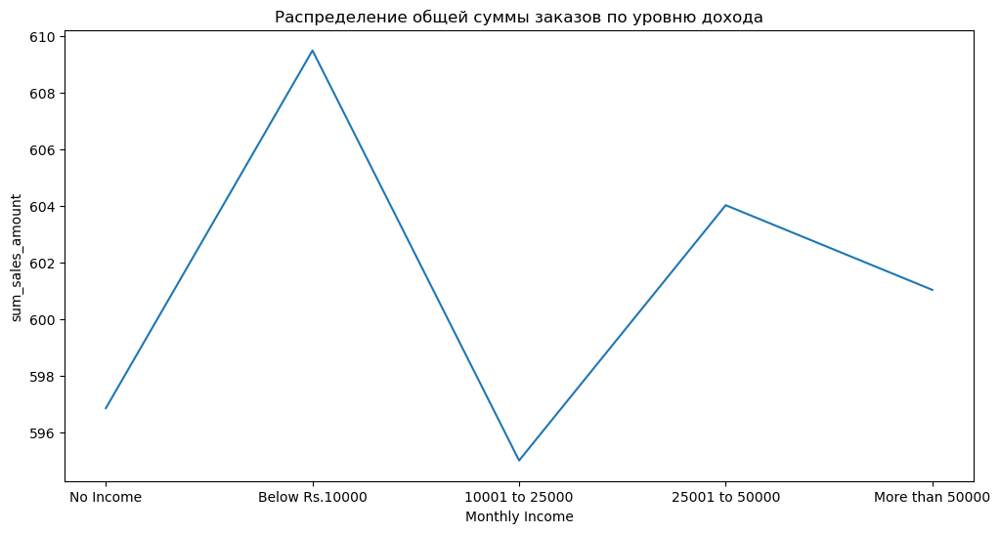

In [174]:
pylab.figure(figsize(12, 6))
plt.title('Распределение общей суммы заказов по уровню дохода')
d1=pd.DataFrame({'Monthly Income':d['Monthly Income'],'sum_sales_amount':d['sum_sales_amount']['mean']})
ax=sns.lineplot(data=d1, x="Monthly Income", y="sum_sales_amount")

Протестируем гипотезу о равенстве средних значений sum_sales_amount для групп: 

    1)Пользователи с отсутствием ежемесячного дохода
    2)Пользователи, у которых есть ежемесячный доход

Мы видим, что наши группы независимы, но распределения групп не задаются конкретным распределением, поэтому мы не можем применить t-test. Поэтому применим бакетное преобразование.

In [175]:
kstest(users[users['Monthly Income']=='No Income']['sum_sales_amount'], 'norm', 
       args=(users[users['Monthly Income']=='No Income']['sum_sales_amount'].mean(),
             users[users['Monthly Income']=='No Income']['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.24800876494343216, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

In [176]:
kstest(users[users['Monthly Income']!='No Income']['sum_sales_amount'], 'norm', 
       args=(users[users['Monthly Income']!='No Income']['sum_sales_amount'].mean(),
             users[users['Monthly Income']!='No Income']['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.24616453940278654, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

Разбиваем группы случайным образом на 200 бакетов:

In [177]:
from sklearn.model_selection import KFold
y1 = pd.DataFrame(users[users['Monthly Income']=='No Income'], columns=users.columns).reset_index(drop=True)
y2 = pd.DataFrame(users[users['Monthly Income']!='No Income'], columns=users.columns).reset_index(drop=True)
s1,s2,n1,n2 = Bucketization(y1,y2,200,'sum_sales_amount')
print('Количество элементов в бакете для users[Monthly Income]==No Income', {n1})
print('Количество элементов в бакете для users[Monthly Income]!=No Income', {n2})

/tmp/ipykernel_54114/1724550939.py:11: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  s1[j]=s1[j]+float(y1[y1.index==int(r1[j][1][n])][column])
/tmp/ipykernel_54114/1724550939.py:16: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  s2[j]=s2[j]+float(y2[y2.index==int(r2[j][1][n])][column])


Количество элементов в бакете для users[Monthly Income]==No Income {241}
Количество элементов в бакете для users[Monthly Income]!=No Income {258}


Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов первой группы является нормальным:

ShapiroResult(statistic=0.9949467182159424, pvalue=0.7421712279319763)
KstestResult(statistic=0.02842759977836215, pvalue=0.9956129577433096, statistic_location=516.36, statistic_sign=1)


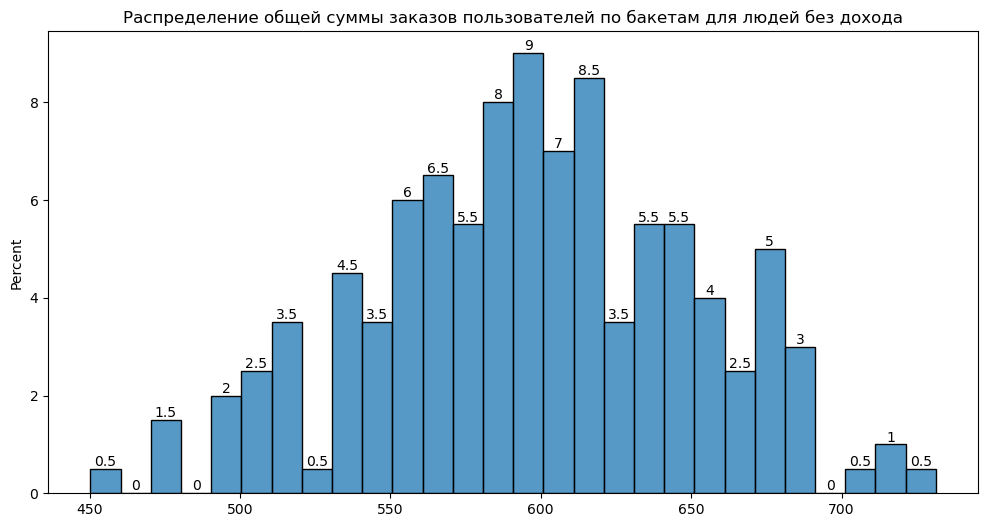

In [178]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
from scipy.stats import shapiro
plt.title('Распределение общей суммы заказов пользователей по бакетам для людей без дохода')
ax=sns.histplot(s1, stat='percent', binwidth=10)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s1))
print(kstest(s1, 'norm', args=(mean(s1),std(s1,ddof=1))))

Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов второй группы является нормальным:

ShapiroResult(statistic=0.9925260543823242, pvalue=0.40111294388771057)
KstestResult(statistic=0.03751200302278779, pvalue=0.9309151296421214, statistic_location=574.25, statistic_sign=1)


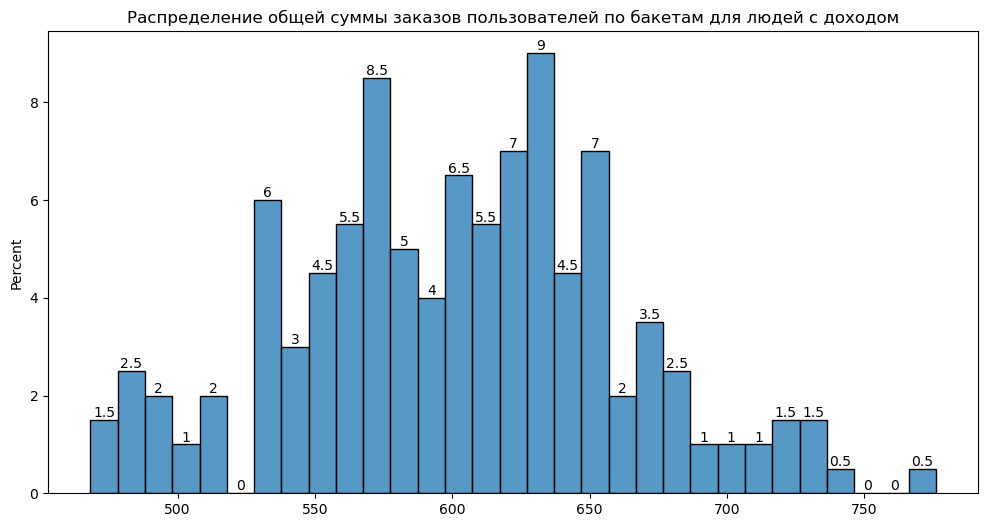

In [179]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
from scipy.stats import shapiro
plt.title('Распределение общей суммы заказов пользователей по бакетам для людей с доходом')
ax=sns.histplot(s2, stat='percent', binwidth=10)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s2))
print(kstest(s2, 'norm', args=(mean(s2),std(s2,ddof=1))))

Убедившись в нормальности распределений, проведем t-test о равенстве средних:

In [180]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=-0.8650574343678119, pvalue=0.38752836767400856, df=398.0)

На 5% уровне значимости нельзя отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних значений sum_sales_amount для групп: 

    1)Пользователи с отсутствием ежемесячного дохода
    2)Пользователи, у которых есть ежемесячный доход
    
**нельзя отвергнуть.**

### Marital Status

[Text(0, 0, '69.077'), Text(0, 0, '27.831'), Text(0, 0, '3.092')]

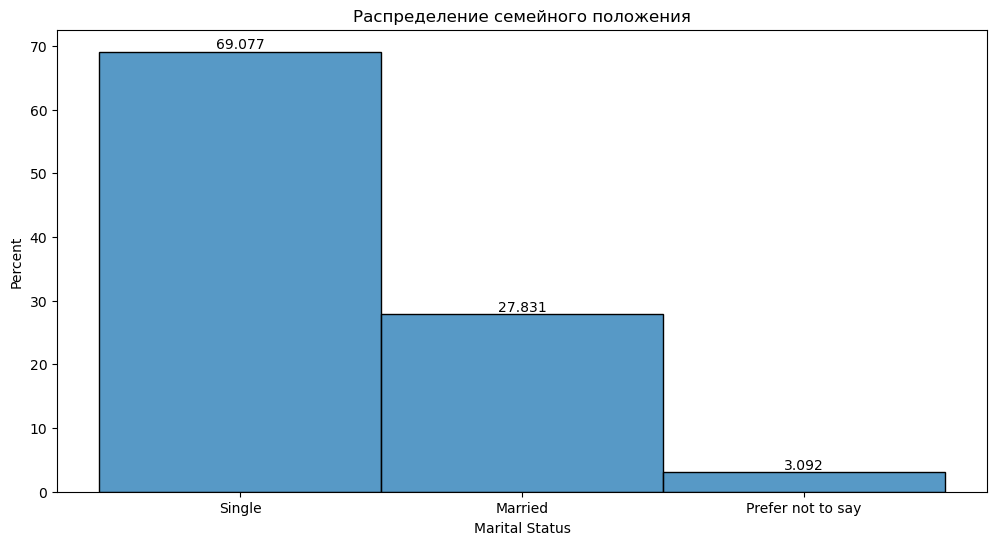

In [181]:
plt.title('Распределение семейного положения')
ax=sns.histplot(users['Marital Status'], discrete=True, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменных sum_sales_amount, sum_sales_qty, order_qty по семейному положению пользователя(Marital Status):

In [182]:
d=users.groupby('Marital Status').agg({'sum_sales_amount':['median','mean','std'],
                            'sum_sales_qty':['median','mean','std'],
                            'order_qty':['median', 'mean', 'std']}).reset_index()
d

Marital Status sum_sales_amount                         sum_sales_qty  \
                               median        mean         std        median   
0            Married            213.0  603.829794  879.561731           1.0   
1  Prefer not to say            222.0  619.247736  909.181937           1.0   
2             Single            213.0  596.718141  873.866964           1.0   

                      order_qty                      
       mean       std    median      mean       std  
0  2.174913  3.198592       1.0  1.103446  1.043316  
1  2.179172  3.251794       1.0  1.114166  1.062386  
2  2.157187  3.208149       1.0  1.094127  1.039954

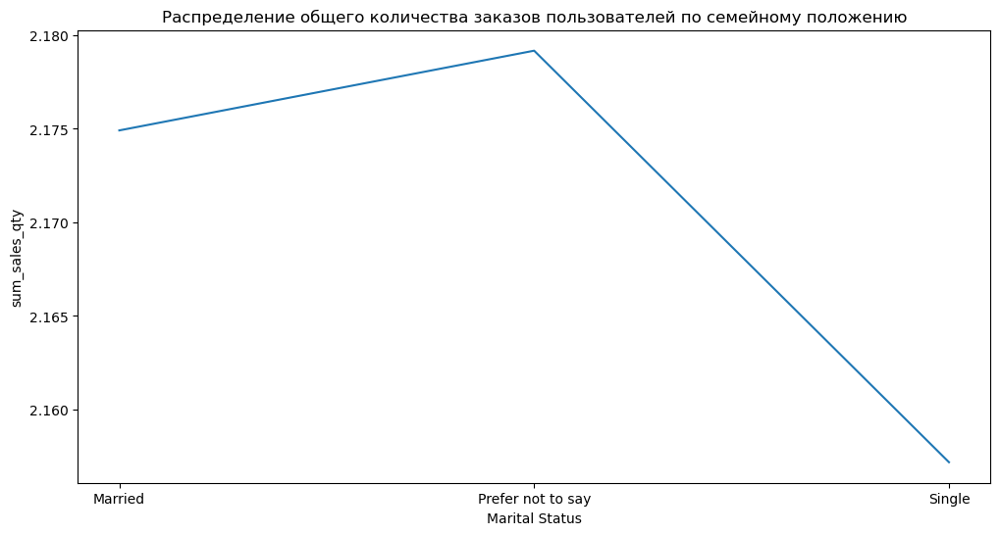

In [183]:
pylab.figure(figsize(12, 6))
plt.title('Распределение общего количества заказов пользователей по семейному положению')
d1=pd.DataFrame({'Marital Status':d['Marital Status'],'sum_sales_qty':d['sum_sales_qty']['mean']})
ax=sns.lineplot(data=d1, x="Marital Status", y="sum_sales_qty")

Протестируем гипотезу о равенстве средних значений sum_sales_qty для групп: 

    1)Пользователи в браке
    2)Пользователи не в браке

Мы видим, что наши группы независимы, но распределения групп не являются нормальными, поэтому мы не можем применить t-test. Поэтому применим бакетное преобразование.

In [184]:
kstest(users[users['Marital Status']=='Married']['sum_sales_qty'], 'norm', 
       args=(users[users['Marital Status']=='Married']['sum_sales_qty'].mean(),
             users[users['Marital Status']=='Married']['sum_sales_qty'].std(ddof=1)))

KstestResult(statistic=0.26381932270360453, pvalue=0.0, statistic_location=2.0, statistic_sign=1)

In [185]:
kstest(users[users['Marital Status']=='Single']['sum_sales_qty'], 'norm', 
       args=(users[users['Marital Status']=='Single']['sum_sales_qty'].mean(),
             users[users['Marital Status']=='Single']['sum_sales_qty'].std(ddof=1)))

KstestResult(statistic=0.26498230500326725, pvalue=0.0, statistic_location=2.0, statistic_sign=1)

Разбиваем группы случайным образом на 200 бакетов:

In [186]:
y1 = pd.DataFrame(users[users['Marital Status']=='Married'], columns=users.columns).reset_index(drop=True)
y2 = pd.DataFrame(users[users['Marital Status']=='Single'], columns=users.columns).reset_index(drop=True)
s1,s2,n1,n2 = Bucketization(y1,y2,200,'sum_sales_qty')
print('Количество элементов в бакете для users[Marital Status]=Married', {n1})
print('Количество элементов в бакете для users[Marital Status]=Single', {n2})

/tmp/ipykernel_54114/1724550939.py:11: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  s1[j]=s1[j]+float(y1[y1.index==int(r1[j][1][n])][column])
/tmp/ipykernel_54114/1724550939.py:16: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  s2[j]=s2[j]+float(y2[y2.index==int(r2[j][1][n])][column])


Количество элементов в бакете для users[Marital Status]=Married {139}
Количество элементов в бакете для users[Marital Status]=Single {345}


Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов первой группы является нормальным:

ShapiroResult(statistic=0.9965124726295471, pvalue=0.9336200952529907)
KstestResult(statistic=0.04006441484271067, pvalue=0.8922032322971426, statistic_location=2.02, statistic_sign=1)


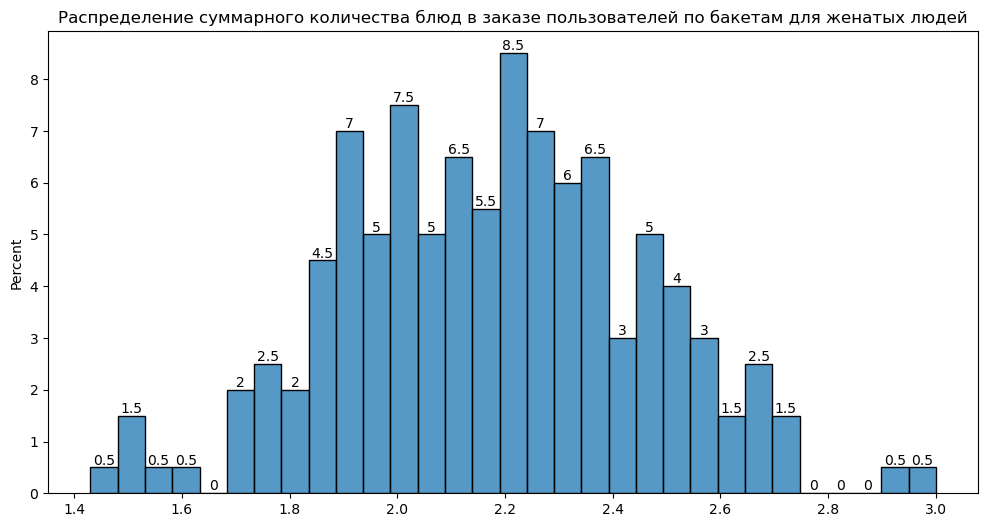

In [187]:

pylab.figure(figsize(12, 6))
plt.title('Распределение суммарного количества блюд в заказе пользователей по бакетам для женатых людей')
ax=sns.histplot(s1, stat='percent', binwidth=0.05)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s1))
print(kstest(s1, 'norm', args=(mean(s1),std(s1,ddof=1))))

Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов второй группы является нормальным:

ShapiroResult(statistic=0.995228111743927, pvalue=0.7828550934791565)
KstestResult(statistic=0.041491371610401784, pvalue=0.8668706328536526, statistic_location=2.16, statistic_sign=-1)


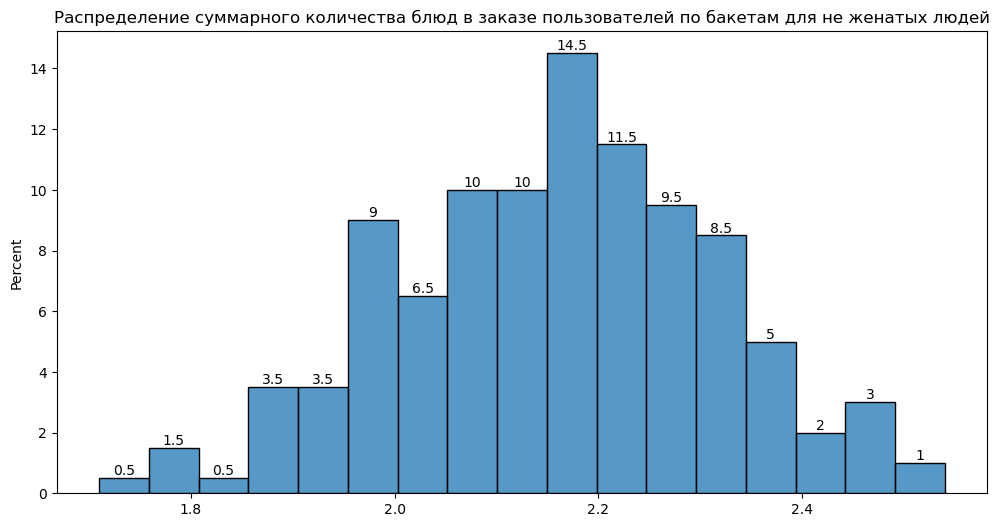

In [188]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
from scipy.stats import shapiro
plt.title('Распределение суммарного количества блюд в заказе пользователей по бакетам для не женатых людей')
ax=sns.histplot(s2, stat='percent', binwidth=0.05)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s2))
print(kstest(s2, 'norm', args=(mean(s2),std(s2,ddof=1))))

Убедившись в нормальности распределений, проведем t-test о равенстве средних:

In [189]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=0.7614051001486355, pvalue=0.4468660505633053, df=398.0)

На 5% уровне значимости нельзя отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних значений average_sales_amount для групп: 

    1)Пользователи в браке
    2)Пользователи не в браке
    
**нельзя отвергнуть.**

### Educational Qualifications

[Text(0, 0, '0.516'),
 Text(0, 0, '3.094'),
 Text(0, 0, '45.61'),
 Text(0, 0, '44.852'),
 Text(0, 0, '5.928')]

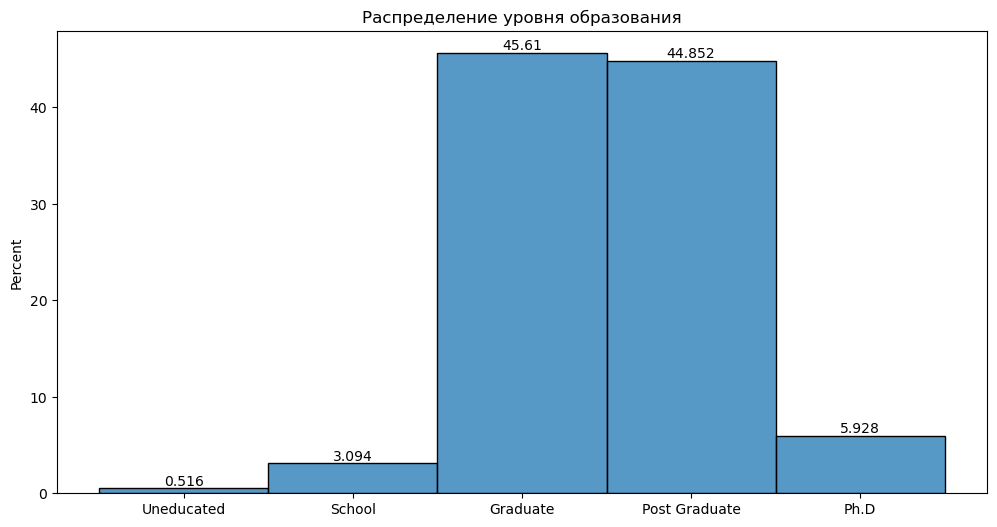

In [190]:
plt.title('Распределение уровня образования')
grades=pd.Categorical(users['Educational Qualifications'],['Uneducated', 'School', 'Graduate', 'Post Graduate','Ph.D'])
ax=sns.histplot(grades, discrete=True, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменных sum_sales_amount, sum_sales_qty, order_qty по уровню образования пользователя(Educational Qualifications):

In [191]:
d=users.groupby('Educational Qualifications').agg({'sum_sales_amount':['median', 'mean', 'std'],
                            'sum_sales_qty':['median', 'mean', 'std'],
                            'order_qty':['median', 'mean', 'std']}).reset_index()
a = copy(d[0:1])
d[0:1]=d[4:5]
d[4:5]=d[1:2]
d[1:2]=d[3:4]
d[3:4]=d[2:3]
d[2:3] = a
d


Educational Qualifications sum_sales_amount                          \
                                       median        mean         std   
0                 Uneducated            220.0  604.403101  880.380425   
1                     School            222.0  580.181965  839.197545   
2                   Graduate            213.0  599.519974  879.080978   
3              Post Graduate            213.0  598.413649  875.234781   
4                       Ph.D            231.0  615.433536  886.064952   

  sum_sales_qty                     order_qty                      
         median      mean       std    median      mean       std  
0           1.0  2.230620  3.356939       1.0  1.071705  1.010956  
1           1.0  2.140595  3.172987       1.0  1.103749  1.032560  
2           1.0  2.156588  3.191484       1.0  1.100417  1.047263  
3           1.0  2.160617  3.217623       1.0  1.092304  1.038144  
4           1.0  2.232794  3.246957       1.0  1.110661  1.031265

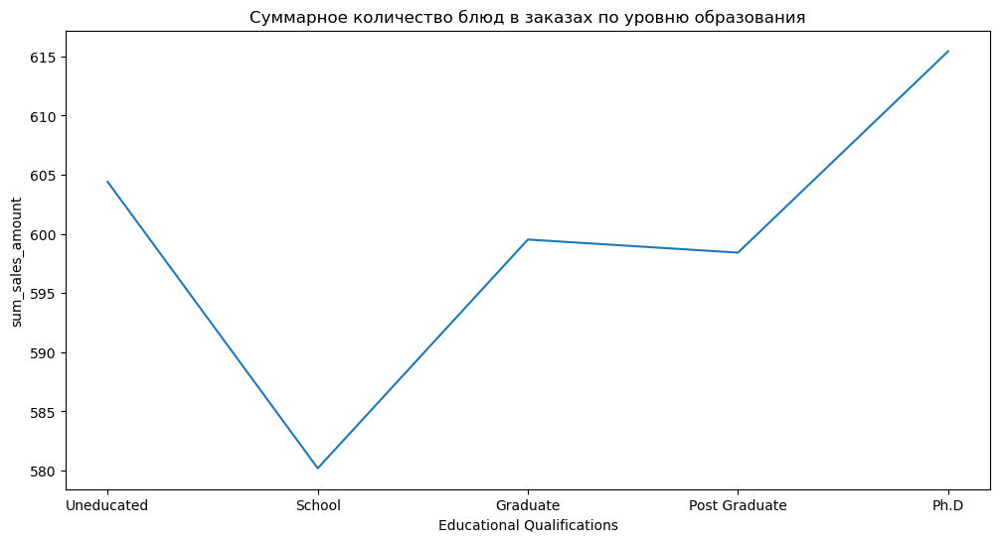

In [192]:
pylab.figure(figsize(12, 6))
plt.title('Суммарное количество блюд в заказах по уровню образования')
d1=pd.DataFrame({'Educational Qualifications':d['Educational Qualifications'],'sum_sales_amount':d['sum_sales_amount']['mean']})
ax=sns.lineplot(data=d1, x="Educational Qualifications", y="sum_sales_amount")

Протестируем гипотезу о равенстве средних значений sum_sales_amount для групп: 

    1)Пользователи с PhD
    2)Пользователи со средним образованием(окончившие только школу)

Мы видим, что наши группы независимы, но распределения групп не задаются конкретным распределением, поэтому мы не можем применить t-test. Поэтому применим бакетное преобразование.

In [193]:
kstest(users[users['Educational Qualifications']=='Ph.D']['sum_sales_amount'], 'norm', 
       args=(users[users['Educational Qualifications']=='Ph.D']['sum_sales_amount'].mean(),
             users[users['Educational Qualifications']=='Ph.D']['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.2436626207282212, pvalue=2.3493233697417e-310, statistic_location=0.0, statistic_sign=-1)

In [194]:
kstest(users[users['Educational Qualifications']=='School']['sum_sales_amount'], 'norm', 
       args=(users[users['Educational Qualifications']=='School']['sum_sales_amount'].mean(),
             users[users['Educational Qualifications']=='School']['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.2446717820381527, pvalue=1.4097437088871866e-163, statistic_location=0.0, statistic_sign=-1)

Разбиваем группы случайным образом на 100 бакетов:

In [195]:
y1 = pd.DataFrame(users[users['Educational Qualifications']=='Ph.D'], columns=users.columns).reset_index(drop=True)
y2 = pd.DataFrame(users[users['Educational Qualifications']=='School'], columns=users.columns).reset_index(drop=True)
s1,s2,n1,n2 = Bucketization(y1,y2,100,'sum_sales_amount')
print('Количество элементов в бакете для users[Educational Qualifications]=Ph.D', {n1})
print('Количество элементов в бакете для users[Educational Qualifications]=School', {n2})

/tmp/ipykernel_54114/1724550939.py:11: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  s1[j]=s1[j]+float(y1[y1.index==int(r1[j][1][n])][column])


Количество элементов в бакете для users[Educational Qualifications]=Ph.D {59}
Количество элементов в бакете для users[Educational Qualifications]=School {30}


/tmp/ipykernel_54114/1724550939.py:16: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  s2[j]=s2[j]+float(y2[y2.index==int(r2[j][1][n])][column])


   Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов первой группы является нормальным:

ShapiroResult(statistic=0.9907188415527344, pvalue=0.7225808501243591)
KstestResult(statistic=0.04801724420403913, pvalue=0.9667276033585753, statistic_location=539.49, statistic_sign=1)


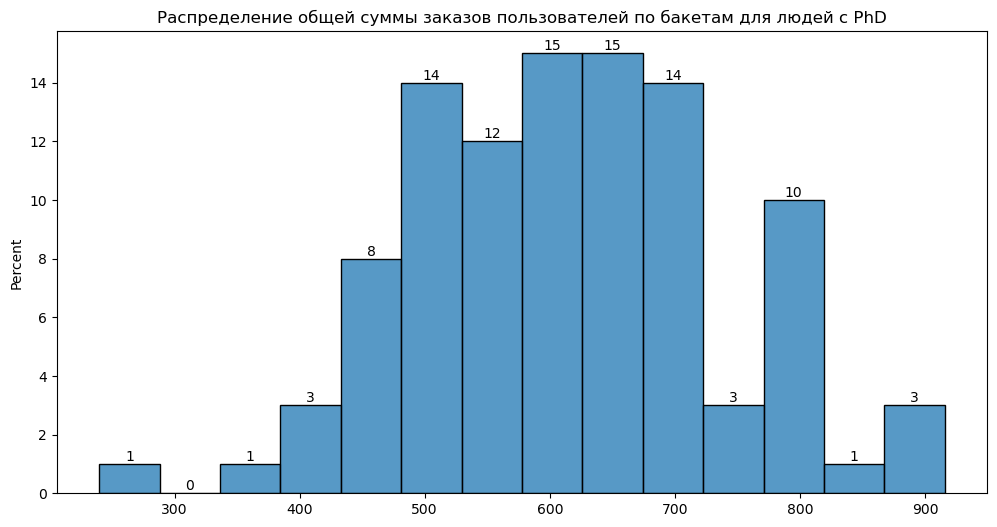

In [196]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
plt.title('Распределение общей суммы заказов пользователей по бакетам для людей с PhD')
ax=sns.histplot(s1, stat='percent', binwidth=50)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s1))
print(kstest(s1, 'norm', args=(mean(s1),std(s1,ddof=1))))

Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов второй группы является нормальным:

ShapiroResult(statistic=0.9883567690849304, pvalue=0.5348761081695557)
KstestResult(statistic=0.04227168574159401, pvalue=0.9908043737139238, statistic_location=555.8, statistic_sign=-1)


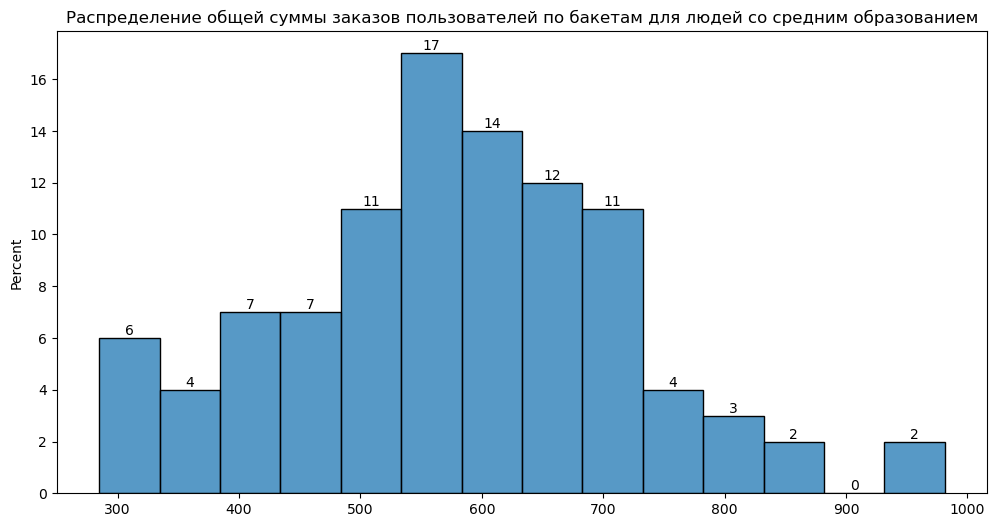

In [197]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
from scipy.stats import shapiro
plt.title('Распределение общей суммы заказов пользователей по бакетам для людей со средним образованием')
ax=sns.histplot(s2, stat='percent', binwidth=50)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s2))
print(kstest(s2, 'norm', args=(mean(s2),std(s2,ddof=1))))

Убедившись в нормальности распределений, проведем t-test о равенстве средних:

In [198]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=1.859118289572489, pvalue=0.06449413960456005, df=198.0)

На 5% уровне значимости можно отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних значений sum_sales_amount для групп: 

    1)Пользователи с PhD
    2)Пользователи со средним образованием(окончившие только школу)
    
**можно отвергнуть на 5% уровне значимости.**

Построим 95% доверительный интервал для разности средних. Видим, что с 95%-ной вероятностью пользователи с PhD в среднем трятят больше на заказ, чем пользователи со средним образованием, в интервале от 0.57 до 69.97 рупий.

In [199]:
diff=mean(s1)-mean(s2)
diff_sd=np.sqrt(var(s1, ddof=1)/100+var(s2, ddof=1)/100)
left, right=st.norm.interval(0.95, loc=diff, scale=diff_sd)
print(f'95% confidence interval: [{left} ; {right}]')

95% confidence interval: [-1.9159137449782335 ; 72.55671374497791]


Посмотрим корреляционную матрицу таблицы users. Видно, что переменные order_qty, sum_sales_amount, sum_sales_qty положительно коррелируют между собой. Это интуитивно объяснимо тем, что, чем больше количество блюд в заказе, тем больше сумма заказа, и наоборот. Чем больше количество заказов у пользователя, тем более вероятно, что у него общая сумма заказов, выше медианного, и суммарное количество блюд в заказе выше медианного. Также слегка коррелируют переменные age, Family size, это может объясняться тем, что люди маловероятно заведут ребенка в молодом возрасте, соответственно, у них размер семьи будет меньше.

Корреляционная матрица таблицы users:

<Axes: >

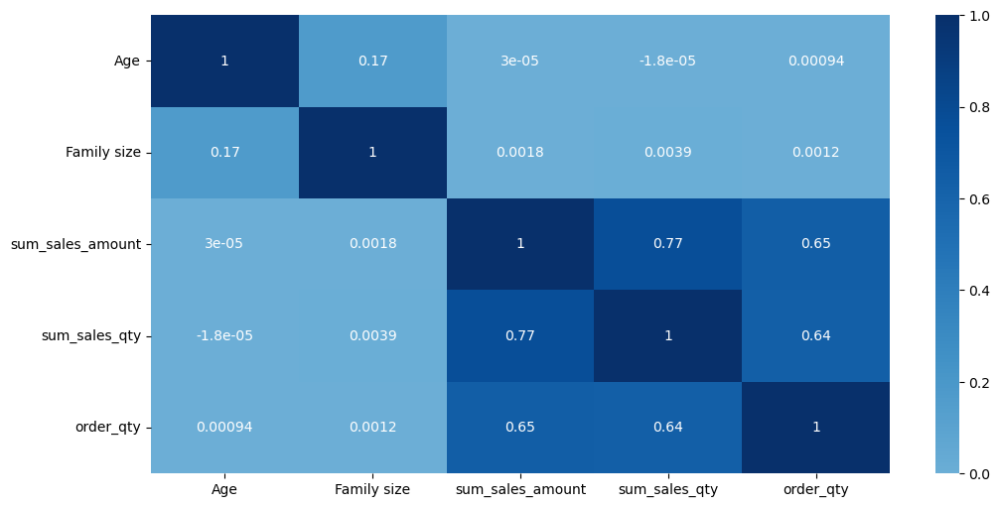

In [200]:
sns.heatmap(users.corr(numeric_only = True), 
            xticklabels=users.corr(numeric_only = True).columns, yticklabels=users.corr(numeric_only = True).columns, cmap='Blues', center=0, annot=True)

### Сегментация пользователей

Будем сегментировать клиентов, которые сделали хотя бы один заказ, по RFM.

    Recency (Свежесть) - число дней насколько давно пользователь что-то у нас покупал
    Frequency (Частота) - насколько много заказов пользовать сделал
    Monetary (Деньги) - сколько в среднем денег потратил

Клиенты, которые пришли недавно, много и часто покупали - лучшие клиенты.



In [201]:
recency=pd.DataFrame(df1.groupby('user_id').agg({'order_date':['max']}).reset_index())
recency.columns=['user_id', 'order_date']
recency['order_date']=recency['order_date'].apply(lambda x: (datetime.date(2020, 6, 26)-x).days)
recency

,user_id,order_date
0,1,590
1,2,693
2,4,506
3,6,623
4,8,371
...,...,...
66827,99995,235
66828,99996,15
66829,99997,8
66830,99998,268


Сегментируем пользователей на 4 группы по каждому из трех параметров, 444-наиболее привлекательный кластер с точки зрения RFM, 111-наименее привлекательный кластер:

In [202]:
rfm=pd.DataFrame({'user_id':q['user_id'], 
                  'recency':recency['order_date'],
                  'frequency': q1['count'],
                  'monetary':q['sales_amount']['sum']})
rfm

,user_id,recency,frequency,monetary
0,1,590,2,1672.0
1,2,693,2,593.0
2,4,506,1,102.0
3,6,623,1,83.0
4,8,371,1,241.0
...,...,...,...,...
66827,99995,235,2,1454.0
66828,99996,15,2,1898.0
66829,99997,8,2,1783.0
66830,99998,268,1,875.0


In [203]:
rfm['r_quartile'] = pd.qcut(rfm['recency'], 4, ['4','3','2','1'])
rfm['f_quartile'] = rfm['frequency']
for i in range(len(rfm)):
    if rfm['f_quartile'][i]>3:
        rfm['f_quartile'][i] = 4
rfm['m_quartile'] = pd.qcut(rfm['monetary'], 4, ['1','2','3','4'])
rfm['RFM_Score'] = rfm.r_quartile.astype(str) + rfm.f_quartile.astype(str) + rfm.m_quartile.astype(str)
rfm

/tmp/ipykernel_54114/1943901737.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm['f_quartile'][i] = 4


,user_id,recency,frequency,monetary,r_quartile,f_quartile,m_quartile,RFM_Score
0,1,590,2,1672.0,2,2,4,224
1,2,693,2,593.0,1,2,3,123
2,4,506,1,102.0,2,1,1,211
3,6,623,1,83.0,2,1,1,211
4,8,371,1,241.0,3,1,2,312
...,...,...,...,...,...,...,...,...
66827,99995,235,2,1454.0,3,2,4,324
66828,99996,15,2,1898.0,4,2,4,424
66829,99997,8,2,1783.0,4,2,4,424
66830,99998,268,1,875.0,3,1,3,313


Самые многочисленные кластеры:

In [204]:
rfm['RFM_Score'].value_counts()[:10]

RFM_Score
111    5716
211    4192
112    3746
311    2933
212    2702
411    2537
113    2318
323    2075
424    2051
312    2009
Name: count, dtype: int64

Визуализация самых многочисленных кластеров:

In [205]:
clusters = rfm['RFM_Score'].value_counts()
big_clusters = clusters[clusters > 1941].index.values
big_clusters

array(['111', '211', '112', '311', '212', '411', '113', '323', '424',
       '312', '324', '423'], dtype=object)

In [206]:
import plotly.express as px

px.scatter_3d(
    rfm[rfm.RFM_Score.isin(big_clusters)],
    x='recency',
    y='frequency',
    z='monetary',
    color='RFM_Score'
)

## Рестораны (restaurant)

In [207]:
restaurant

,r_id,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
0,567335,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
1,531342,Janta Sweet House,Abohar,4.4,50+ ratings,200.0,Other,Bakery,No,Sweet
2,158203,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No
3,187912,Singh Hut,Abohar,3.7,20+ ratings,250.0,Indian,Fast Food,No,No
4,543530,GRILL MASTERS,Abohar,3.9,Too Few Ratings,250.0,Italian,Fast Food,American,No
...,...,...,...,...,...,...,...,...,...,...
148536,553122,The Food Delight,Yavatmal,3.9,Too Few Ratings,200.0,Other,Snack,No,Fast Food
148537,562647,MAITRI FOODS & BEVERAGES,Yavatmal,3.9,Too Few Ratings,300.0,Other,Pizza,No,No
148538,559435,Cafe Bella Ciao,Yavatmal,3.9,Too Few Ratings,300.0,Other,Snack,No,Fast Food
148539,418989,GRILL ZILLA,Yavatmal,3.9,Too Few Ratings,250.0,Continental,Other,No,No


Так как переменные sales_amount и sales_qty являются основными метриками, то на их основе получим три переменных для таблицы users:

    1) Общая сумма заказов(выручка) для каждого ресторана (sum_sales_amount)
    2) Суммарное количество блюд в заказах для каждого ресторана (sum_sales_qty)
    3) Количество заказов для каждого ресторана (order_qty)

In [208]:
q=df1.groupby('r_id').agg({'sales_amount':['sum'], 'sales_qty':['sum']}).reset_index()
active_restaurant=set(q['r_id'])
q=pd.DataFrame(q)
q

,r_id,sales_amount,sales_qty
,,sum,sum
0,218,537.0,3
1,219,972.0,4
2,223,171.0,1
3,227,764.0,3
4,229,588.0,2
...,...,...,...
109661,580867,2611.0,5
109662,580908,0.0,1
109663,580910,574.0,1


In [209]:
q1=df1.groupby(['r_id'])['r_id'].count()
q1=pd.DataFrame(q1)
q1.columns=['count']
q1.reset_index(inplace=True)
q1

,r_id,count
0,218,1
1,219,1
2,223,1
3,227,1
4,229,1
...,...,...
109661,580867,1
109662,580908,1
109663,580910,1
109664,580940,1


In [210]:
sales_amount2=[0]*148541
sales_qty2=[0]*148541
order_qty2=[0]*148541
for i in tqdm(range(len(restaurant['r_id']))):
    if restaurant['r_id'][i] in active_restaurant:
        sales_amount2[i]=round(float(q[q['r_id']==restaurant['r_id'][i]]['sales_amount']['sum']),2)
        sales_qty2[i]=round(float(q[q['r_id']==restaurant['r_id'][i]]['sales_qty']['sum']),2)
        order_qty2[i]=float(q1[q1['r_id']==restaurant['r_id'][i]]['count'])

  0%|                                                | 0/148541 [00:00<?, ?it/s]/tmp/ipykernel_54114/3650342595.py:6: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_54114/3650342595.py:7: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_54114/3650342595.py:8: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

100%|█████████████████████████████████| 148541/148541 [02:00<00:00, 1235.23it/s]


Таблица restaurant с новыми переменными:

In [211]:
restaurant['sum_sales_amount']=sales_amount2
restaurant['sum_sales_qty']=sales_qty2
restaurant['order_qty']=order_qty2
restaurant

,r_id,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food,sum_sales_amount,sum_sales_qty,order_qty
0,567335,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza,0.0,0.0,0.0
1,531342,Janta Sweet House,Abohar,4.4,50+ ratings,200.0,Other,Bakery,No,Sweet,0.0,0.0,0.0
2,158203,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No,875.0,1.0,1.0
3,187912,Singh Hut,Abohar,3.7,20+ ratings,250.0,Indian,Fast Food,No,No,583.0,1.0,1.0
4,543530,GRILL MASTERS,Abohar,3.9,Too Few Ratings,250.0,Italian,Fast Food,American,No,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
148536,553122,The Food Delight,Yavatmal,3.9,Too Few Ratings,200.0,Other,Snack,No,Fast Food,0.0,0.0,0.0
148537,562647,MAITRI FOODS & BEVERAGES,Yavatmal,3.9,Too Few Ratings,300.0,Other,Pizza,No,No,1477.0,1.0,1.0
148538,559435,Cafe Bella Ciao,Yavatmal,3.9,Too Few Ratings,300.0,Other,Snack,No,Fast Food,708.0,1.0,1.0
148539,418989,GRILL ZILLA,Yavatmal,3.9,Too Few Ratings,250.0,Continental,Other,No,No,2282.0,1.0,1.0


In [212]:
restaurant.describe()

,rating,cost,sum_sales_amount,sum_sales_qty,order_qty
count,148541.000000,148541.000000,148541.000000,148541.000000,148541.000000
mean,3.897709,287.600714,403.520913,1.456029,0.738746
std,0.295893,796.379285,600.454175,2.203059,0.440361
min,1.000000,1.000000,0.000000,0.000000,0.000000
25%,3.900000,200.000000,0.000000,0.000000,0.000000
50%,3.900000,250.000000,162.000000,1.000000,1.000000
75%,3.900000,300.000000,468.000000,1.000000,1.000000
max,5.000000,300350.000000,4903.000000,16.000000,2.000000


Удалим странный выброс в переменной cost :

In [213]:
a=list(restaurant['cost'])
a.sort(reverse=True)
a[:10]

[300350.0,
 8000.0,
 6000.0,
 5023.0,
 5000.0,
 3999.0,
 3500.0,
 3500.0,
 3360.0,
 3200.0]

In [214]:
restaurant=restaurant[restaurant['cost']<300000]
restaurant

,r_id,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food,sum_sales_amount,sum_sales_qty,order_qty
0,567335,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza,0.0,0.0,0.0
1,531342,Janta Sweet House,Abohar,4.4,50+ ratings,200.0,Other,Bakery,No,Sweet,0.0,0.0,0.0
2,158203,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No,875.0,1.0,1.0
3,187912,Singh Hut,Abohar,3.7,20+ ratings,250.0,Indian,Fast Food,No,No,583.0,1.0,1.0
4,543530,GRILL MASTERS,Abohar,3.9,Too Few Ratings,250.0,Italian,Fast Food,American,No,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
148536,553122,The Food Delight,Yavatmal,3.9,Too Few Ratings,200.0,Other,Snack,No,Fast Food,0.0,0.0,0.0
148537,562647,MAITRI FOODS & BEVERAGES,Yavatmal,3.9,Too Few Ratings,300.0,Other,Pizza,No,No,1477.0,1.0,1.0
148538,559435,Cafe Bella Ciao,Yavatmal,3.9,Too Few Ratings,300.0,Other,Snack,No,Fast Food,708.0,1.0,1.0
148539,418989,GRILL ZILLA,Yavatmal,3.9,Too Few Ratings,250.0,Continental,Other,No,No,2282.0,1.0,1.0


### order_qty

[Text(0, 0, '26.1707'), Text(0, 0, '73.7835'), Text(0, 0, '0.0457789')]

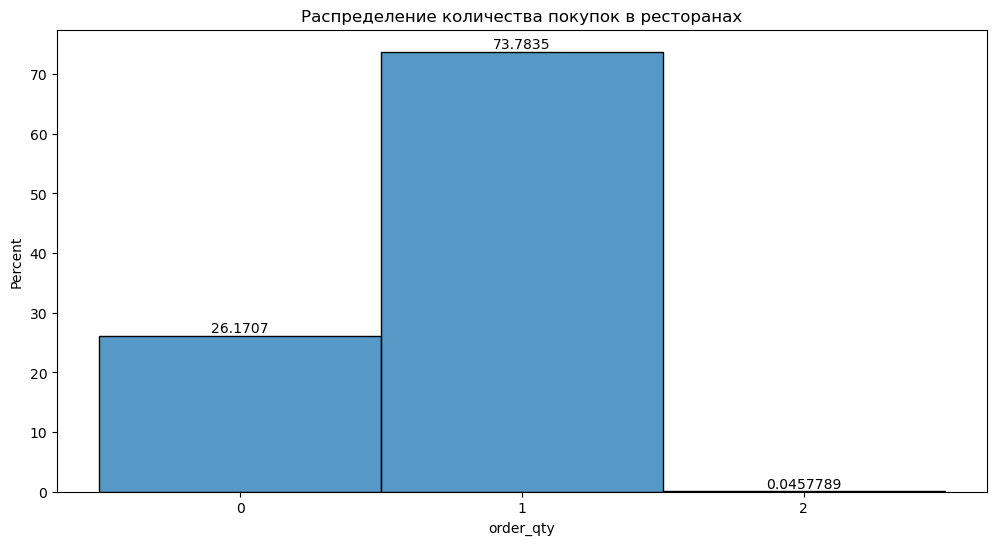

In [215]:
pylab.figure(figsize(12, 6))
plt.title('Распределение количества покупок в ресторанах')
plt.xticks(range(0,3))
ax=sns.histplot(restaurant['order_qty'], discrete=True, stat='percent')
ax.bar_label (ax.containers [ 0 ])

### sum_sales_amount

[Text(0, 0, '75.7951'),
 Text(0, 0, '11.2286'),
 Text(0, 0, '4.98788'),
 Text(0, 0, '3.5997'),
 Text(0, 0, '2.46533'),
 Text(0, 0, '1.81433'),
 Text(0, 0, '0.104349'),
 Text(0, 0, '0.00201966'),
 Text(0, 0, '0.000673219'),
 Text(0, 0, '0.00201966')]

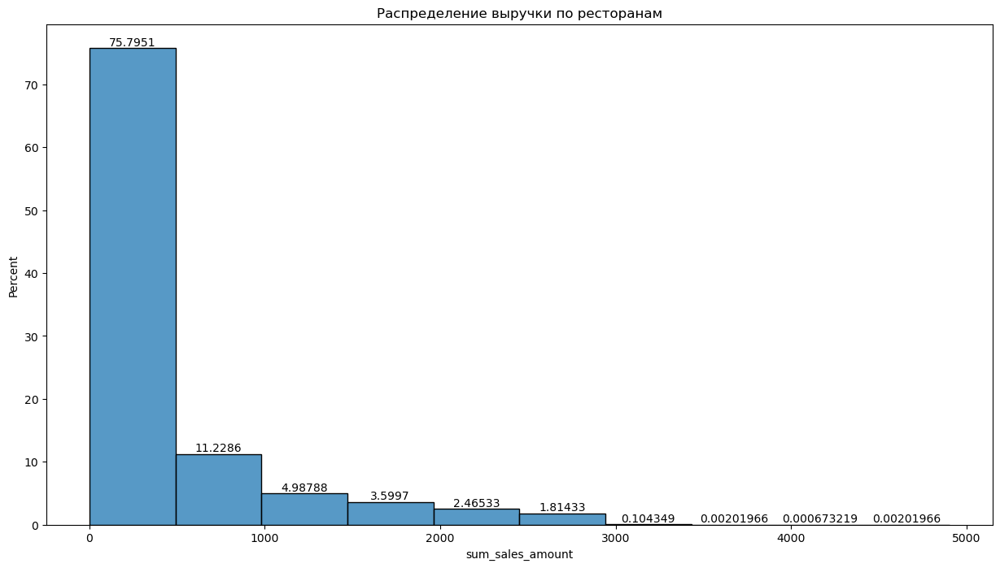

In [216]:
pylab.figure(figsize(15, 8))
plt.title('Распределение выручки по ресторанам')
ax=sns.histplot(restaurant['sum_sales_amount'], stat='percent', binwidth=500)
ax.bar_label (ax.containers [ 0 ])

Видно, что распределение переменной average_sales_amount не является нормальным. Логарифмирование переменной позволит убрать длинный правый "хвост". Теперь распределение выглядит близким к нормальному, если исключить пользователей, не сделавших ни одного заказа:

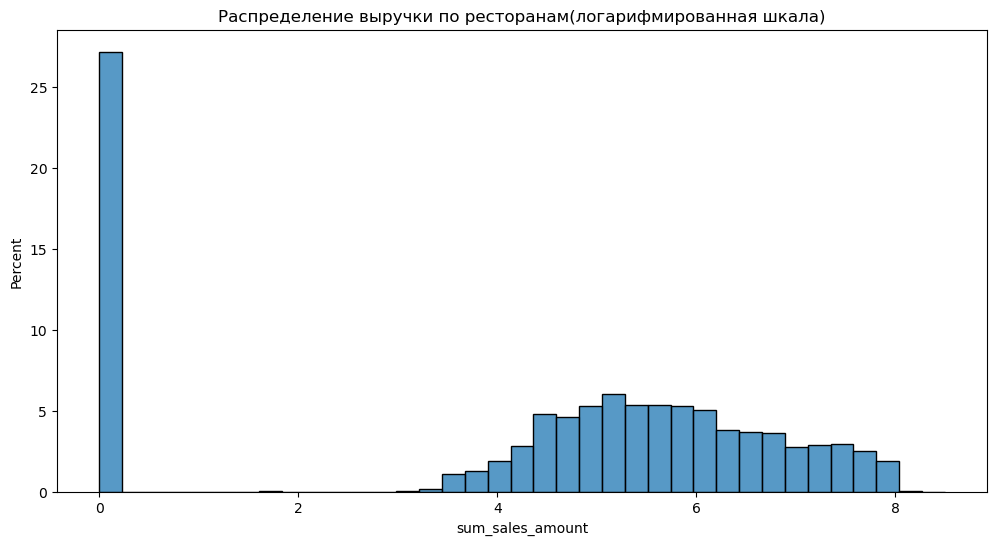

In [217]:
pylab.figure(figsize(12, 6))
plt.title('Распределение выручки по ресторанам(логарифмированная шкала)')
ax=sns.histplot(restaurant['sum_sales_amount'].apply(lambda w: np.log(w + 1)), stat='percent')

### sum_sales_qty

[Text(0, 0, '26.1707'),
 Text(0, 0, '53.9215'),
 Text(0, 0, '7.21018'),
 Text(0, 0, '3.78282'),
 Text(0, 0, '1.84058'),
 Text(0, 0, '1.52619'),
 Text(0, 0, '1.02464'),
 Text(0, 0, '1.23536'),
 Text(0, 0, '0.661775'),
 Text(0, 0, '0.396526'),
 Text(0, 0, '0.440285'),
 Text(0, 0, '0.55002'),
 Text(0, 0, '0.280732'),
 Text(0, 0, '0.550693'),
 Text(0, 0, '0.0854989'),
 Text(0, 0, '0.322472')]

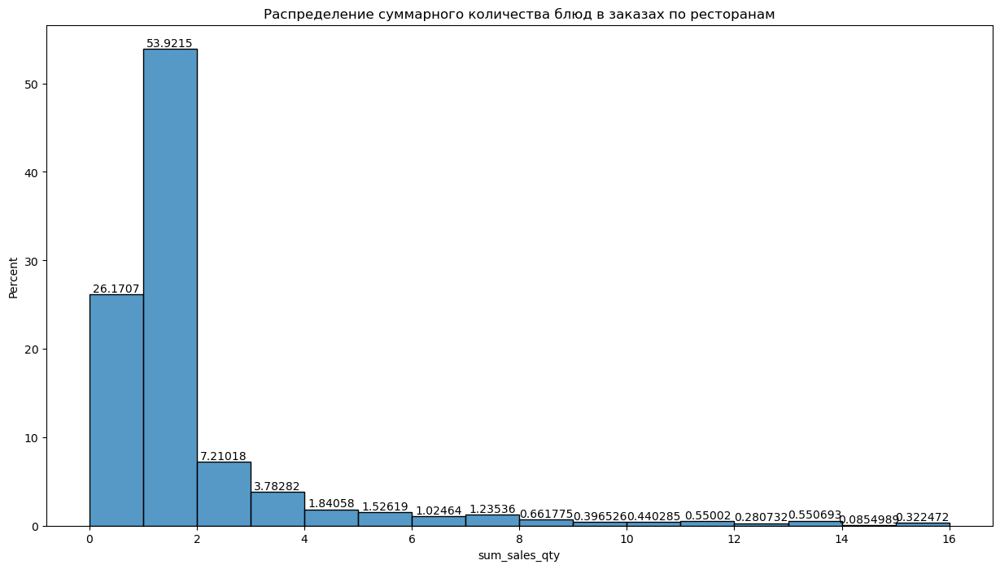

In [218]:
pylab.figure(figsize(15, 8))
plt.title('Распределение суммарного количества блюд в заказах по ресторанам')
ax=sns.histplot(restaurant['sum_sales_qty'], stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Видно, что распределение переменной sum_sales_qty не является нормальным.

### city

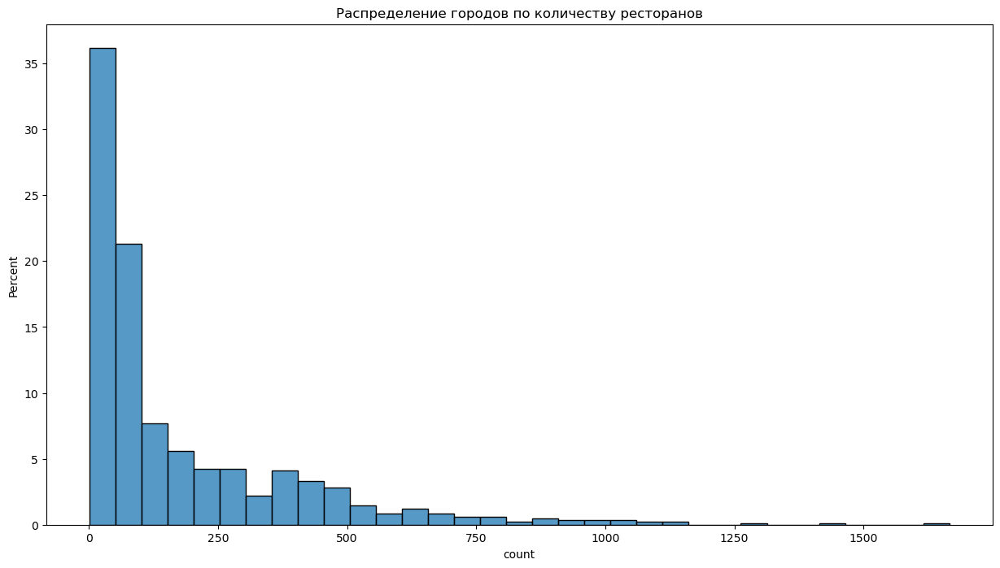

In [219]:
plt.title('Распределение городов по количеству ресторанов')
ax=sns.histplot(restaurant['city'].value_counts(), stat='percent', binwidth=50)

Видно, что распределение количества ресторанов по городам не является нормальным.

Самые распространенные города:

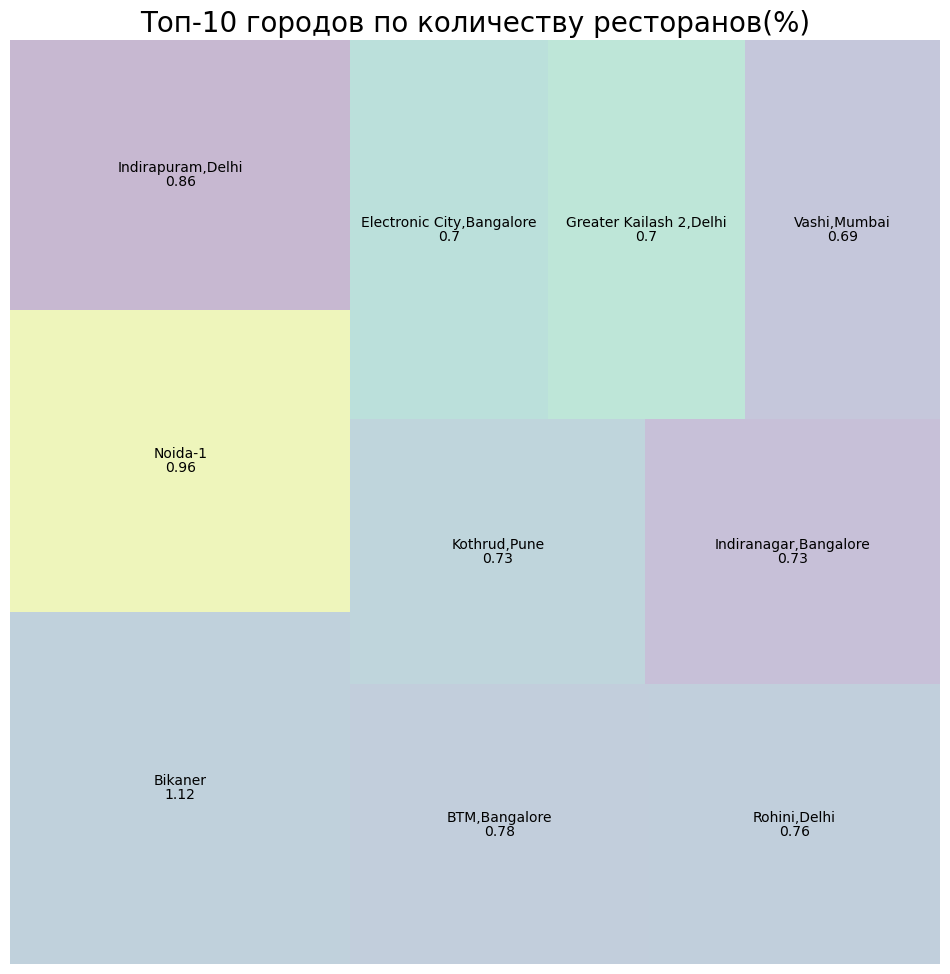

In [220]:
import squarify
city_tree = restaurant['city'].value_counts()
city_tree = round((city_tree[:10] / len(restaurant['city']) * 100),2)

plt.figure(figsize=(12,12))

g = squarify.plot(
    sizes=city_tree.values, 
    label=city_tree.index, 
    value=city_tree.values,
    alpha=.3
)

g.set_title("Топ-10 городов по количеству ресторанов(%)", fontsize=20)
g.set_axis_off();

### rating

[Text(0, 0, '0.0127912'),
 Text(0, 0, '0.0814595'),
 Text(0, 0, '0.315067'),
 Text(0, 0, '1.1438'),
 Text(0, 0, '4.39747'),
 Text(0, 0, '72.9844'),
 Text(0, 0, '18.0483'),
 Text(0, 0, '3.0167')]

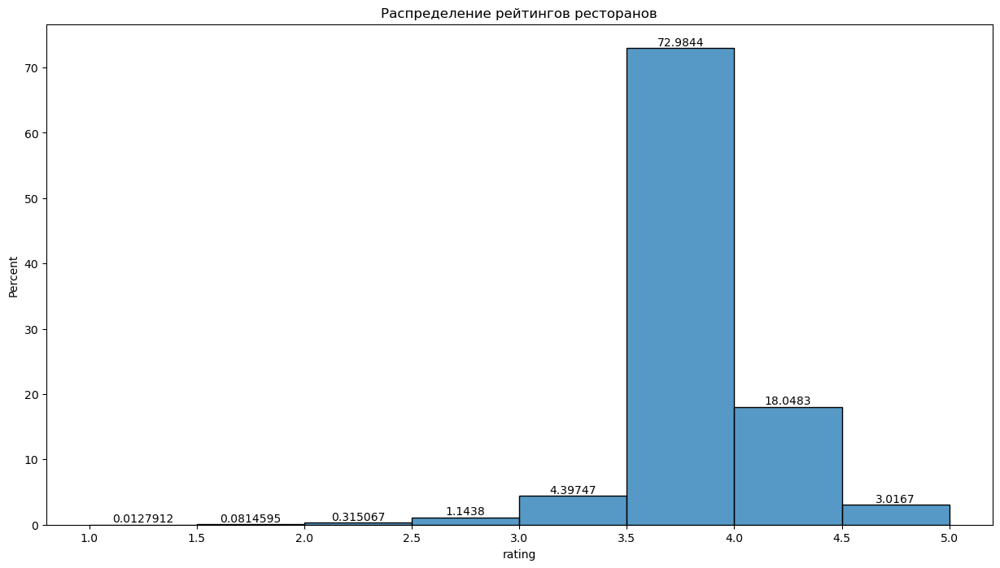

In [221]:
plt.title('Распределение рейтингов ресторанов')
ax=sns.histplot(restaurant['rating'], stat='percent', binwidth=0.5)
ax.bar_label (ax.containers [ 0 ])

Видно, что распределение переменной rating не является нормальным.

Посмотрим распределение переменных sum_sales_amount, sum_sales_qty, order_qty по рейтингу ресторана(rating):

In [222]:
d=restaurant.groupby('rating').agg({'sum_sales_amount':['median', 'mean', 'std'],
                            'sum_sales_qty':['median', 'mean', 'std'],
                                   'order_qty':['median', 'mean', 'std']}).reset_index()
d

rating sum_sales_amount                           sum_sales_qty            \
                    median         mean          std        median      mean   
0     1.0           2264.0  2264.000000          NaN           7.0  7.000000   
1     1.1            194.0   194.000000          NaN           1.0  1.000000   
2     1.2            162.0   667.750000  1129.870900           3.0  3.250000   
3     1.3              0.0   298.000000   516.151141           0.0  1.333333   
4     1.4            396.0   741.700000   758.366380           1.0  3.400000   
5     1.5            139.0   682.333333  1043.435446           1.0  2.055556   
6     1.6            236.0   322.411765   414.088315           1.0  1.823529   
7     1.7            106.0   254.846154   496.252598           1.0  1.615385   
8     1.8            245.0   541.407407   701.769317           1.0  2.037037   
9     1.9            176.0   262.543478   295.138288           1.0  0.978261   
10    2.0            113.5   282.444444   480.065896           1.0  1.083333   
11    2.1             97.0   241.409836   403.421673           1.0  0.934426   
12    2.2            144.0   327.303371   588.480891           1.0  1.325843   
13    2.3            106.0   314.867188   494.198474           1.0  1.343750   
14    2.4            185.0   427.559322   628.987418           1.0  1.500000   
15    2.5            144.0   407.891403   592.274212           1.0  1.416290   
16    2.6            148.0   362.740385   538.874386           1.0  1.302885   
17    2.7            134.0   456.981538   694.409692           1.0  1.507692   
18    2.8            157.0   398.788584   601.135146           1.0  1.338266   
19    2.9            150.5   395.730932   572.443815           1.0  1.457627   
20    3.0            148.0   414.174622   627.699977           1.0  1.408615   
21    3.1            153.0   431.809102   641.039344           1.0  1.508217   
22    3.2            148.0   382.754576   581.905885           1.0  1.361897   
23    3.3            153.0   406.064409   609.029924           1.0  1.398112   
24    3.4            153.0   401.103246   599.912957           1.0  1.426291   
25    3.5            157.0   403.680054   597.820743           1.0  1.421870   
26    3.6            153.0   408.977436   618.226429           1.0  1.427009   
27    3.7            162.0   416.315307   618.039540           1.0  1.480367   
28    3.8            162.0   416.105997   620.924950           1.0  1.459205   
29    3.9            162.0   397.119372   592.650133           1.0  1.445490   
30    4.0            162.0   418.261023   626.257789           1.0  1.474434   
31    4.1            167.0   415.594663   609.388113           1.0  1.533355   
32    4.2            162.0   419.493042   618.474137           1.0  1.495619   
33    4.3            171.0   421.254640   610.352047           1.0  1.487328   
34    4.4            181.0   426.121943   612.987760           1.0  1.527469   
35    4.5            167.0   418.107987   611.663493           1.0  1.491564   
36    4.6            176.0   405.803598   583.078894           1.0  1.488006   
37    4.7            159.5   418.504630   621.436005           1.0  1.552469   
38    4.8            187.5   376.186391   530.143022           1.0  1.414201   
39    4.9            125.0   389.551724   580.733615           1.0  1.609195   
40    5.0            185.0   480.253589   701.142329           1.0  1.588517   

             order_qty                      
         std    median      mean       std  
0        NaN       1.0  1.000000       NaN  
1        NaN       1.0  1.000000       NaN  
2   3.774917       0.5  0.500000  0.577350  
3   2.309401       0.0  0.333333  0.577350  
4   4.812022       1.0  0.900000  0.316228  
5   2.979779       1.0  0.833333  0.383482  
6   2.068674       1.0  0.705882  0.469668  
7   3.150092       1.0  0.769231  0.438529  
8   2.295170       1.0  0.888889  0.320256  
9   0.977278       1.0  0.717391  0.455243  
10  1.350535       1.0

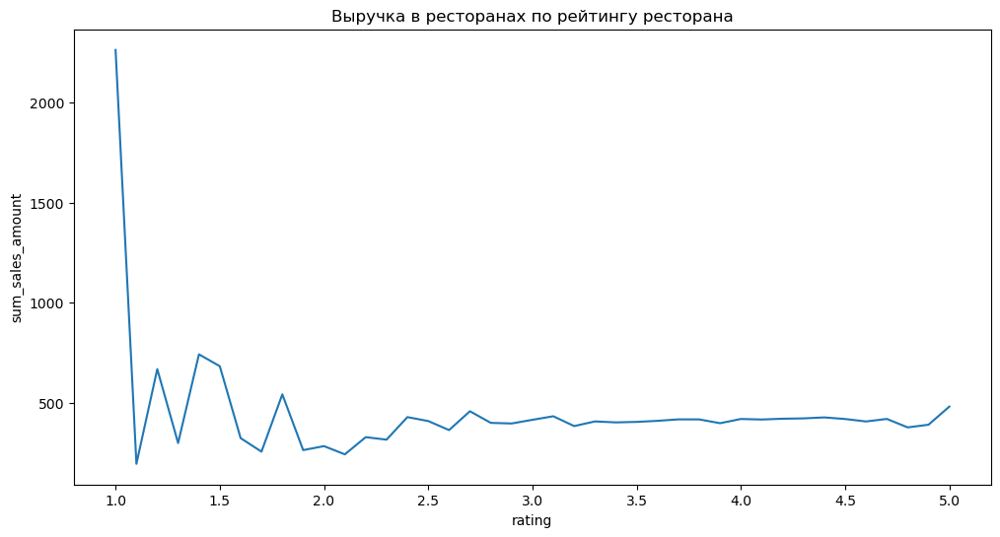

In [223]:
pylab.figure(figsize(12, 6))
plt.title('Выручка в ресторанах по рейтингу ресторана')
d1=pd.DataFrame({'rating':d['rating'],'sum_sales_amount':d['sum_sales_amount']['mean']})
ax=sns.lineplot(data=d1, x="rating", y="sum_sales_amount")

Протестируем гипотезу о равенстве средних значений sum_sales_amount для групп: 

    1)Рестораны с рейтингом меньше 3.9
    2)Рестораны с рейтингом больше 3.9

Мы видим, что наши группы независимы, но распределения групп не задаются конкретны распределением, поэтому мы не можем применить t-test. Поэтому применим бакетное преобразование.

In [224]:
kstest(restaurant[restaurant['rating']<3.9]['sum_sales_amount'], 'norm', 
       args=(restaurant[restaurant['rating']<3.9]['sum_sales_amount'].mean(),
             restaurant[restaurant['rating']<3.9]['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.25204630357699326, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

In [225]:
kstest(restaurant[restaurant['rating']>3.9]['sum_sales_amount'], 'norm', 
       args=(restaurant[restaurant['rating']>3.9]['sum_sales_amount'].mean(),
             restaurant[restaurant['rating']>3.9]['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.24778913720396684, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

Разбиваем группы случайным образом на 200 бакетов:

In [226]:
y1 = pd.DataFrame(restaurant[restaurant['rating']<3.9], columns=restaurant.columns).reset_index(drop=True)
y2 = pd.DataFrame(restaurant[restaurant['rating']>3.9], columns=restaurant.columns).reset_index(drop=True)
s1,s2,n1,n2 = Bucketization(y1,y2,200,'sum_sales_amount')
print('Количество элементов в бакете для restaurant[rating]<3.9', {n1})
print('Количество элементов в бакете для restaurant[rating]>3.9', {n2})

/tmp/ipykernel_54114/1724550939.py:11: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_54114/1724550939.py:16: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead



Количество элементов в бакете для restaurant[rating]<3.9 {123}
Количество элементов в бакете для restaurant[rating]>3.9 {156}


Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов первой группы является нормальным:

ShapiroResult(statistic=0.9964451193809509, pvalue=0.9277569651603699)
KstestResult(statistic=0.03770673675150438, pvalue=0.9282821689328615, statistic_location=399.1, statistic_sign=1)


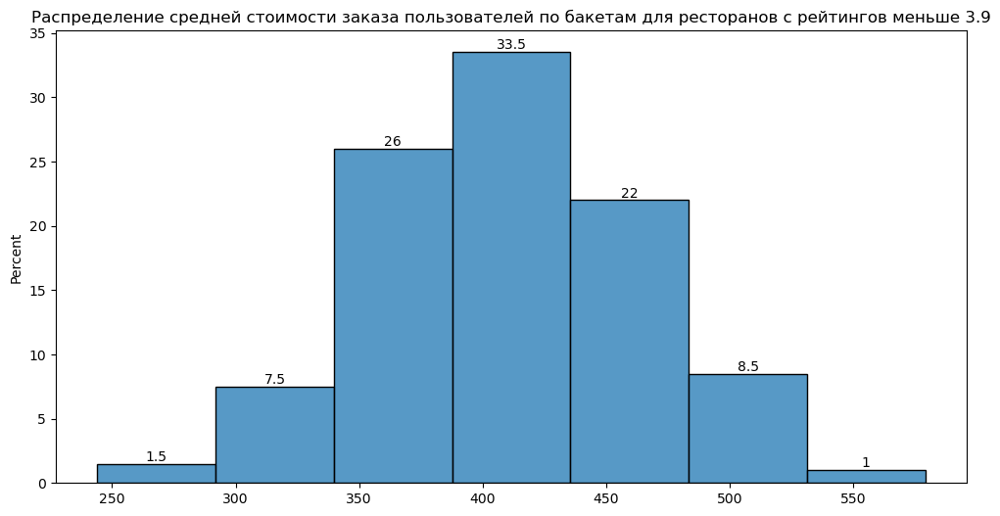

In [227]:
pylab.figure(figsize(12, 6))
plt.title('Распределение средней стоимости заказа пользователей по бакетам для ресторанов с рейтингов меньше 3.9')
ax=sns.histplot(s1, stat='percent', binwidth=50)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s1))
print(kstest(s1, 'norm', args=(mean(s1),std(s1,ddof=1))))

Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов второй группы является нормальным:

ShapiroResult(statistic=0.994732141494751, pvalue=0.7103374004364014)
KstestResult(statistic=0.042058671146831594, pvalue=0.8561452070453384, statistic_location=442.52, statistic_sign=1)


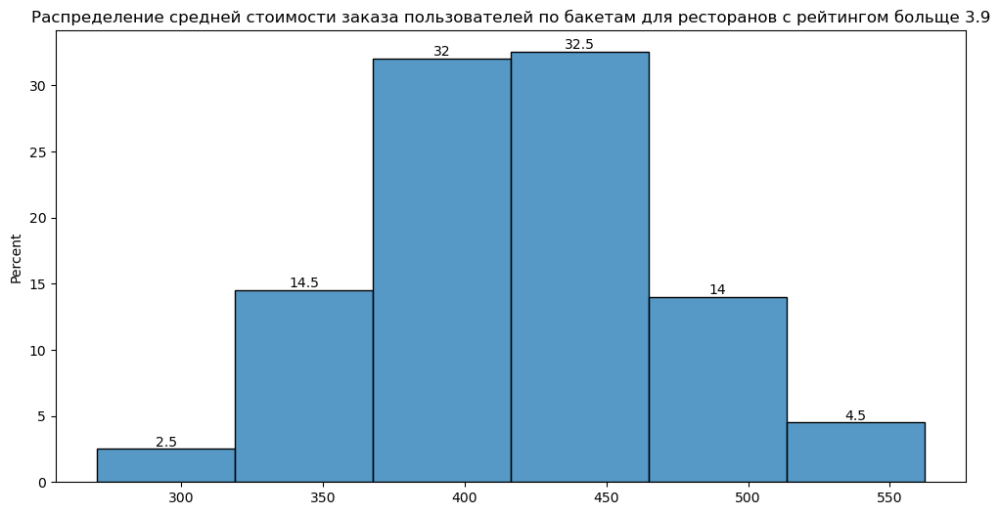

In [228]:
pylab.figure(figsize(12, 6))
plt.title('Распределение средней стоимости заказа пользователей по бакетам для ресторанов с рейтингом больще 3.9')
ax=sns.histplot(s2, stat='percent', binwidth=50)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s2))
print(kstest(s2, 'norm', args=(mean(s2),std(s2,ddof=1))))

Убедившись в нормальности распределений, проведем t-test о равенстве средних:

In [229]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=-1.8725162274959999, pvalue=0.061868184466040595, df=398.0)

На 5% уровне значимости нельзя отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних значений average_sales_qty для групп: 

    1)Рестораны с рейтингом меньше 3.9
    2)Рестораны с рейтингом больше 3.9
    
**нельзя отвергнуть на 5% уровне значимости.**

### rating_count

[Text(0, 0, '58.6367'),
 Text(0, 0, '14.5658'),
 Text(0, 0, '8.08469'),
 Text(0, 0, '13.8333'),
 Text(0, 0, '2.95947'),
 Text(0, 0, '1.84395'),
 Text(0, 0, '0.0659755'),
 Text(0, 0, '0.0100983')]

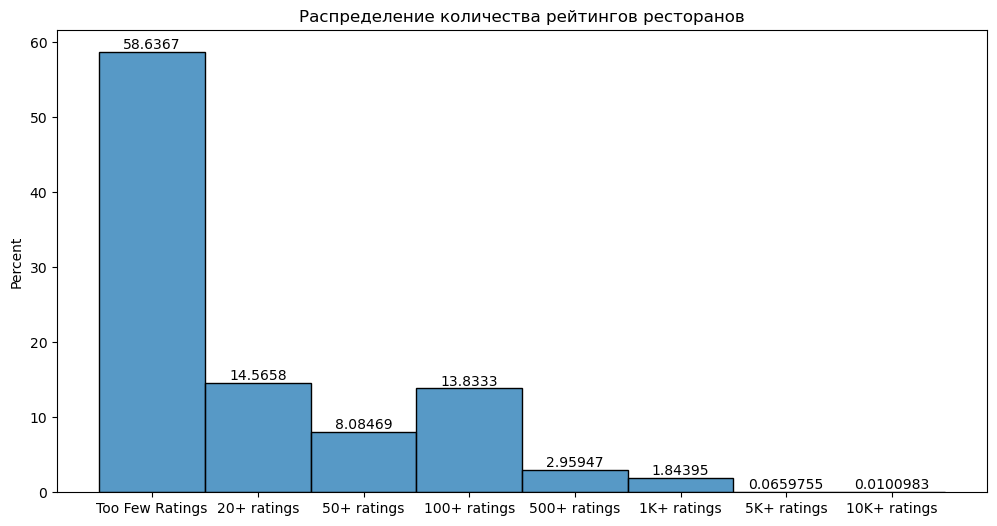

In [230]:
plt.title('Распределение количества рейтингов ресторанов')
grades=pd.Categorical(restaurant['rating_count'],
['Too Few Ratings', '20+ ratings', '50+ ratings', '100+ ratings','500+ ratings', '1K+ ratings', '5K+ ratings', '10K+ ratings'])
ax=sns.histplot(grades, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменных sum_sales_amount, sum_sales_qty, order_qty по количеству рейтингов ресторана(rating_count):

In [231]:
d=restaurant.groupby('rating_count').agg({'sum_sales_amount':['median', 'mean', 'std'],
                            'sum_sales_qty':['median', 'mean', 'std'],
                                'order_qty':['median', 'mean', 'std']}).reset_index()
a = copy(d[0:1])
d[0:1]=d[7:8]
d[7:8]=d[1:2]
d[1:2]=d[3:4]
d[3:4]=a
a=copy(d[2:3])
d[2:3]=d[4:5]
d[4:5]=d[5:6]
d[5:6]=a
d

rating_count sum_sales_amount                         sum_sales_qty  \
                             median        mean         std        median   
0  Too Few Ratings            162.0  395.663544  590.710366           1.0   
1      20+ ratings            162.0  410.987752  608.922455           1.0   
2      50+ ratings            162.0  416.592056  614.829110           1.0   
3     100+ ratings            167.0  419.584534  619.663524           1.0   
4     500+ ratings            157.0  417.578935  620.961048           1.0   
5      1K+ ratings            157.0  394.620664  592.525114           1.0   
6      5K+ ratings            139.0  423.724490  638.586790           1.0   
7     10K+ ratings            130.0  188.333333  295.798596           1.0   

                      order_qty                      
       mean       std    median      mean       std  
0  1.443748  2.180960       1.0  0.744061  0.436995  
1  1.461592  2.214091       1.0  0.732760  0.444197  
2  1.449330  2.199445       1.0  0.730036  0.445644  
3  1.479852  2.236456       1.0  0.731263  0.445067  
4  1.489763  2.269576       1.0  0.727707  0.447230  
5  1.590727  2.440692       1.0  0.731654  0.443180  
6  1.785714  2.605506       1.0  0.683673  0.467433  
7  0.933333  1.222799       1.0  0.666667  0.487950

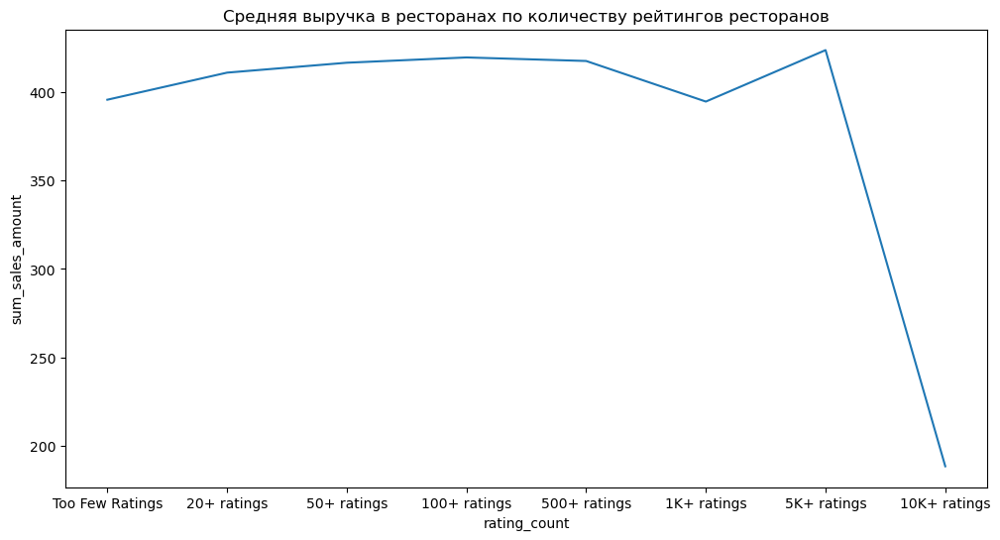

In [232]:
pylab.figure(figsize(12, 6))
plt.title('Средняя выручка в ресторанах по количеству рейтингов ресторанов')
d1=pd.DataFrame({'rating_count':d['rating_count'],'sum_sales_amount':d['sum_sales_amount']['mean']})
ax=sns.lineplot(data=d1, x="rating_count", y="sum_sales_amount")

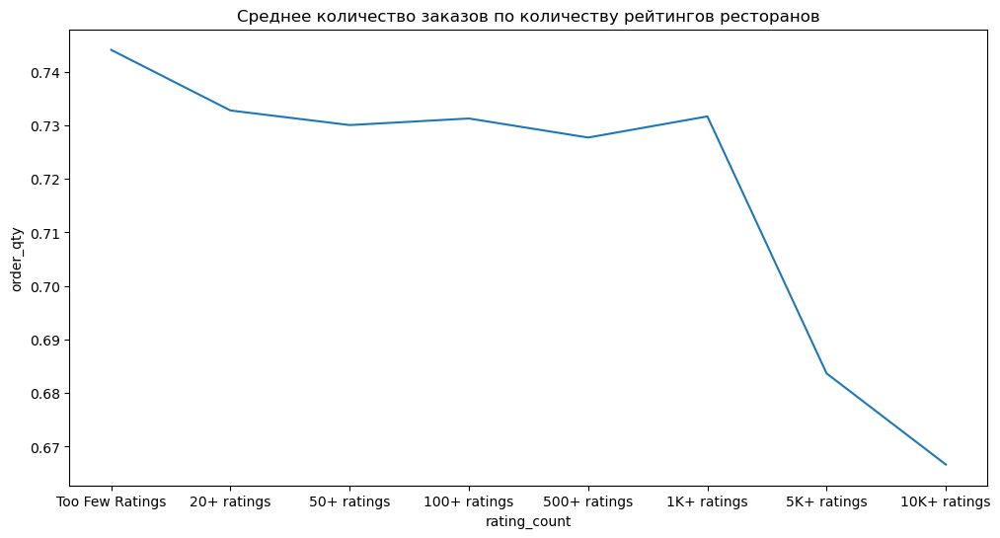

In [233]:
pylab.figure(figsize(12, 6))
plt.title('Cреднее количество заказов по количеству рейтингов ресторанов')
d1=pd.DataFrame({'rating_count':d['rating_count'],'order_qty':d['order_qty']['mean']})
ax=sns.lineplot(data=d1, x="rating_count", y="order_qty")

Протестируем гипотезу о равенстве средних чеков для групп: 

    1)Рестораны с малым количеством рейтингов(отзывов) до 20
    2)Рестораны количеством рейтингов(отзывов), большим 20

Так как метрика среднего количества блюд в заказе является ratio-метрикой, то применим линеризацию.

In [234]:
y1 = pd.DataFrame(restaurant[restaurant['rating_count']=='Too Few Ratings'], columns=restaurant.columns).reset_index(drop=True)
y2 = pd.DataFrame(restaurant[restaurant['rating_count']!='Too Few Ratings'], columns=restaurant.columns).reset_index(drop=True)
s1,s2 = linerization(y1,y2,'sum_sales_qty')

[Text(0, 0, '87.714'),
 Text(0, 0, '5.43979'),
 Text(0, 0, '2.46386'),
 Text(0, 0, '1.79795'),
 Text(0, 0, '0.820905'),
 Text(0, 0, '0.794498'),
 Text(0, 0, '0.646391'),
 Text(0, 0, '0.322621')]

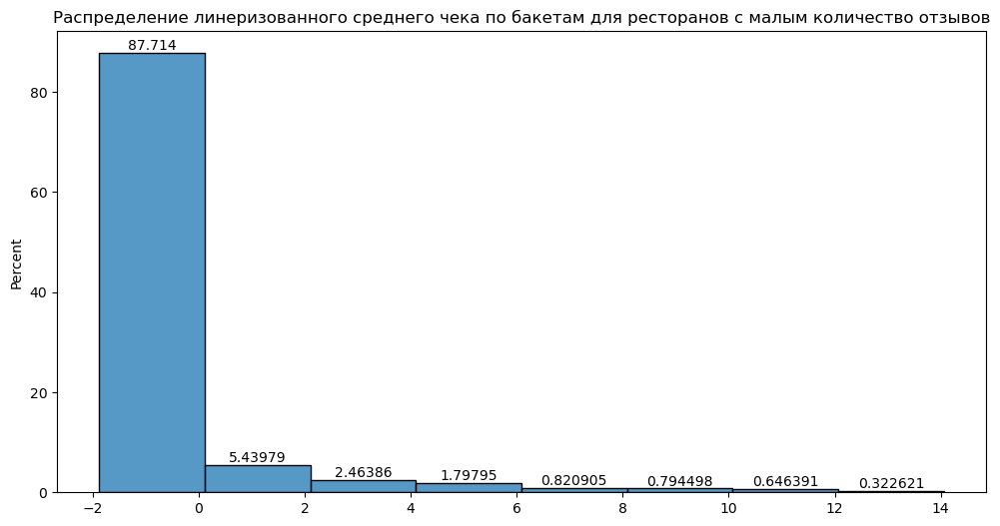

In [235]:
pylab.figure(figsize(12, 6))
plt.title('Распределение линеризованного среднего чека по бакетам для ресторанов с малым количество отзывов')
ax=sns.histplot(s1, stat='percent', binwidth=2)
ax.bar_label (ax.containers [ 0 ])

[Text(0, 0, '86.7369'),
 Text(0, 0, '5.86579'),
 Text(0, 0, '2.67411'),
 Text(0, 0, '2.03773'),
 Text(0, 0, '0.859361'),
 Text(0, 0, '0.882147'),
 Text(0, 0, '0.621735'),
 Text(0, 0, '0.32226')]

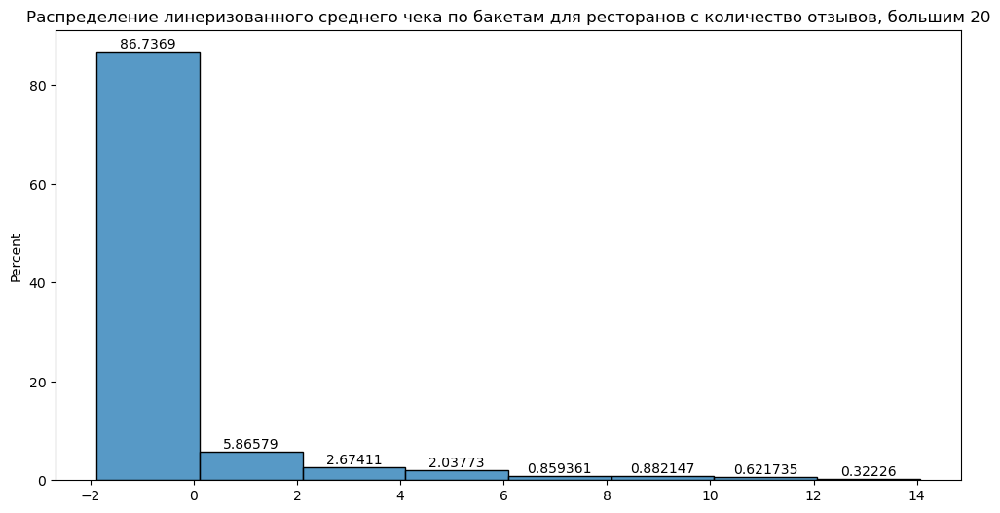

In [236]:
pylab.figure(figsize(12, 6))
plt.title('Распределение линеризованного среднего чека по бакетам для ресторанов с количество отзывов, большим 20')
ax=sns.histplot(s2, stat='percent', binwidth=2)
ax.bar_label (ax.containers [ 0 ])

Проведем t-test о равенстве средних:

In [237]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=-5.119225498455274, pvalue=3.071744406781428e-07, df=148538.0)

На 5% уровне значимости можно отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних чеков для групп: 

    1)Рестораны с малым количеством рейтингов(отзывов) до 20
    2)Рестораны количеством рейтингов(отзывов), большим 20
    
**можно отвергнуть на 5% уровне значимости.**

Построим 95% доверительный интервал для разности средних. Видим, что с 95%-ной вероятностью рестораны с количеством рейтингов,  меньшим 20, в среднем получают меньше за заказ, чем рестораны с количеством рейтингов,  большим 20.

In [238]:
diff=mean(s1)-mean(s2)
diff_sd=np.sqrt(var(s1, ddof=1)/len(s1)+var(s2, ddof=1)/len(s2))
left, right=st.norm.interval(0.95, loc=diff, scale=diff_sd)
print(f'95% confidence interval: [{left} ; {right}]')

95% confidence interval: [-0.0756103389797747 ; -0.03364518253241153]


### cost

[Text(0, 0, '0.548578'),
 Text(0, 0, '5.16955'),
 Text(0, 0, '10.2946'),
 Text(0, 0, '30.2705'),
 Text(0, 0, '15.381'),
 Text(0, 0, '23.3134'),
 Text(0, 0, '4.85629'),
 Text(0, 0, '9.03631'),
 Text(0, 0, '1.12982')]

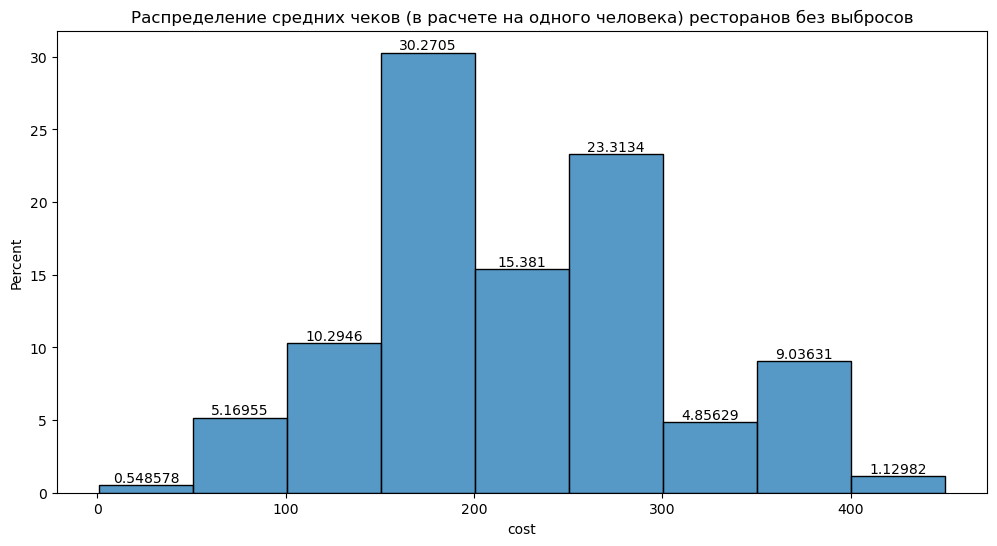

In [239]:
IQR = restaurant['cost'].quantile(0.75) - restaurant ['cost'].quantile(0.25)
plt.title('Распределение средних чеков (в расчете на одного человека) ресторанов без выбросов')
ax=sns.histplot(restaurant[restaurant['cost']<=restaurant['cost'].quantile(0.75)+1.5*IQR]['cost'], stat='percent', binwidth=50)
ax.bar_label (ax.containers [ 0 ])

Видно, что распределение переменной cost не является нормальным.

### average_number_of_people

In [240]:
restaurant['average_number_of_people']=restaurant['sum_sales_amount']/restaurant['order_qty']/restaurant['cost']

/tmp/ipykernel_54114/3631941208.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[Text(0, 0, '54.4378'),
 Text(0, 0, '21.6493'),
 Text(0, 0, '10.3253'),
 Text(0, 0, '6.02674'),
 Text(0, 0, '4.28232'),
 Text(0, 0, '3.27854')]

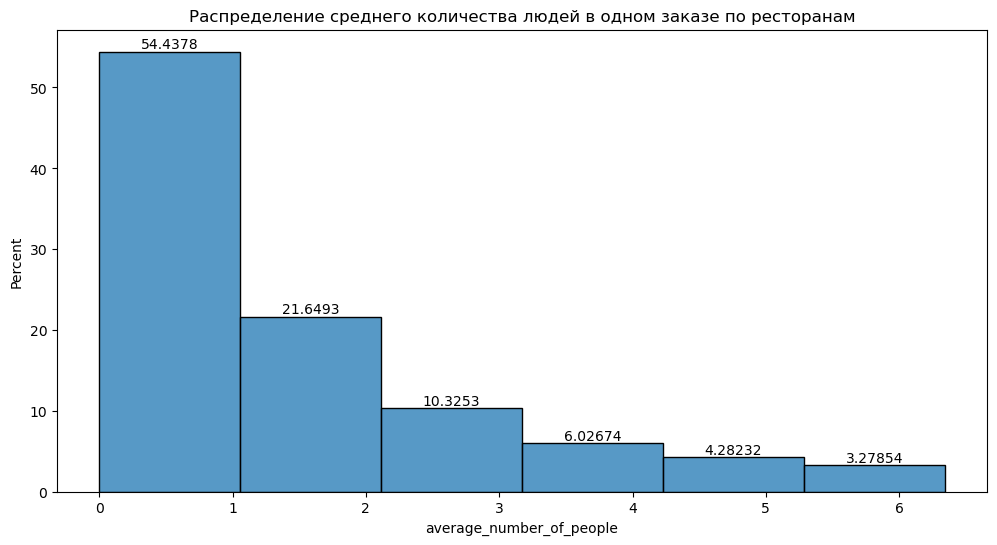

In [241]:
plt.title('Распределение среднего количества людей в одном заказе по ресторанам')
ax=sns.histplot(restaurant[restaurant['average_number_of_people']<=2.5*restaurant['average_number_of_people'].quantile(0.75)-1.5*restaurant['average_number_of_people'].quantile(0.25)]
                ['average_number_of_people'], stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Видно, что распределение переменной average_number_of_people не является нормальным.

### cuisine

In [242]:
b=list(restaurant['cuisine'])+list(restaurant[restaurant['additional_cuisine']!='No']['additional_cuisine'])

[Text(0, 0, '28.9457'),
 Text(0, 0, '36.2721'),
 Text(0, 0, '3.40724'),
 Text(0, 0, '2.25142'),
 Text(0, 0, '20.7202'),
 Text(0, 0, '2.44292'),
 Text(0, 0, '1.40018'),
 Text(0, 0, '0.534158'),
 Text(0, 0, '1.56383'),
 Text(0, 0, '0.923411'),
 Text(0, 0, '0.450056'),
 Text(0, 0, '1.08877')]

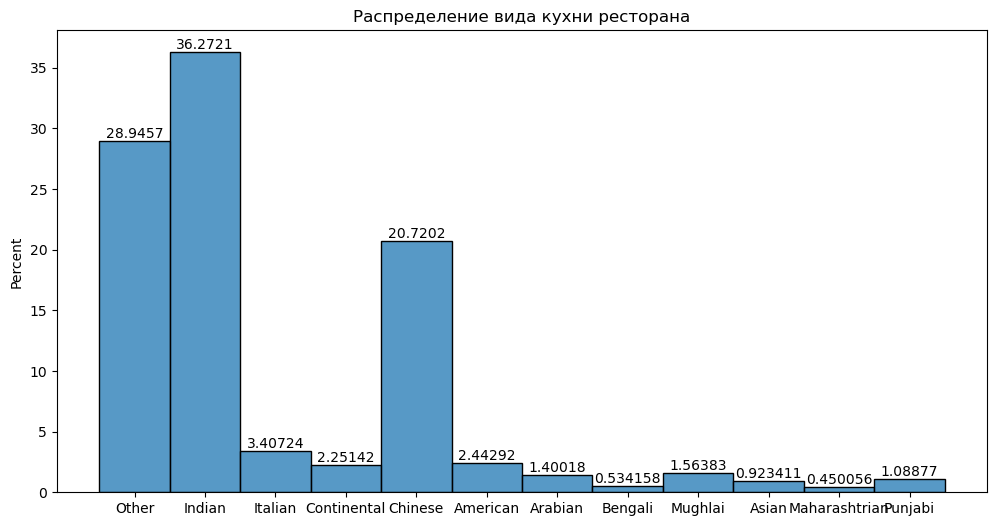

In [243]:
plt.title('Распределение вида кухни ресторана')
ax=sns.histplot(b, stat='percent')
ax.bar_label (ax.containers [ 0 ])

### additional_cuisine

[Text(0, 0, '81.5282'), Text(0, 0, '18.4718')]

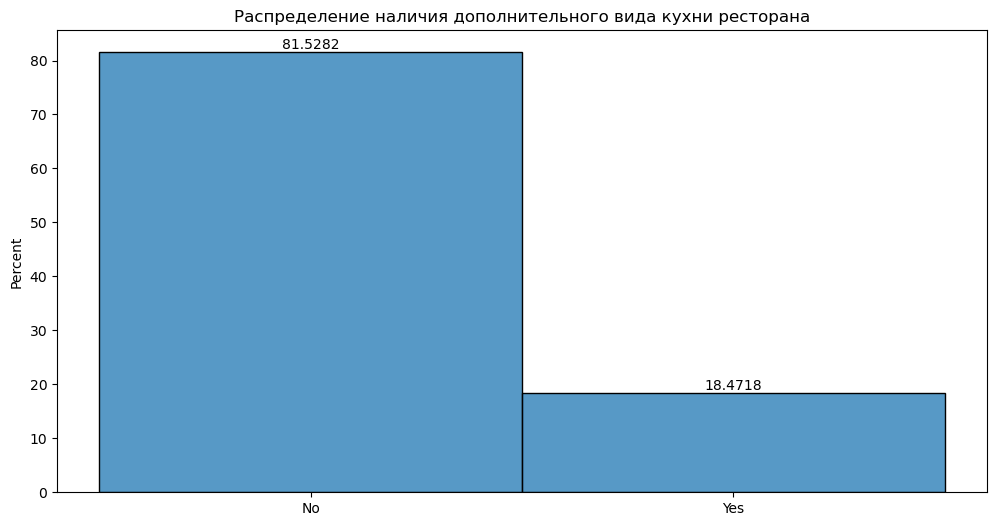

In [244]:
a=np.where(restaurant['additional_cuisine']=='No', 'No', 'Yes')
pylab.figure(figsize(12, 6))
plt.title('Распределение наличия дополнительного вида кухни ресторана')
ax=sns.histplot(a, stat='percent')
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменных sum_sales_amount, sum_sales_qty, order_qty по кухне ресторана(cuisine):

In [245]:
d=restaurant.groupby('cuisine').agg({'sum_sales_amount':['median', 'mean', 'std'],
                            'sum_sales_qty':['median', 'mean', 'std'],
                                'order_qty':['median', 'mean', 'std']}).reset_index()
d

cuisine sum_sales_amount                         sum_sales_qty  \
                            median        mean         std        median   
0        American            162.0  404.716338  598.747752           1.0   
1         Arabian            155.0  401.865155  609.907262           1.0   
2           Asian            169.0  393.515152  580.920882           1.0   
3         Bengali            176.0  321.036717  475.008012           1.0   
4         Chinese            162.0  397.590928  590.971905           1.0   
5     Continental            167.0  419.679306  615.268797           1.0   
6          Indian            157.0  404.394941  606.111463           1.0   
7         Italian            162.0  397.187899  588.805918           1.0   
8   Maharashtrian            148.0  338.873479  541.071262           1.0   
9         Mughlai            167.0  385.337737  569.185507           1.0   
10          Other            162.0  408.762888  604.617847           1.0   
11        Punjabi            118.0  384.260563  578.224560           1.0   

                       order_qty                      
        mean       std    median      mean       std  
0   1.464417  2.221557       1.0  0.738390  0.441860  
1   1.649165  2.471051       1.0  0.755370  0.429996  
2   1.418182  2.177734       1.0  0.739394  0.439632  
3   1.207343  1.346870       1.0  0.822894  0.382171  
4   1.447522  2.187669       1.0  0.745578  0.437051  
5   1.510279  2.328488       1.0  0.739150  0.440238  
6   1.444540  2.194689       1.0  0.733371  0.443123  
7   1.447684  2.164509       1.0  0.746406  0.435111  
8   1.167883  1.567518       1.0  0.761557  0.426651  
9   1.392238  1.914427       1.0  0.771263  0.420193  
10  1.470709  2.224730       1.0  0.736169  0.441647  
11  1.443662  2.436543       1.0  0.665493  0.472651

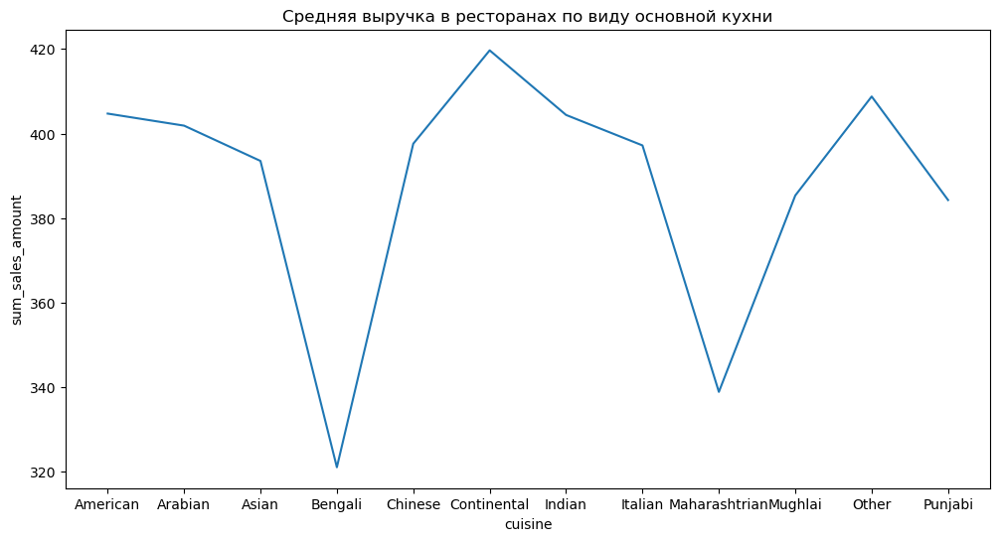

In [246]:
pylab.figure(figsize(12, 6))
plt.title('Средняя выручка в ресторанах по виду основной кухни')
d1=pd.DataFrame({'cuisine':d['cuisine'],'sum_sales_amount':d['sum_sales_amount']['mean']})
ax=sns.lineplot(data=d1, x="cuisine", y="sum_sales_amount")

Протестируем гипотезу о равенстве средних значений sum_sales_amount для групп: 

    1)Рестораны с китайской кухней
    2)Рестораны с индийской кухней

Мы видим, что наши группы независимы, но распределения групп не задаются конкретным распределением, поэтому мы не можем применить t-test. Поэтому применим бакетное преобразование.

In [247]:
kstest(restaurant[restaurant['cuisine']=='Chinese']['sum_sales_amount'], 'norm', 
       args=(restaurant[restaurant['cuisine']=='Chinese']['sum_sales_amount'].mean(),
             restaurant[restaurant['cuisine']=='Chinese']['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.25054532785962236, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

In [248]:
kstest(restaurant[restaurant['cuisine']=='Indian']['sum_sales_amount'], 'norm', 
       args=(restaurant[restaurant['cuisine']=='Indian']['sum_sales_amount'].mean(),
             restaurant[restaurant['cuisine']=='Indian']['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.2523235795922199, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

Разбиваем группы случайным образом на 200 бакетов:

In [249]:
y1 = pd.DataFrame(restaurant[restaurant['cuisine']=='Chinese'], columns=restaurant.columns).reset_index(drop=True)
y2 = pd.DataFrame(restaurant[restaurant['cuisine']=='Indian'], columns=restaurant.columns).reset_index(drop=True)
s1,s2,n1,n2 = Bucketization(y1,y2,200,'sum_sales_amount')
print('Количество элементов в бакете для restaurant[cuisine]=Chinese', {n1})
print('Количество элементов в бакете для restaurant[cuisine]=Indian', {n2})

/tmp/ipykernel_54114/1724550939.py:11: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_54114/1724550939.py:16: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead



Количество элементов в бакете для restaurant[cuisine]=Chinese {182}
Количество элементов в бакете для restaurant[cuisine]=Indian {232}


Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов первой группы является нормальным:

ShapiroResult(statistic=0.9932729005813599, pvalue=0.49671077728271484)
KstestResult(statistic=0.042426681248108555, pvalue=0.8490034830285111, statistic_location=421.95, statistic_sign=1)


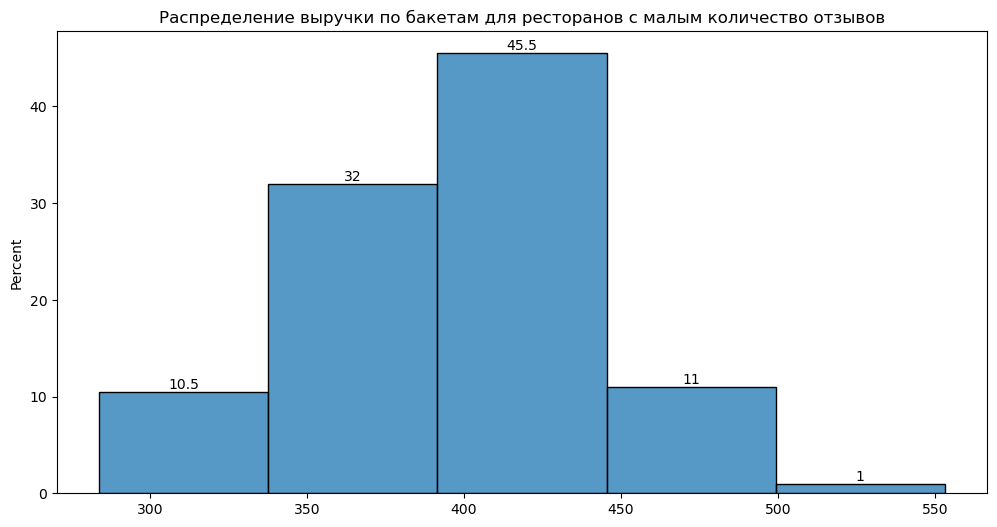

In [250]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
from scipy.stats import shapiro
plt.title('Распределение выручки по бакетам для ресторанов с малым количество отзывов')
ax=sns.histplot(s1, stat='percent', binwidth=50)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s1))
print(kstest(s1, 'norm', args=(mean(s1),std(s1,ddof=1))))

Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов второй группы является нормальным:

ShapiroResult(statistic=0.9945158362388611, pvalue=0.677882194519043)
KstestResult(statistic=0.04748622717362294, pvalue=0.7394637047410944, statistic_location=416.42, statistic_sign=1)


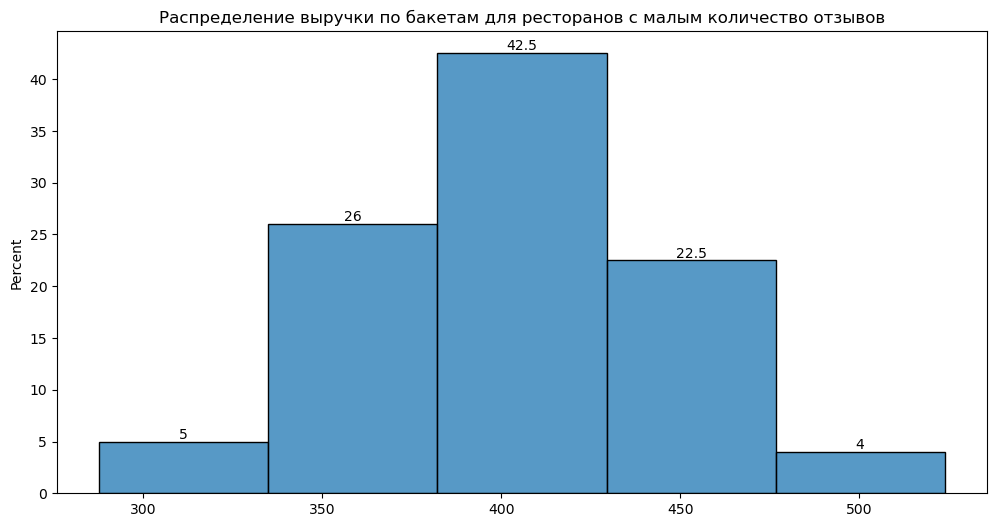

In [251]:
from scipy.stats import shapiro
pylab.figure(figsize(12, 6))
from scipy.stats import shapiro
plt.title('Распределение выручки по бакетам для ресторанов с малым количество отзывов')
ax=sns.histplot(s2, stat='percent', binwidth=50)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s2))
print(kstest(s2, 'norm', args=(mean(s2),std(s2,ddof=1))))

Убедившись в нормальности распределений, проведем t-test о равенстве средних:

In [252]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=-1.6159822617106117, pvalue=0.10689050281248556, df=398.0)

На 5% уровне значимости нельзя отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних значений sum_sales_amount для групп: 

    1)Рестораны с китайской кухней
    2)Рестораны с индийской кухней
    
**нельзя отвергнуть на 5% уровне значимости.**

### food

In [253]:
b=list(restaurant['food'])+list(restaurant[restaurant['additional_food']!='No']['additional_food'])

[Text(0, 0, '8.03808'),
 Text(0, 0, '4.97888'),
 Text(0, 0, '7.82516'),
 Text(0, 0, '34.691'),
 Text(0, 0, '9.70597'),
 Text(0, 0, '6.30485'),
 Text(0, 0, '1.32203'),
 Text(0, 0, '5.54554'),
 Text(0, 0, '3.01527'),
 Text(0, 0, '1.03588'),
 Text(0, 0, '0.987439'),
 Text(0, 0, '8.18115'),
 Text(0, 0, '1.12713'),
 Text(0, 0, '1.71013'),
 Text(0, 0, '0.944066'),
 Text(0, 0, '0.576241'),
 Text(0, 0, '0.608911'),
 Text(0, 0, '0.675379'),
 Text(0, 0, '0.70467'),
 Text(0, 0, '0.503577'),
 Text(0, 0, '0.513153'),
 Text(0, 0, '1.00546')]

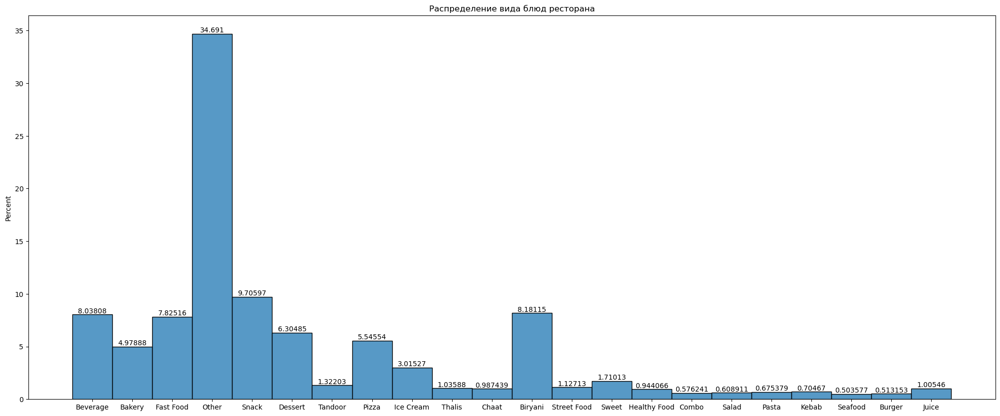

In [254]:
pylab.figure(figsize(25, 10))
plt.title('Распределение вида блюд ресторана')
ax=sns.histplot(b, stat='percent')
ax.bar_label (ax.containers [ 0 ])

### additional_food

[Text(0, 0, '19.5166'), Text(0, 0, '80.4834')]

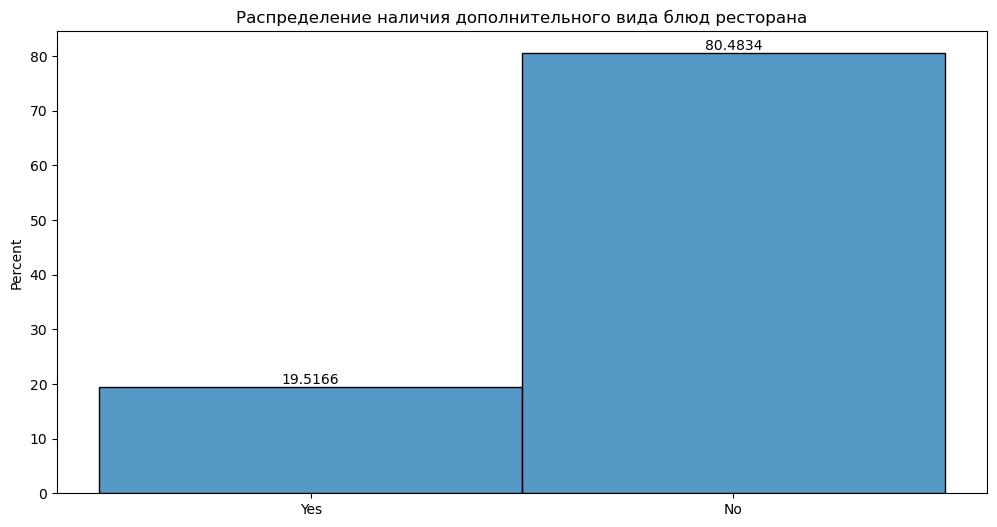

In [255]:
a=np.where(restaurant['additional_food']=='No', 'No', 'Yes')
pylab.figure(figsize(12, 6))
plt.title('Распределение наличия дополнительного вида блюд ресторана')
ax=sns.histplot(a, stat='percent')
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменных sum_sales_amount, sum_sales_qty, order_qty по виду блюд ресторана(food):

In [256]:
d=restaurant.groupby('food').agg({'sum_sales_amount':['median', 'mean', 'std'],
                            'sum_sales_qty':['median', 'mean', 'std'],
                                 'order_qty':['median', 'mean', 'std']}).reset_index()
d

food sum_sales_amount                         sum_sales_qty  \
                           median        mean         std        median   
0         Bakery            157.0  391.775701  587.029619           1.0   
1       Beverage            157.0  406.452192  607.553383           1.0   
2        Biryani            162.0  411.224804  613.195080           1.0   
3         Burger            167.0  419.842391  599.528414           1.0   
4          Chaat            167.0  466.361702  663.947680           1.0   
5          Combo            176.0  408.714286  600.341592           1.0   
6        Dessert            171.0  419.295207  617.041130           1.0   
7      Fast Food            157.0  391.843290  581.624380           1.0   
8   Healthy Food            181.0  419.503724  628.532649           1.0   
9      Ice Cream            167.0  428.300070  630.765830           1.0   
10         Juice            144.0  448.234375  685.672458           1.0   
11         Kebab            171.0  378.112308  553.291380           1.0   
12         Other            157.0  400.038417  597.295318           1.0   
13         Pasta            194.0  413.559078  566.197696           1.0   
14         Pizza            162.0  405.420187  603.249606           1.0   
15         Salad            201.5  414.018072  565.780171           1.0   
16       Seafood            157.0  415.330275  619.566618           1.0   
17         Snack            167.0  402.364982  593.975835           1.0   
18   Street Food            157.0  408.936901  612.348464           1.0   
19         Sweet            167.0  395.787481  564.935617           1.0   
20       Tandoor            167.0  418.197906  623.677937           1.0   
21        Thalis            144.0  369.844735  566.951578           1.0   

                       order_qty                      
        mean       std    median      mean       std  
0   1.404907  2.145954       1.0  0.740421  0.441112  
1   1.450233  2.234560       1.0  0.731444  0.443410  
2   1.518610  2.312603       1.0  0.731478  0.444479  
3   1.744565  2.542529       1.0  0.744565  0.437295  
4   1.752190  2.777671       1.0  0.737171  0.443282  
5   1.499248  2.232782       1.0  0.753383  0.431366  
6   1.497851  2.218868       1.0  0.740937  0.439902  
7   1.434488  2.151993       1.0  0.748507  0.434581  
8   1.513966  2.222542       1.0  0.744879  0.436132  
9   1.500351  2.340217       1.0  0.720309  0.449005  
10  1.626953  2.408298       1.0  0.726562  0.446159  
11  1.492308  2.330365       1.0  0.758462  0.428346  
12  1.449202  2.196327       1.0  0.739555  0.440137  
13  1.495677  2.207936       1.0  0.749280  0.434054  
14  1.425811  2.121340       1.0  0.730786  0.443908  
15  1.620482  2.295524       1.0  0.786145  0.410645  
16  1.550459  2.328869       1.0  0.766710  0.423202  
17  1.425512  2.136303       1.0  0.742615  0.437737  
18  1.353834  2.131236       1.0  0.719649  0.452894  
19  1.492272  2.171570       1.0  0.747295  0.436506  
20  1.508973  2.270195       1.0  0.739282  0.440270  
21  1.264128  1.894969       1.0  0.727543  0.445356

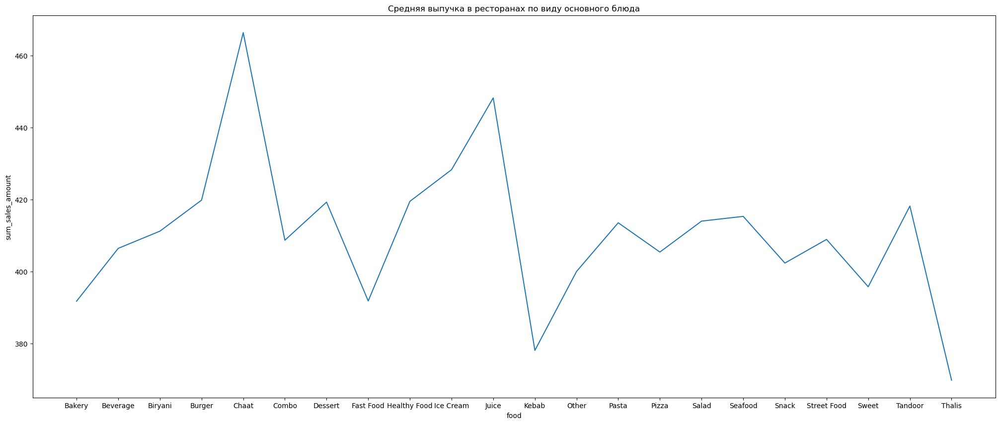

In [257]:
pylab.figure(figsize(25, 10))
plt.title('Средняя выпучка в ресторанах по виду основного блюда')
d1=pd.DataFrame({'food':d['food'],'sum_sales_amount':d['sum_sales_amount']['mean']})
ax=sns.lineplot(data=d1, x="food", y="sum_sales_amount")

Протестируем гипотезу о равенстве средних значений sum_sales_amount для групп: 

    1)Biryani
    2)Fast Food

Мы видим, что наши группы независимы, но распределения групп не задаются конкретным распределением, поэтому мы не можем применить t-test. Поэтому применим бакетное преобразование.

In [258]:
kstest(restaurant[restaurant['food']=='Biryani']['sum_sales_amount'], 'norm', 
       args=(restaurant[restaurant['food']=='Biryani']['sum_sales_amount'].mean(),
             restaurant[restaurant['food']=='Biryani']['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.2512292827865914, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

In [259]:
kstest(restaurant[restaurant['food']=='Fast Food']['sum_sales_amount'], 'norm', 
       args=(restaurant[restaurant['food']=='Fast Food']['sum_sales_amount'].mean(),
             restaurant[restaurant['food']=='Fast Food']['sum_sales_amount'].std(ddof=1)))

KstestResult(statistic=0.2502494210696983, pvalue=0.0, statistic_location=0.0, statistic_sign=-1)

Разбиваем группы случайным образом на 100 бакетов:

In [260]:
y1 = pd.DataFrame(restaurant[restaurant['food']=='Biryani'], columns=restaurant.columns).reset_index(drop=True)
y2 = pd.DataFrame(restaurant[restaurant['food']=='Fast Food'], columns=restaurant.columns).reset_index(drop=True)
s1, s2, n1, n2 =Bucketization(y1,y2,100,'sum_sales_amount')
print('Количество элементов в бакете для restaurant[food]=Biryani', {n1})
print('Количество элементов в бакете для restaurant[food]=Fast Food', {n2})

/tmp/ipykernel_54114/1724550939.py:11: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_54114/1724550939.py:16: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead



Количество элементов в бакете для restaurant[food]=Biryani {141}
Количество элементов в бакете для restaurant[food]=Fast Food {100}


Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов первой группы является нормальным:

ShapiroResult(statistic=0.9876059889793396, pvalue=0.47962701320648193)
KstestResult(statistic=0.050179924645335064, pvalue=0.9518467314181579, statistic_location=355.5, statistic_sign=-1)


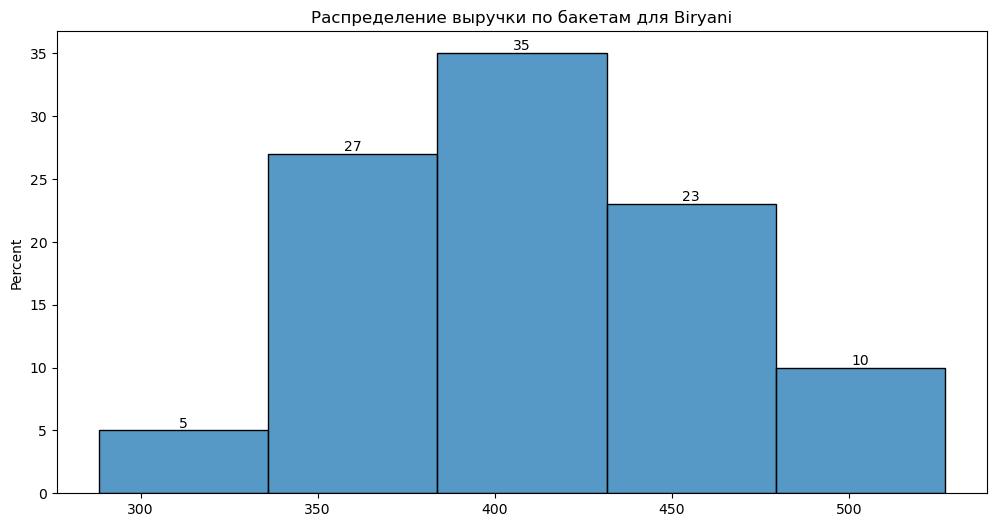

In [261]:

pylab.figure(figsize(12, 6))
plt.title('Распределение выручки по бакетам для Biryani')
ax=sns.histplot(s1, stat='percent', binwidth=50)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s1))
print(kstest(s1, 'norm', args=(mean(s1),std(s1,ddof=1))))

Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов второй группы является нормальным:

ShapiroResult(statistic=0.9849469065666199, pvalue=0.3148036599159241)
KstestResult(statistic=0.051911422736829305, pvalue=0.9374452212687221, statistic_location=366.09, statistic_sign=1)


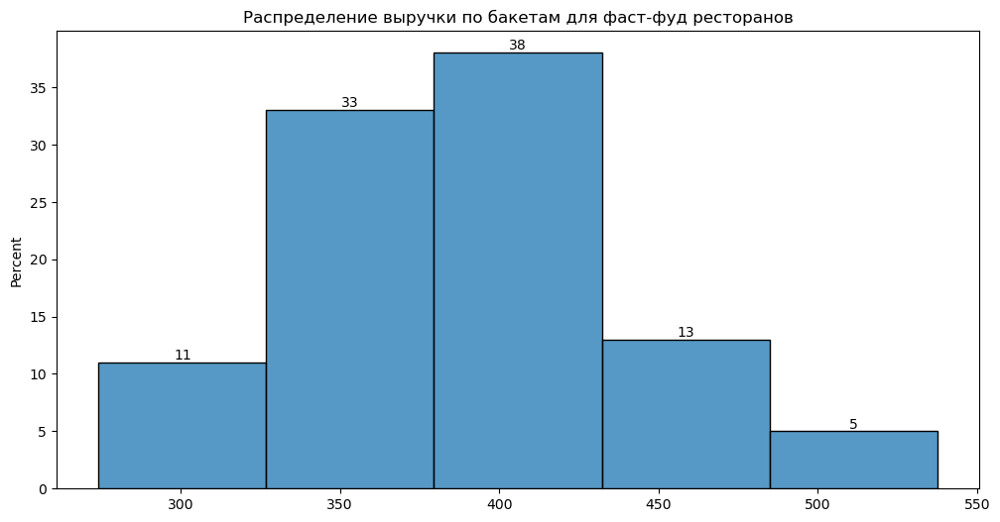

In [262]:
pylab.figure(figsize(12, 6))
plt.title('Распределение выручки по бакетам для фаст-фуд ресторанов')
ax=sns.histplot(s2, stat='percent', binwidth=50)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s2))
print(kstest(s2, 'norm', args=(mean(s2),std(s2,ddof=1))))

Убедившись в нормальности распределений, проведем t-test о равенстве средних:

In [263]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=2.716178998882219, pvalue=0.0071883589424024, df=198.0)

На 5%  уровне значимости можно отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних значений sum_sales_amount для групп: 

    1)Рестораны-пекарни
    2)Фастфуд-рестораны
    
**можно отвергнуть на 5%  уровне значимости .**

Построим 95% доверительный интервал для разности средних. Видим, что с 95%-ной вероятностью рестораны с Biryani в среднем получчают больше, чем рестораны с Fast Food, в интервале от 5.4 до 33.37 рупий.

In [264]:
diff=mean(s1)-mean(s2)
diff_sd=np.sqrt(var(s1, ddof=1)/100+var(s2, ddof=1)/100)
left, right=st.norm.interval(0.95, loc=diff, scale=diff_sd)
print(f'95% confidence interval: [{left} ; {right}]')

95% confidence interval: [5.395750829194062 ; 33.365249170805676]


Корреляционная матрица таблицы restaurant:

<Axes: >

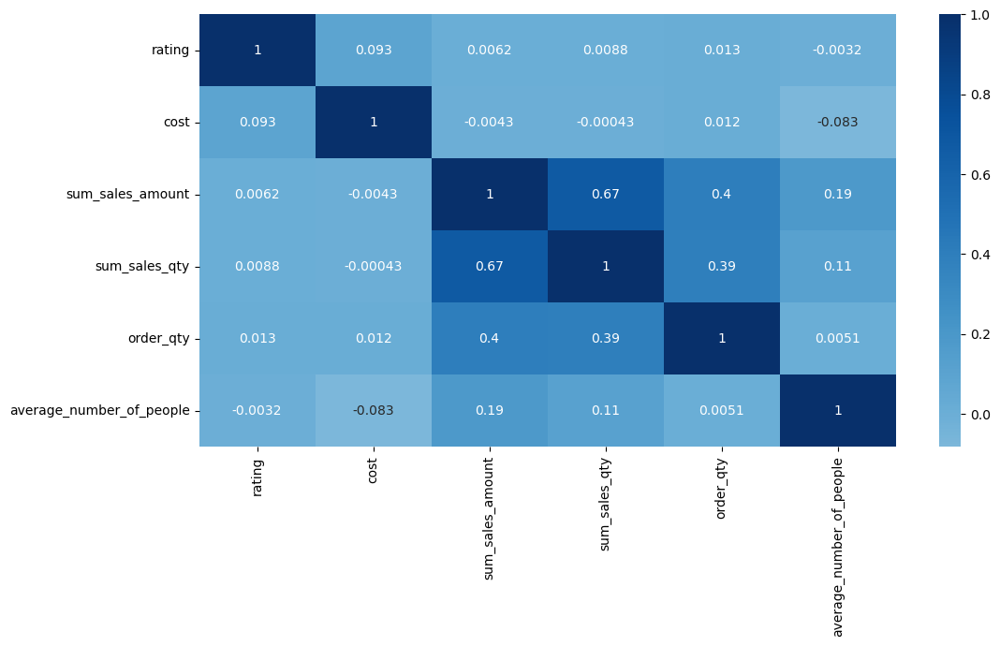

In [265]:
sns.heatmap(restaurant.corr(numeric_only = True), 
            xticklabels=restaurant.corr(numeric_only = True).columns, yticklabels=restaurant.corr(numeric_only = True).columns, cmap='Blues', center=0, annot=True)

## Блюда и меню (df2)

In [266]:
df2

,menu_id,r_id,f_id,price,menu_cuisine,menu_food,menu_additional_cuisine,menu_additional_food,item,veg_or_non_veg,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
0,mn0,567335,fd0,40.0,Other,Beverage,No,Pizza,Aloo Tikki Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
1,mn0,567335,fd669322,40.0,Other,Beverage,No,Pizza,Aloo Tikki Burger,Non-veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
2,mn1,567335,fd1,50.0,Other,Beverage,No,Pizza,Veg Creamy Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
3,mn2,567335,fd2,65.0,Other,Beverage,No,Pizza,Cheese Burst Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
4,mn3,567335,fd3,80.0,Other,Beverage,No,Pizza,Paneer Creamy Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1179658,mn1043764,294677,fd1043764,1249.0,Other,Pizza,No,No,Heavily Loaded Roasted & Peppery Lamb Deep Dis...,Non-veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No
1179659,mn1043765,294677,fd1043765,679.0,Other,Pizza,No,No,Heavily Loaded Forestiere Deep Dish Veg Pizza,Veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No
1179660,mn1043766,294677,fd1043766,799.0,Other,Pizza,No,No,Chicken Deep Dish Pizza,Non-veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No
1179661,mn1043767,294677,fd1043767,899.0,Other,Pizza,No,No,Roasted & Peppery Lamb Deep Dish Pizza,Non-veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No


In [267]:
df2.describe()

,price,rating,cost
count,1.179663e+06,1.179663e+06,1.179663e+06
mean,2.023954e+02,3.890690e+00,3.005462e+02
std,1.765594e+02,3.118355e-01,1.564077e+02
min,0.000000e+00,1.300000e+00,2.000000e+00
25%,1.000000e+02,3.900000e+00,2.000000e+02
50%,1.690000e+02,3.900000e+00,2.500000e+02
75%,2.500000e+02,4.000000e+00,3.500000e+02
max,9.999000e+03,5.000000e+00,3.999000e+03


Удалим выбросы в переменной price:

In [268]:
IQR = df2['price'].quantile(0.75) - df2 ['price'].quantile(0.25)
IQR

150.0

In [269]:
print("Границы выбросов: [{f}, {l}]".
      format(f=df2['price'].quantile(0.25)-1.5*IQR, l=df2['price'].quantile(0.75)+1.5*IQR))

Границы выбросов: [-125.0, 475.0]


Выбросы переменной price:

In [270]:
df2[(df2['price'].quantile(0.75)+1.5*IQR<df2['price'])
    |(df2['price'].quantile(0.25)-1.5*IQR>df2['price'])]

,menu_id,r_id,f_id,price,menu_cuisine,menu_food,menu_additional_cuisine,menu_additional_food,item,veg_or_non_veg,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
185,mn332,158203,fd332,480.0,Other,Beverage,No,No,13 ' Large Spicy Paneer Pizza,Veg,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No
186,mn466,158203,fd332,480.0,Other,Beverage,No,No,13 ' Large Spicy Paneer Pizza,Veg,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No
189,mn335,158203,fd335,499.0,Other,Beverage,No,No,13 ' Large Paneer Makhani Pizza,Veg,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No
190,mn484,158203,fd335,499.0,Other,Beverage,No,No,13 ' Large Paneer Makhani Pizza,Veg,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No
207,mn344,158203,fd344,720.0,Other,Beverage,No,No,2 Strawberry Shake + 2 Punjabi Paneer Cruncher...,Veg,theka coffee desi,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1179658,mn1043764,294677,fd1043764,1249.0,Other,Pizza,No,No,Heavily Loaded Roasted & Peppery Lamb Deep Dis...,Non-veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No
1179659,mn1043765,294677,fd1043765,679.0,Other,Pizza,No,No,Heavily Loaded Forestiere Deep Dish Veg Pizza,Veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No
1179660,mn1043766,294677,fd1043766,799.0,Other,Pizza,No,No,Chicken Deep Dish Pizza,Non-veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No
1179661,mn1043767,294677,fd1043767,899.0,Other,Pizza,No,No,Roasted & Peppery Lamb Deep Dish Pizza,Non-veg,Deep Dish Pizzeria,"HSR,Bangalore",3.9,Too Few Ratings,1000.0,Other,Pizza,No,No


In [271]:
outliers2=df2[df2['price'] > df2['price'].quantile(0.75)+1.5*IQR]

Самые дорогие блюда:

In [272]:
outliers2.sort_values(by='price', ascending=False)[:15]

,menu_id,r_id,f_id,price,menu_cuisine,menu_food,menu_additional_cuisine,menu_additional_food,item,veg_or_non_veg,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
410438,mn620165,571225,fd620165,9999.0,Other,Fast Food,No,Pizza,Veg Main Course Party Pack For 30 Person,Veg,The Spice Kitchen,Amritsar,3.9,Too Few Ratings,150.0,Other,Fast Food,No,Pizza
1060350,mn320470,37817,fd320470,9990.0,Other,Dessert,No,Bakery,Chocolate Truffle (1 Kg),Veg,Cakes N Bakes,"Navrangpura,Ahmedabad",3.6,100+ ratings,350.0,Other,Dessert,No,Bakery
407133,mn610749,225715,fd603779,7999.0,Italian,Other,Continental,No,Chicken Main Course For 20 Persons,Non-veg,Day Night Store,Amritsar,3.0,20+ ratings,200.0,Italian,Other,Continental,No
406772,mn609887,76297,fd603779,7999.0,Chinese,Other,Indian,No,Chicken Main Course For 20 Persons,Non-veg,Cafe Chokolade,Amritsar,3.5,20+ ratings,250.0,Chinese,Other,Indian,No
678386,mn607324,425225,fd603779,7999.0,Indian,Other,Punjabi,No,Chicken Main Course For 20 Persons,Non-veg,Amritsari kulcha 24/7,Amritsar,3.4,20+ ratings,200.0,Indian,Other,Punjabi,No
404478,mn603779,313856,fd603779,7999.0,Chinese,Other,Indian,No,Chicken Main Course For 20 Persons,Non-veg,Midnight Cravings,Amritsar,3.9,Too Few Ratings,200.0,Chinese,Other,Indian,No
643912,mn611183,433632,fd603779,7999.0,Indian,Other,No,No,Chicken Main Course For 20 Persons,Non-veg,Chai wai and coffee 24/7,Amritsar,3.9,Too Few Ratings,300.0,Indian,Other,No,No
678532,mn609478,459068,fd603779,7999.0,Indian,Other,Punjabi,No,Chicken Main Course For 20 Persons,Non-veg,Kulcha Factory 24 Hours,Amritsar,3.1,20+ ratings,250.0,Indian,Other,Punjabi,No
643754,mn611107,307621,fd603779,7999.0,Italian,Beverage,No,No,Chicken Main Course For 20 Persons,Non-veg,Momo JoJo,Amritsar,3.9,Too Few Ratings,300.0,Italian,Beverage,No,No
643634,mn610587,482046,fd603779,7999.0,Other,Beverage,No,Pizza,Chicken Main Course For 20 Persons,Non-veg,Day night cafe 24/7,Amritsar,3.9,Too Few Ratings,250.0,Other,Beverage,No,Pizza


Таблица df2 без выбросов:

In [273]:
df2=df2[df2['price'] <= df2['price'].quantile(0.75)+1.5*IQR]
df2

,menu_id,r_id,f_id,price,menu_cuisine,menu_food,menu_additional_cuisine,menu_additional_food,item,veg_or_non_veg,restaurant_name,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food
0,mn0,567335,fd0,40.0,Other,Beverage,No,Pizza,Aloo Tikki Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
1,mn0,567335,fd669322,40.0,Other,Beverage,No,Pizza,Aloo Tikki Burger,Non-veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
2,mn1,567335,fd1,50.0,Other,Beverage,No,Pizza,Veg Creamy Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
3,mn2,567335,fd2,65.0,Other,Beverage,No,Pizza,Cheese Burst Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
4,mn3,567335,fd3,80.0,Other,Beverage,No,Pizza,Paneer Creamy Burger,Veg,AB FOODS POINT,Abohar,3.9,Too Few Ratings,200.0,Other,Beverage,No,Pizza
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1179650,mn1043132,281585,fd1043132,219.0,Other,Fast Food,No,No,Malai Chicken Bunny Buns,Non-veg,Bunny Buns and Breads,"HSR,Bangalore",3.9,Too Few Ratings,200.0,Other,Fast Food,No,No
1179651,mn1043133,281585,fd1043133,219.0,Other,Fast Food,No,No,Malai Paneer Bunny Buns,Veg,Bunny Buns and Breads,"HSR,Bangalore",3.9,Too Few Ratings,200.0,Other,Fast Food,No,No
1179652,mn1043135,281585,fd1043135,199.0,Other,Fast Food,No,No,Butter Paneer Bunny Buns,Veg,Bunny Buns and Breads,"HSR,Bangalore",3.9,Too Few Ratings,200.0,Other,Fast Food,No,No
1179653,mn1043136,281585,fd1043136,199.0,Other,Fast Food,No,No,Chilli Chicken Bunny Buns,Non-veg,Bunny Buns and Breads,"HSR,Bangalore",3.9,Too Few Ratings,200.0,Other,Fast Food,No,No


### price

[Text(0, 0, '1.02787'),
 Text(0, 0, '3.47377'),
 Text(0, 0, '5.07629'),
 Text(0, 0, '6.63768'),
 Text(0, 0, '6.99927'),
 Text(0, 0, '7.74764'),
 Text(0, 0, '8.65735'),
 Text(0, 0, '8.76643'),
 Text(0, 0, '7.13033'),
 Text(0, 0, '6.97131'),
 Text(0, 0, '6.21866'),
 Text(0, 0, '5.45693'),
 Text(0, 0, '5.55158'),
 Text(0, 0, '3.72878'),
 Text(0, 0, '3.40343'),
 Text(0, 0, '3.07194'),
 Text(0, 0, '2.16988'),
 Text(0, 0, '2.12518'),
 Text(0, 0, '1.27735'),
 Text(0, 0, '1.1909'),
 Text(0, 0, '1.19099'),
 Text(0, 0, '0.773215'),
 Text(0, 0, '0.858692'),
 Text(0, 0, '0.494523')]

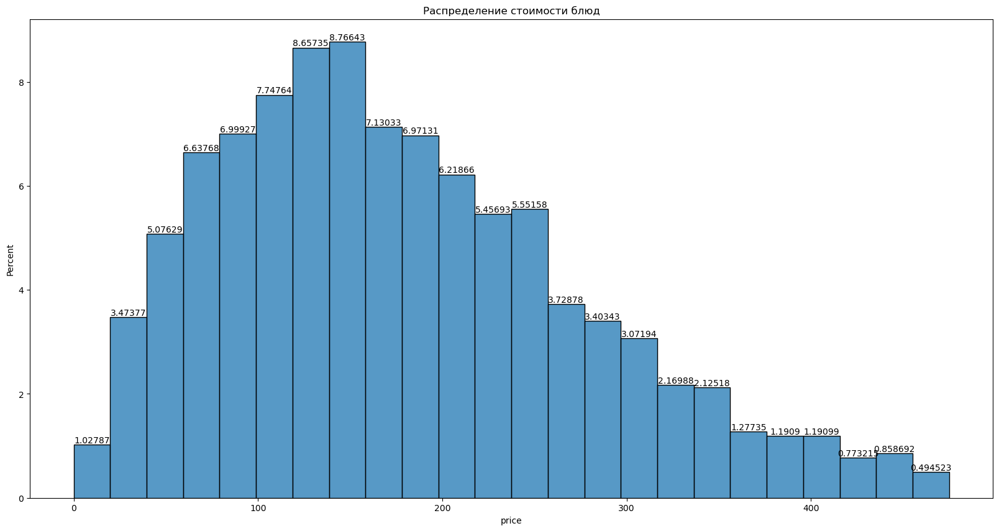

In [274]:
pylab.figure(figsize(20, 10))
plt.title('Распределение стоимости блюд')
ax=sns.histplot(df2['price'], stat='percent', binwidth=20)
ax.bar_label (ax.containers [ 0 ])

Распределение переменной price похоже на нормальное, но с длинным правым "хвостом".

### f_id

[Text(0, 0, '80.6965'), Text(0, 0, '14.7589'), Text(0, 0, '4.54457')]

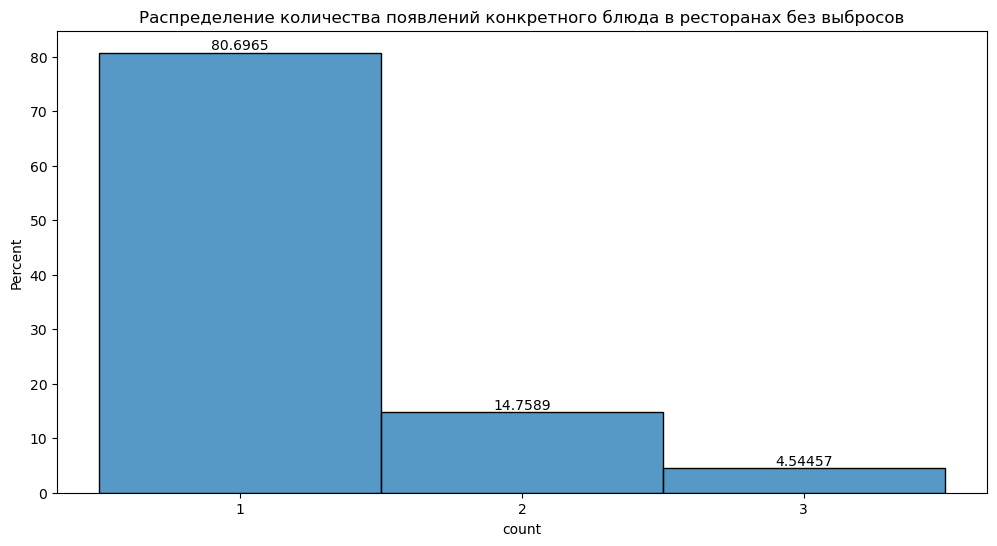

In [275]:
w=df2['f_id'].value_counts()
IQR = w.quantile(0.75) - w.quantile(0.25)
pylab.figure(figsize(12, 6))
plt.title('Распределение количества появлений конкретного блюда в ресторанах без выбросов')
plt.xticks(range(1, 4))
ax=sns.histplot(w[w<=w.quantile(0.75)+1.5*IQR], discrete=True, stat='percent')
ax.bar_label (ax.containers [ 0 ])

### r_id

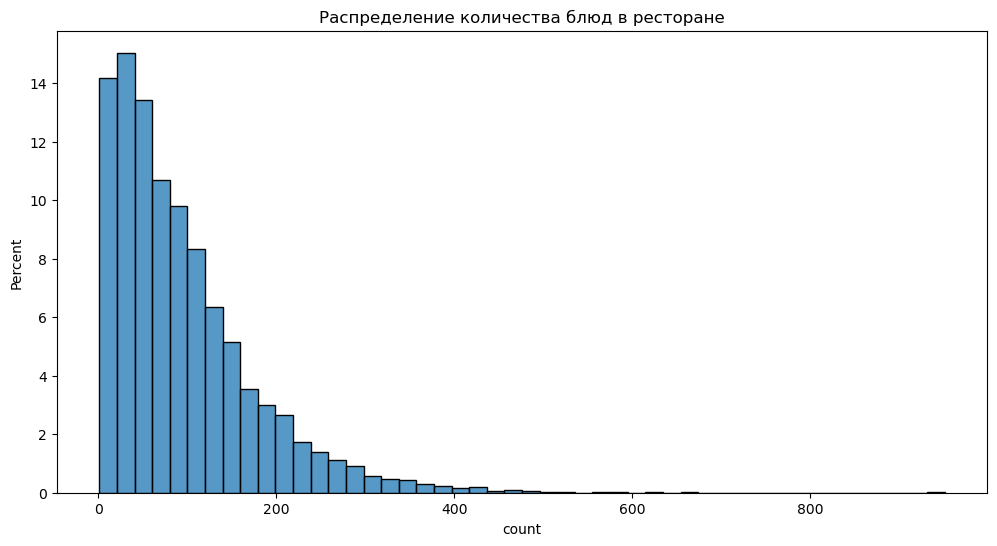

In [276]:
pylab.figure(figsize(12, 6))
plt.title('Распределение количества блюд в ресторане')
ax=sns.histplot(df2['r_id'].value_counts(), stat='percent', binwidth=20)

Распределение количества блюд в ресторанах не является нормальным.

### menu_id

[Text(0, 0, '87.0445'), Text(0, 0, '12.9555')]

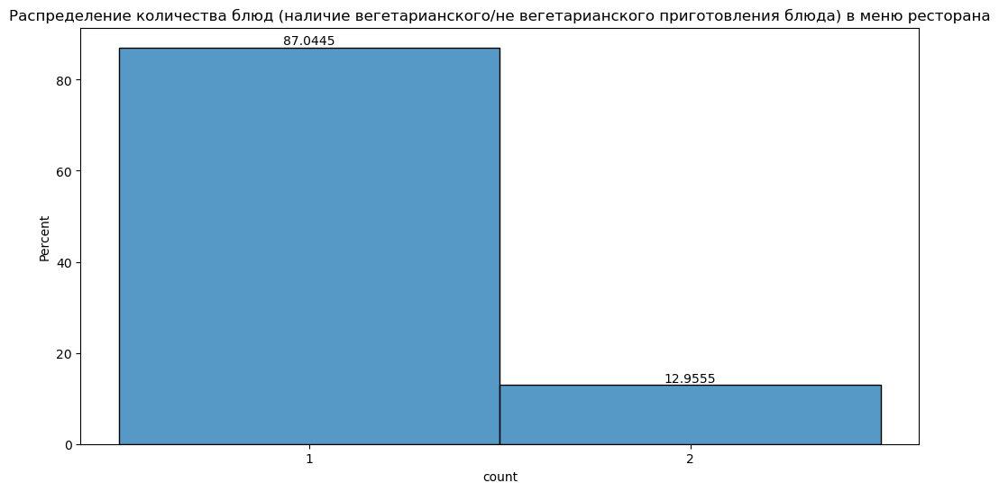

In [277]:
pylab.figure(figsize(12, 6))
plt.title('Распределение количества блюд (наличие вегетарианского/не вегетарианского приготовления блюда) в меню ресторана')
plt.xticks(range(1, 3))
ax=sns.histplot(df2['menu_id'].value_counts(), discrete=True, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

### menu_cuisine

[Text(0, 0, '21.1164'),
 Text(0, 0, '2.63886'),
 Text(0, 0, '39.248'),
 Text(0, 0, '22.101'),
 Text(0, 0, '2.50391'),
 Text(0, 0, '4.06986'),
 Text(0, 0, '1.48607'),
 Text(0, 0, '0.556822'),
 Text(0, 0, '0.644109'),
 Text(0, 0, '1.78728'),
 Text(0, 0, '0.515479'),
 Text(0, 0, '0.487048'),
 Text(0, 0, '0.421256'),
 Text(0, 0, '0.831388'),
 Text(0, 0, '0.465415'),
 Text(0, 0, '0.403607'),
 Text(0, 0, '0.723498')]

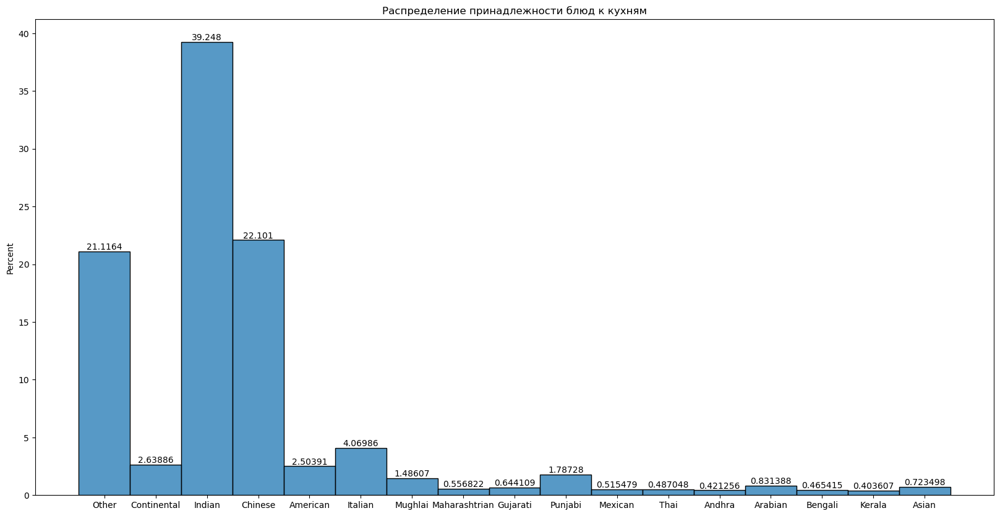

In [278]:
b=list(df2['menu_cuisine'])+list(df2[df2['menu_additional_cuisine']!='No']['menu_additional_cuisine'])
pylab.figure(figsize(20, 10))
plt.title('Распределение принадлежности блюд к кухням')
ax=sns.histplot(b, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

### menu_additional_cuisine

[Text(0, 0, '70.3485'), Text(0, 0, '29.6515')]

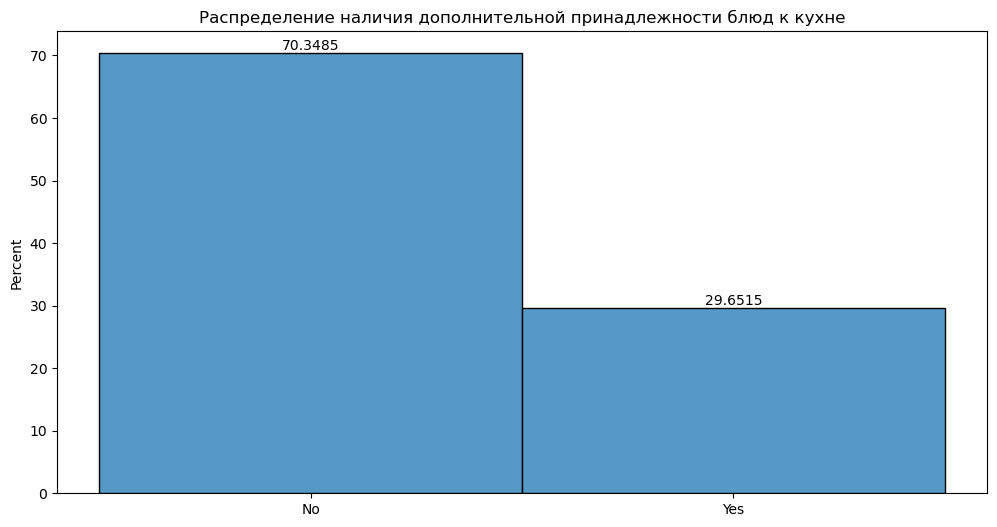

In [279]:
a=np.where(df2['menu_additional_cuisine']=='No', 'No', 'Yes')
pylab.figure(figsize(12, 6))
plt.title('Распределение наличия дополнительной принадлежности блюд к кухне')
ax=sns.histplot(a, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменной price по кухне блюда(menu_cuisine):

In [280]:
d=df2.groupby('menu_cuisine').agg({'price':['median', 'mean', 'std']}).reset_index()
d

menu_cuisine   price                        
                   median        mean         std
0        American  170.00  189.732178   97.325852
1          Andhra  220.00  201.976747   97.647911
2         Arabian  180.00  190.226467  108.768245
3           Asian  259.00  274.681932   98.302471
4         Bengali  199.00  206.326554   95.789761
5         Chinese  170.00  182.466737   94.547017
6     Continental  195.24  206.989312   98.422411
7        Gujarati  119.00  138.220888   95.853038
8          Indian  160.00  172.988365   98.647598
9         Italian  180.00  200.009519  103.807570
10         Kerala  170.00  166.939409   81.760314
11  Maharashtrian  140.00  151.683433   87.291422
12        Mexican  240.00  242.188389  116.417990
13        Mughlai  190.00  202.683353  113.699820
14          Other  143.00  165.129783  100.562785
15        Punjabi  160.00  169.289982   93.294147
16           Thai  200.00  221.645299  114.304349

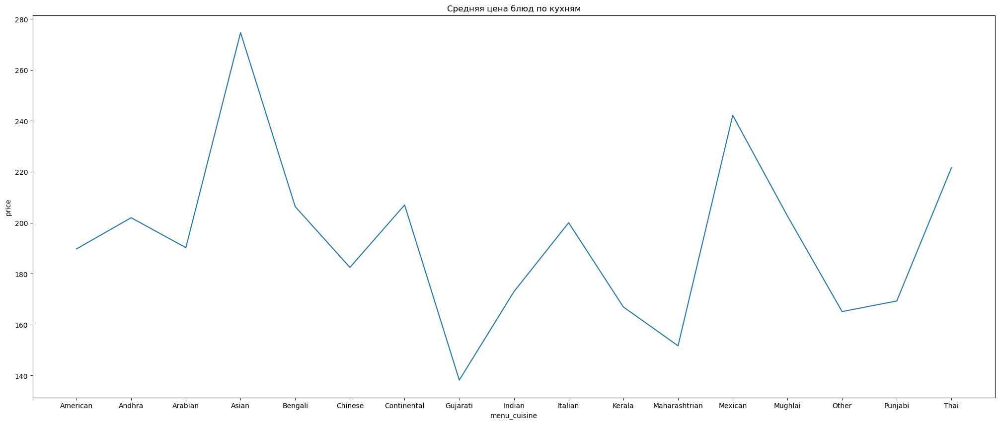

In [281]:
pylab.figure(figsize(25, 10))
plt.title('Средняя цена блюд по кухням')
d1=pd.DataFrame({'menu_cuisine':d['menu_cuisine'],'price':d['price']['mean']})
ax=sns.lineplot(data=d1, x="menu_cuisine", y="price")

Протестируем гипотезу о равенстве средних значений price для групп: 

    1)Меню континентальной кухни
    2)Меню кухни Gujarati

Мы видим, что наши группы независимы, но распределения групп не задаются конкретным распределением, поэтому мы не можем применить t-test. Поэтому применим бакетное преобразование.

In [282]:
kstest(df2[df2['menu_cuisine']=='Continental']['price'], 'norm', 
       args=(df2[df2['menu_cuisine']=='Continental']['price'].mean(),
             df2[df2['menu_cuisine']=='Continental']['price'].std(ddof=1)))

KstestResult(statistic=0.0728892834316654, pvalue=1.8305717227887884e-79, statistic_location=200.0, statistic_sign=1)

In [283]:
kstest(df2[df2['menu_cuisine']=='Gujarati']['price'], 'norm', 
       args=(df2[df2['menu_cuisine']=='Gujarati']['price'].mean(),
             df2[df2['menu_cuisine']=='Gujarati']['price'].std(ddof=1)))

KstestResult(statistic=0.11507854387478372, pvalue=4.2240105063001973e-41, statistic_location=100.0, statistic_sign=1)

Разбиваем группы случайным образом на 100 бакетов:

In [284]:
y1 = pd.DataFrame(df2[df2['menu_cuisine']=='Continental'], columns=df2.columns).reset_index(drop=True)
y2 = pd.DataFrame(df2[df2['menu_cuisine']=='Gujarati'], columns=df2.columns).reset_index(drop=True)
s1,s2,n1,n2 = Bucketization(y1,y2,100,'price')
print('Количество элементов в бакете для df2[menu_cuisine]=Continental', {n1})
print('Количество элементов в бакете для df2[menu_cuisine]=Gujarati', {n2})

/tmp/ipykernel_54114/1724550939.py:11: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead



Количество элементов в бакете для df2[menu_cuisine]=Continental {171}
Количество элементов в бакете для df2[menu_cuisine]=Gujarati {35}


/tmp/ipykernel_54114/1724550939.py:16: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead



Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов первой группы является нормальным:

ShapiroResult(statistic=0.9850502014160156, pvalue=0.3202492892742157)
KstestResult(statistic=0.06370492092537638, pvalue=0.7876712419563296, statistic_location=210.56, statistic_sign=-1)


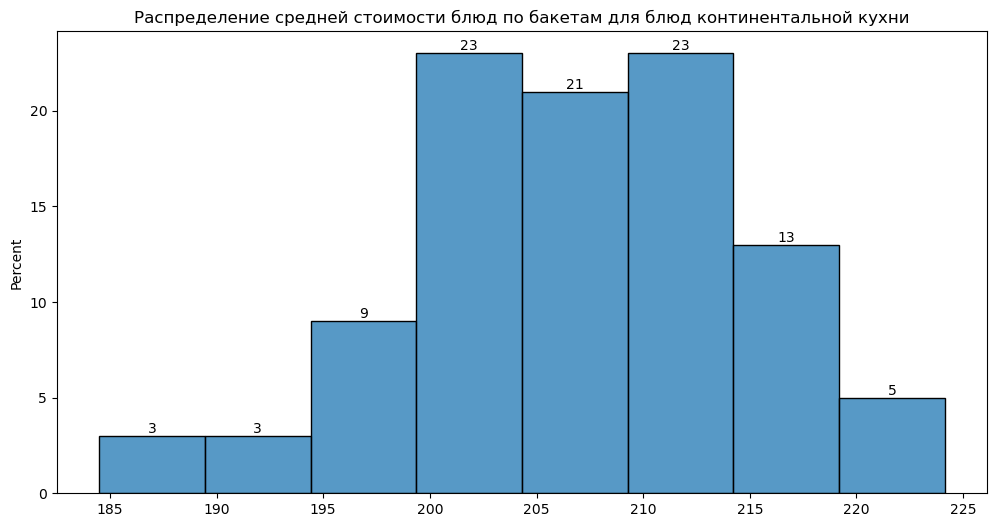

In [285]:
pylab.figure(figsize(12, 6))
plt.title('Распределение средней стоимости блюд по бакетам для блюд континентальной кухни')
ax=sns.histplot(s1, stat='percent', binwidth=5)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s1))
print(kstest(s1, 'norm', args=(mean(s1),std(s1,ddof=1))))

Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов второй группы является нормальным:

ShapiroResult(statistic=0.9889393448829651, pvalue=0.5798084735870361)
KstestResult(statistic=0.07829393745243951, pvalue=0.5457992633702382, statistic_location=134.14, statistic_sign=1)


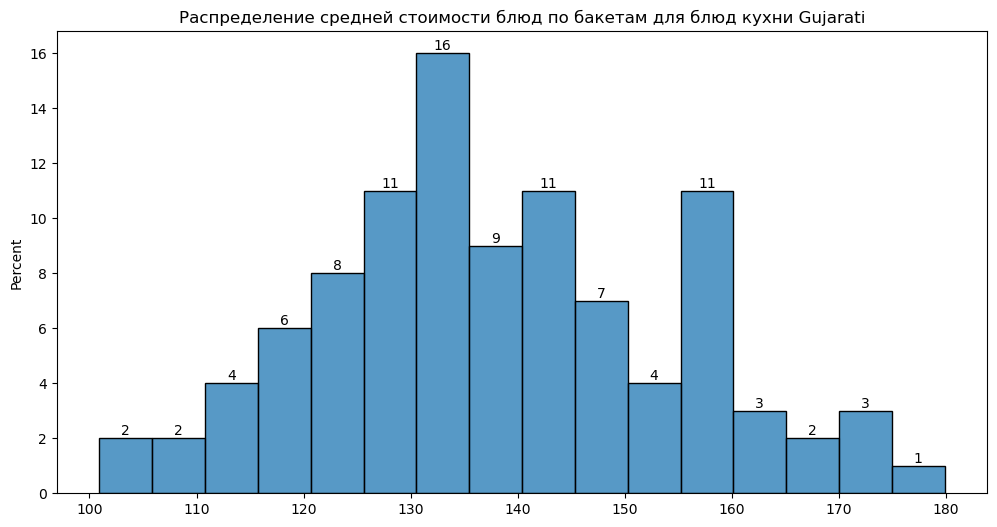

In [286]:
pylab.figure(figsize(12, 6))
plt.title('Распределение средней стоимости блюд по бакетам для блюд кухни Gujarati')
ax=sns.histplot(s2, stat='percent', binwidth=5)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s2))
print(kstest(s2, 'norm', args=(mean(s2),std(s2,ddof=1))))

Убедившись в нормальности распределений, проведем t-test о равенстве средних:

In [287]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=37.752988988358645, pvalue=2.097448653443615e-92, df=198.0)

На 5% уровне значимости можно отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних значений price для групп: 

    1)Меню континентальной кухни
    2)Меню кухни Gujarati
    
**можно отвергнуть на 5% уровне значимости.**

Построим 95% доверительный интервал для разности средних. Видим, что с 95%-ной вероятностью блюда континентальной кухни в среднем  стоят больше, чем блюда кухни Gujarati, в интервале от 65.2 до 72.33 рупий.

In [288]:
diff=mean(s1)-mean(s2)
diff_sd=np.sqrt(var(s1, ddof=1)/100+var(s2, ddof=1)/100)
left, right=st.norm.interval(0.95, loc=diff, scale=diff_sd)
print(f'95% confidence interval: [{left} ; {right}]')

95% confidence interval: [65.19702401574278 ; 72.3371759842571]


### menu_food

[Text(0, 0, '8.6193'),
 Text(0, 0, '43.3427'),
 Text(0, 0, '7.03376'),
 Text(0, 0, '7.46877'),
 Text(0, 0, '8.01591'),
 Text(0, 0, '1.31416'),
 Text(0, 0, '2.93278'),
 Text(0, 0, '5.09136'),
 Text(0, 0, '2.45088'),
 Text(0, 0, '5.60686'),
 Text(0, 0, '0.865864'),
 Text(0, 0, '0.588745'),
 Text(0, 0, '0.88157'),
 Text(0, 0, '0.872509'),
 Text(0, 0, '0.600147'),
 Text(0, 0, '1.58781'),
 Text(0, 0, '1.41965'),
 Text(0, 0, '0.503797'),
 Text(0, 0, '0.803418')]

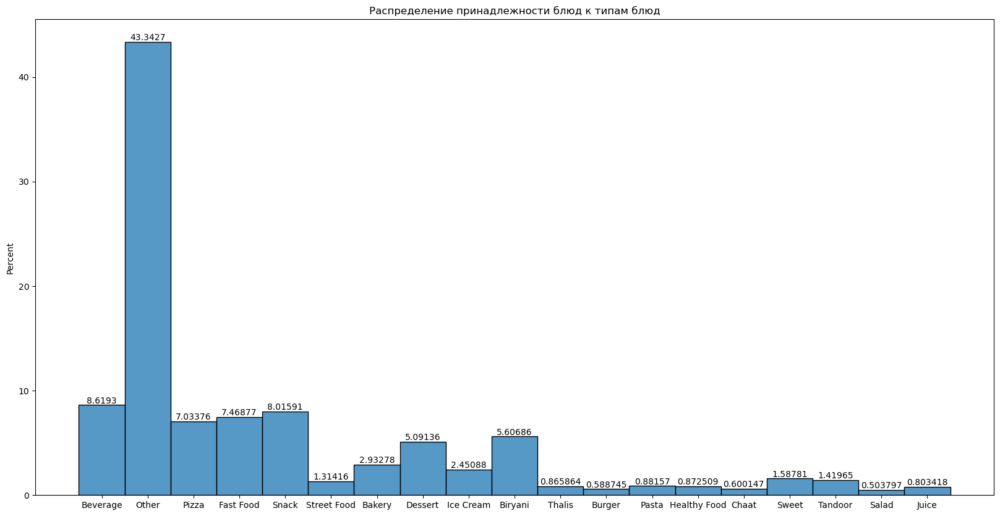

In [289]:
b=list(df2['menu_food'])+list(df2[df2['menu_additional_food']!='No']['menu_additional_food'])
pylab.figure(figsize(20, 10))
plt.title('Распределение принадлежности блюд к типам блюд')
ax=sns.histplot(b, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

### menu_additional_food

[Text(0, 0, '17.9181'), Text(0, 0, '82.0819')]

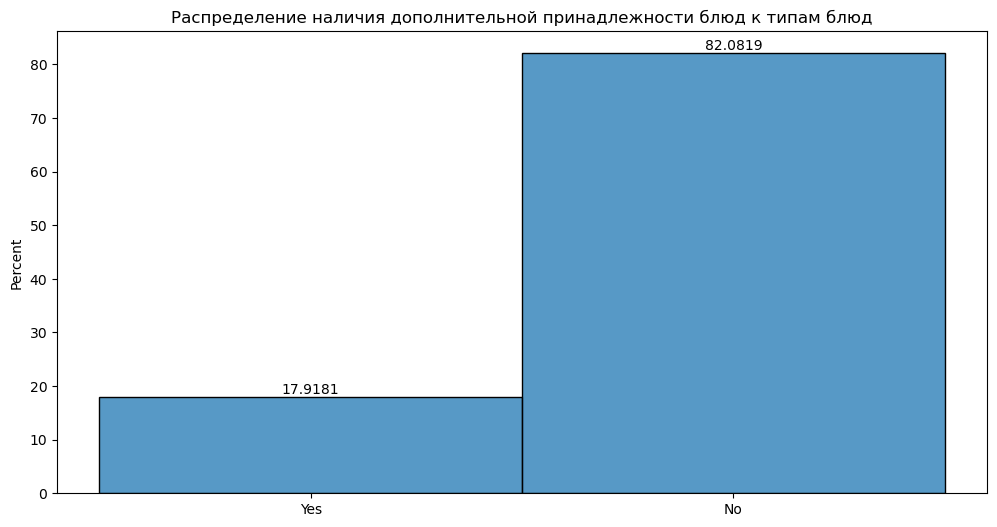

In [290]:
a=np.where(df2['menu_additional_food']=='No', 'No', 'Yes')
pylab.figure(figsize(12, 6))
plt.title('Распределение наличия дополнительной принадлежности блюд к типам блюд')
ax=sns.histplot(a, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменной price по типу блюда(menu_food):

In [291]:
d=df2.groupby('menu_food').agg({'price':['median', 'mean', 'std']}).reset_index()
d

menu_food  price                        
                 median        mean         std
0         Bakery  165.0  199.600595  129.078862
1       Beverage  150.0  164.244034   88.076144
2        Biryani  188.0  193.813640  104.117843
3         Burger  129.0  156.317445   91.227148
4          Chaat  110.0  133.951200   88.890838
5        Dessert  150.0  174.123901  108.096566
6      Fast Food  139.0  155.871983   90.435824
7   Healthy Food  229.0  225.506808   98.241023
8      Ice Cream  129.0  161.402219  106.584463
9          Juice  109.0  128.053409   71.172654
10         Other  170.0  181.686983   97.847635
11         Pasta  190.0  200.477422  100.542925
12         Pizza  179.0  196.655519  103.702102
13         Salad  229.0  224.813351  100.069179
14         Snack  129.0  147.246553   93.005671
15   Street Food  110.0  127.120649   77.906640
16         Sweet  130.0  150.606431   94.611032
17       Tandoor  190.0  196.289817  101.430125
18        Thalis  170.0  180.398239  100.454445

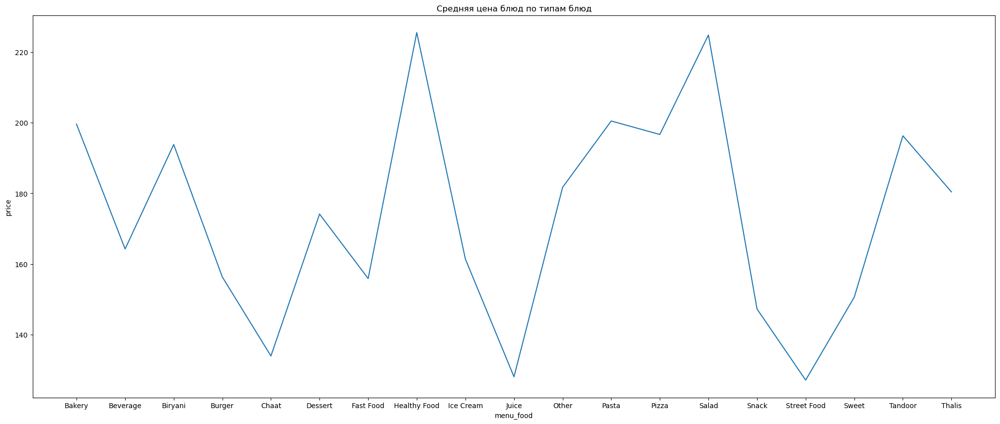

In [292]:
pylab.figure(figsize(25, 10))
plt.title('Средняя цена блюд по типам блюд')
d1=pd.DataFrame({'menu_food':d['menu_food'],'price':d['price']['mean']})
ax=sns.lineplot(data=d1, x="menu_food", y="price")

Протестируем гипотезу о равенстве средних значений price для групп: 

    1)Меню со снеками
    2)Меню с фаст-фудом

Мы видим, что наши группы независимы, но распределения групп не задаются конкретным распределнием, поэтому мы не можем применить t-test. Поэтому применим бакетное преобразование.

In [293]:
kstest(df2[df2['menu_food']=='Snack']['price'], 'norm', 
       args=(df2[df2['menu_food']=='Snack']['price'].mean(),
             df2[df2['menu_food']=='Snack']['price'].std(ddof=1)))

KstestResult(statistic=0.11165788718174297, pvalue=0.0, statistic_location=150.0, statistic_sign=1)

In [294]:
kstest(df2[df2['menu_food']=='Fast Food']['price'], 'norm', 
       args=(df2[df2['menu_food']=='Fast Food']['price'].mean(),
             df2[df2['menu_food']=='Fast Food']['price'].std(ddof=1)))

KstestResult(statistic=0.11065703076723438, pvalue=0.0, statistic_location=150.0, statistic_sign=1)

Разбиваем группы случайным образом на 200 бакетов:

In [295]:
from sklearn.model_selection import KFold
y1 = pd.DataFrame(df2[df2['menu_food']=='Snack'], columns=df2.columns).reset_index(drop=True)
y2 = pd.DataFrame(df2[df2['menu_food']=='Fast Food'], columns=df2.columns).reset_index(drop=True)
s1,s2,n1,n2 = Bucketization(y1,y2,200,'price')
print('Количество элементов в бакете для df2[menu_food]=Snack', {n1})
print('Количество элементов в бакете для df2[menu_food]=Fast Food', {n2})

/tmp/ipykernel_54114/1724550939.py:11: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_54114/1724550939.py:16: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead



Количество элементов в бакете для df2[menu_food]=Snack {530}
Количество элементов в бакете для df2[menu_food]=Fast Food {349}


Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов первой группы является нормальным:

ShapiroResult(statistic=0.995396077632904, pvalue=0.8062961101531982)
KstestResult(statistic=0.034938792192321266, pvalue=0.960485758224004, statistic_location=147.19, statistic_sign=-1)


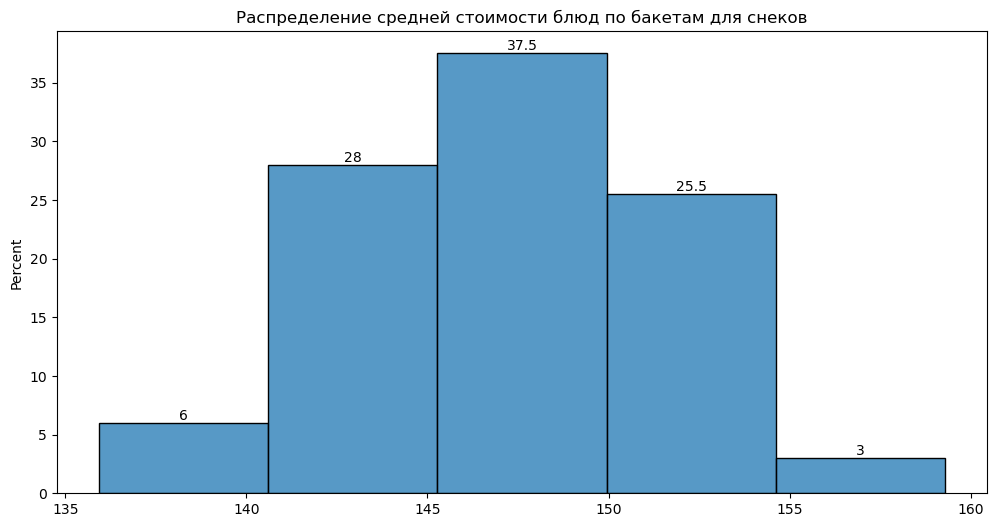

In [296]:

pylab.figure(figsize(12, 6))
plt.title('Распределение средней стоимости блюд по бакетам для снеков')
ax=sns.histplot(s1, stat='percent', binwidth=5)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s1))
print(kstest(s1, 'norm', args=(mean(s1),std(s1,ddof=1))))

Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов второй группы является нормальным:

ShapiroResult(statistic=0.9886189103126526, pvalue=0.11160316318273544)
KstestResult(statistic=0.044251550049600186, pvalue=0.8116679403347987, statistic_location=154.36, statistic_sign=1)


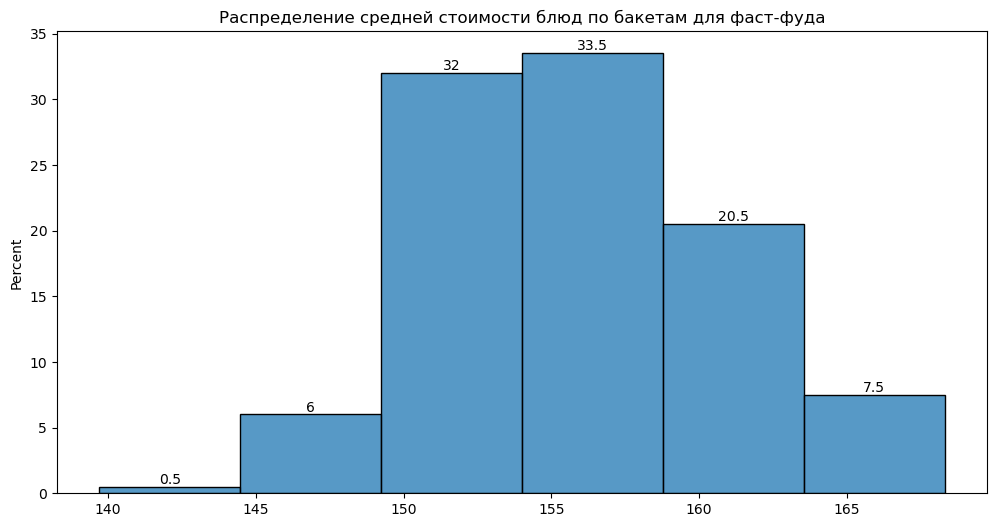

In [297]:

pylab.figure(figsize(12, 6))
plt.title('Распределение средней стоимости блюд по бакетам для фаст-фуда')
ax=sns.histplot(s2, stat='percent', binwidth=5)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s2))
print(kstest(s2, 'norm', args=(mean(s2),std(s2,ddof=1))))

Убедившись в нормальности распределений, проведем t-test о равенстве средних:

In [298]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=-18.298669787255964, pvalue=1.0239580139762475e-54, df=398.0)

На 5% уровне значимости можно отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних значений price для групп: 

    1)Меню со снеками
    2)Меню с фаст-фудом
    
**можно отвергнуть на 5% уровне значимости.**

Построим 95% доверительный интервал для разности средних. Видим, что с 95%-ной вероятностью снеки в среднем стоят меньше, чем фаст-фуд, в интервале от 7.7 до 9.55 рупий.

In [299]:
diff=mean(s1)-mean(s2)
diff_sd=np.sqrt(var(s1, ddof=1)/200+var(s2, ddof=1)/200)
left, right=st.norm.interval(0.95, loc=diff, scale=diff_sd)
print(f'95% confidence interval: [{left} ; {right}]')

95% confidence interval: [-9.549817067787 ; -7.701982932213004]


### veg_or_non_veg

[Text(0, 0, '69.5305'), Text(0, 0, '30.3977'), Text(0, 0, '0.0717655')]

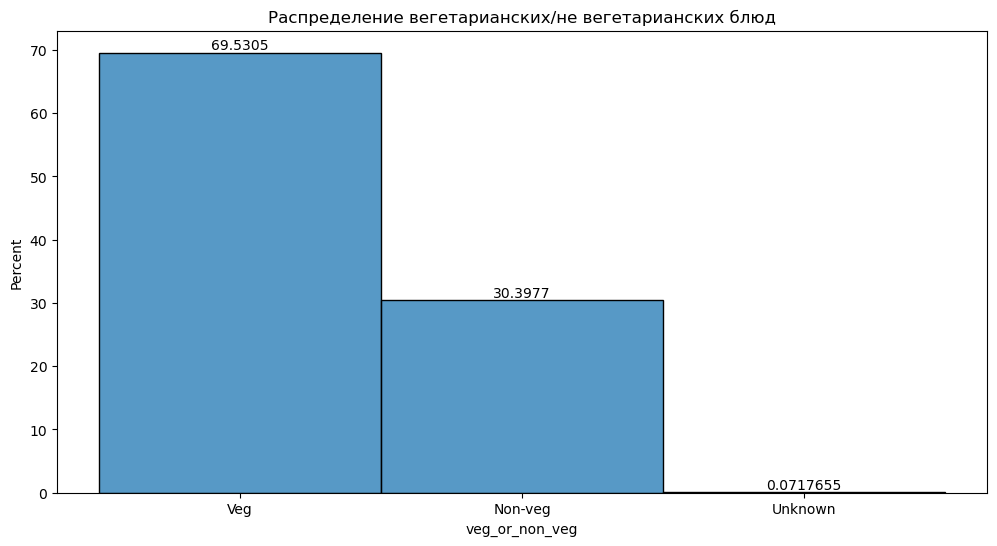

In [300]:
pylab.figure(figsize(12, 6))
plt.title('Распределение вегетарианских/не вегетарианских блюд')
ax=sns.histplot(df2['veg_or_non_veg'], stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])

Посмотрим распределение переменной price по вегетарианской/ не вегетарианской еде(veg_or_non_veg):

In [301]:
d=df2.groupby('veg_or_non_veg').agg({'price':['median', 'mean', 'std']}).reset_index()
d

veg_or_non_veg  price                        
                 median        mean         std
0        Non-veg  199.0  206.728172  103.893196
1        Unknown  250.0  254.270471   86.603681
2            Veg  149.0  162.753928   93.697168

Протестируем гипотезу о равенстве средних значений price для групп: 

    1)Вегетарианские блюда
    2)Не вегетарианские блюда

Мы видим, что наши группы независимы, но распределения групп не задаются конкретным распределением, поэтому мы не можем применить t-test. Поэтому применим бакетное преобразование.

In [302]:
kstest(df2[df2['veg_or_non_veg']=='Veg']['price'], 'norm', 
       args=(df2[df2['veg_or_non_veg']=='Veg']['price'].mean(),
             df2[df2['veg_or_non_veg']=='Veg']['price'].std(ddof=1)))

KstestResult(statistic=0.08305355260644287, pvalue=0.0, statistic_location=150.0, statistic_sign=1)

In [303]:
kstest(df2[df2['veg_or_non_veg']=='Non-veg']['price'], 'norm', 
       args=(df2[df2['veg_or_non_veg']=='Non-veg']['price'].mean(),
             df2[df2['veg_or_non_veg']=='Non-veg']['price'].std(ddof=1)))

KstestResult(statistic=0.0607153275013238, pvalue=0.0, statistic_location=200.0, statistic_sign=1)

Разбиваем группы случайным образом на 200 бакетов:

In [304]:
y1 = pd.DataFrame(df2[df2['veg_or_non_veg']=='Veg'], columns=df2.columns).reset_index(drop=True)
y2 = pd.DataFrame(df2[df2['veg_or_non_veg']=='Non-veg'], columns=df2.columns).reset_index(drop=True)
s1,s2,n1,n2= Bucketization(y1,y2,200,'price')
print('Количество элементов в бакете для df2[veg_or_non_veg]=Veg', {n1})
print('Количество элементов в бакете для df2[veg_or_non_veg]=Non-veg', {n2})

/tmp/ipykernel_54114/1724550939.py:11: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

/tmp/ipykernel_54114/1724550939.py:16: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead



Количество элементов в бакете для df2[veg_or_non_veg]=Veg {3904}
Количество элементов в бакете для df2[veg_or_non_veg]=Non-veg {1706}


Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов первой группы является нормальным:

ShapiroResult(statistic=0.9915435314178467, pvalue=0.2964494526386261)
KstestResult(statistic=0.0513785037392715, pvalue=0.6473715696879665, statistic_location=162.18, statistic_sign=-1)


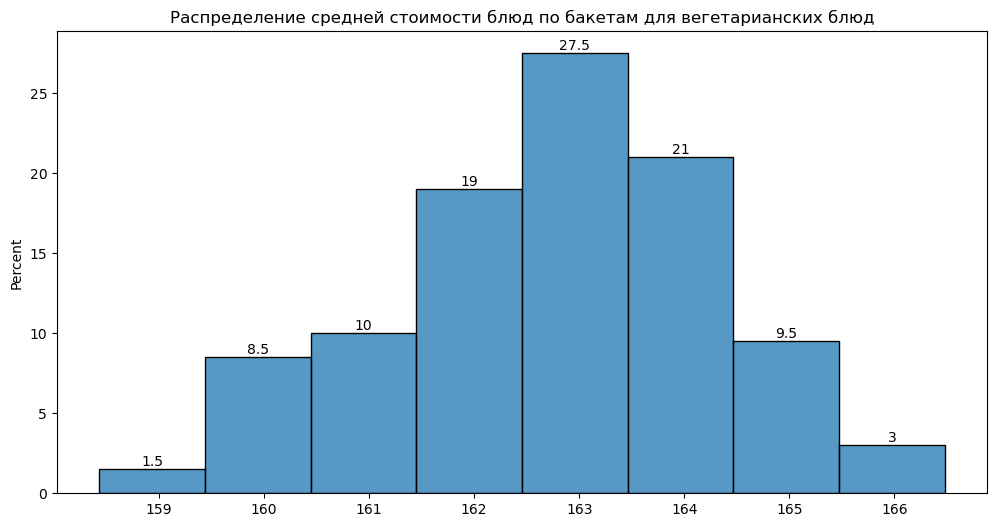

In [305]:

pylab.figure(figsize(12, 6))
plt.title('Распределение средней стоимости блюд по бакетам для вегетарианских блюд')
ax=sns.histplot(s1, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s1))
print(kstest(s1, 'norm', args=(mean(s1),std(s1,ddof=1))))

Согласно тесту Колмогорова-Смирнова и тесту Шапиро-Уилка нельзя отвергнуть гипотезу на любом разумном уровне значимости о том, что распределение бакетов второй группы является нормальным:

ShapiroResult(statistic=0.9920289516448975, pvalue=0.3450802266597748)
KstestResult(statistic=0.0409402917579238, pvalue=0.8769425937923827, statistic_location=205.15, statistic_sign=1)


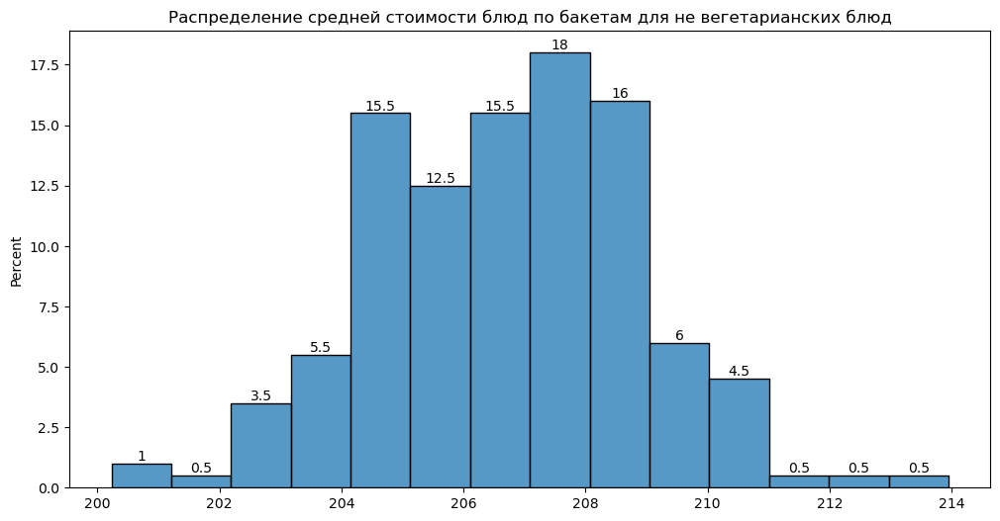

In [306]:

pylab.figure(figsize(12, 6))
plt.title('Распределение средней стоимости блюд по бакетам для не вегетарианских блюд')
ax=sns.histplot(s2, stat='percent', binwidth=1)
ax.bar_label (ax.containers [ 0 ])
print(shapiro(s2))
print(kstest(s2, 'norm', args=(mean(s2),std(s2,ddof=1))))

Убедившись в нормальности распределений, проведем t-test о равенстве средних:

In [307]:
from scipy.stats import ttest_ind
ttest_ind(s1,s2)

TtestResult(statistic=-235.80541917811348, pvalue=0.0, df=398.0)

На 5% уровне значимости можно отвергнуть гипотезу о равенстве средних. Следовательно, равенство средних значений price для групп: 

    1)Вегетарианские блюда
    2)Не вегетарианские блюда
    
**можно отвергнуть на 5% уровне значимости.**

Построим 95% доверительный интервал для разности средних. Видим, что с 95%-ной вероятностью вегетарианские блюда в среднем стоят меньше, чем не вегетарианские, в интервале от 44.34 до 43.61 рупий.

In [308]:
diff=mean(s1)-mean(s2)
diff_sd=np.sqrt(var(s1, ddof=1)/200+var(s2, ddof=1)/200)
left, right=st.norm.interval(0.95, loc=diff, scale=diff_sd)
print(f'95% confidence interval: [{left} ; {right}]')

95% confidence interval: [-44.33955285635829 ; -43.60854714364172]


Корреляционная матрица таблицы df2:

<Axes: >

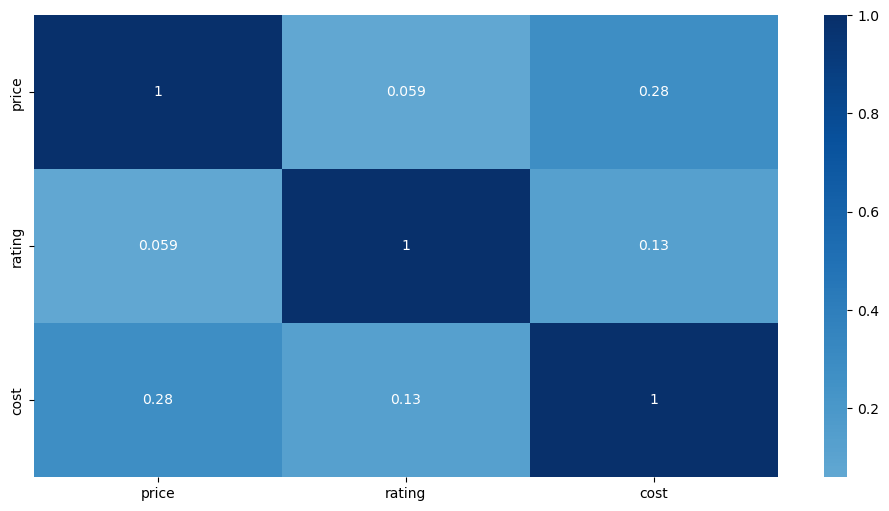

In [309]:
sns.heatmap(df2.corr(numeric_only = True), 
            xticklabels=df2.corr(numeric_only = True).columns, yticklabels=df2.corr(numeric_only = True).columns, cmap='Blues', center=0, annot=True)

### Линейная регрессия

Построим линейную регрессию, где зависимой переменной будет цена блюда(price):

In [310]:
df2_new=df2.drop(['item', 'restaurant_name', 'city', 'menu_id', 'r_id','f_id'], axis=1)
df_reg = pd.get_dummies(df2_new, drop_first=True)
df_reg.head()


,price,rating,cost,menu_cuisine_Andhra,menu_cuisine_Arabian,menu_cuisine_Asian,menu_cuisine_Bengali,menu_cuisine_Chinese,menu_cuisine_Continental,menu_cuisine_Gujarati,...,additional_food_Kebab,additional_food_No,additional_food_Pasta,additional_food_Pizza,additional_food_Salad,additional_food_Seafood,additional_food_Street Food,additional_food_Sweet,additional_food_Tandoor,additional_food_Thalis
0,40.0,3.9,200.0,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
1,40.0,3.9,200.0,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
2,50.0,3.9,200.0,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
3,65.0,3.9,200.0,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
4,80.0,3.9,200.0,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False


In [311]:
cols = df_reg.columns
cols = [i.replace(' ', '_') for i in cols]
cols = [i.replace('+', '') for i in cols]
df_reg.columns = cols

df2_reg = df_reg.drop('price', axis=1)
text = ''
for i in list(df2_reg.columns):
    text += f'+ {i} '
text = text[1:]

Видим, что значимыми на 5% уровне являются коэффициенты: rating, cost, menu_cuisine_Arabian,
menu_cuisine_Bengali, menu_additional_cuisine_Arabian, veg_or_non_veg_Unknown, veg_or_non_veg_Veg,      rating_count_1K_ratings, rating_count_20_ratings, rating_count_50_ratings, rating_count_500_ratings,
rating_count_5K_ratings, rating_count_Too_Few_Ratings, cuisine_Arabian, cuisine_Bengali, food_Snack, additional_cuisine_Arabian.
Однако модель крайне плохо объясняет зависимую переменную, так как R2=0.142<0.5. Скорее всего это связано с малым количеством числовых переменных, коррелирующих с price(например, нет цен на ингредиенты).

In [312]:
ols1 = smf.ols(f'price ~ {text}', data=df_reg).fit()
print(ols1.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.142
Model:                            OLS   Adj. R-squared:                  0.142
Method:                 Least Squares   F-statistic:                     1412.
Date:                Sun, 31 Mar 2024   Prob (F-statistic):               0.00
Time:                        11:23:31   Log-Likelihood:            -6.6684e+06
No. Observations:             1123103   AIC:                         1.334e+07
Df Residuals:                 1122970   BIC:                         1.334e+07
Df Model:                         132                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

# Продуктовые метрики

In [313]:
df1

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food,log_sales_amount,weekday
1,2019-03-07,1,130.0,49226,555824,Teresa Garcia,27,Male,Married,Self Employeed,...,"Aminabad,Lucknow",3.9,Too Few Ratings,250.0,American,Fast Food,No,No,4.875197,4
2,2018-04-06,1,875.0,5321,158203,Donald Anderson,24,Male,Married,Employee,...,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No,6.775366,5
4,2018-04-17,2,2676.0,5321,399517,Donald Anderson,24,Male,Married,Employee,...,"Akota,Vadodara",3.9,Too Few Ratings,1000.0,Chinese,Other,Indian,No,7.892452,2
5,2018-04-11,1,583.0,21343,187912,Scott Cruz,22,Male,Single,Student,...,Abohar,3.7,20+ ratings,250.0,Indian,Fast Food,No,No,6.369901,3
7,2017-10-16,1,32.0,75378,532347,Heather Richardson,28,Male,Married,Employee,...,"Alipore,Kolkata",3.9,Too Few Ratings,150.0,Chinese,Other,Indian,No,3.496508,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148656,2019-01-11,1,2884.0,40949,181681,Nicole Cooper,25,Male,Single,Self Employeed,...,Yavatmal,3.9,Too Few Ratings,200.0,Indian,Other,No,No,7.967280,5
148657,2019-01-11,1,1625.0,9221,197786,Joy Smith,24,Male,Single,Student,...,Yavatmal,3.9,Too Few Ratings,200.0,Other,Bakery,No,No,7.393878,5
148659,2019-01-17,1,1523.0,53604,242762,Aaron Mccarthy,25,Male,Single,Student,...,Yavatmal,3.9,Too Few Ratings,250.0,Other,Fast Food,No,Pizza,7.329094,4
148660,2019-01-23,1,1477.0,3414,562647,Mr. Reginald Chen,23,Male,Single,Student,...,Yavatmal,3.9,Too Few Ratings,300.0,Other,Pizza,No,No,7.298445,3


## Конверсия в покупку

In [314]:
len(paying_users)/100000

0.66832

## ARPU

In [315]:
(df1['sales_amount'].sum()+outliers1['sales_amount'].sum())/100000

9643.07241675

## ARPPU

In [316]:
(df1['sales_amount'].sum()+outliers1['sales_amount'].sum())/len(paying_users)

14428.825138780823

## DAU

In [317]:
qq=pd.concat([df1,outliers1], axis=0).reset_index(drop=True)
qq

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food,log_sales_amount,weekday
0,2019-03-07,1,130.0,49226,555824,Teresa Garcia,27,Male,Married,Self Employeed,...,"Aminabad,Lucknow",3.9,Too Few Ratings,250.0,American,Fast Food,No,No,4.875197,4
1,2018-04-06,1,875.0,5321,158203,Donald Anderson,24,Male,Married,Employee,...,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No,6.775366,5
2,2018-04-17,2,2676.0,5321,399517,Donald Anderson,24,Male,Married,Employee,...,"Akota,Vadodara",3.9,Too Few Ratings,1000.0,Chinese,Other,Indian,No,7.892452,2
3,2018-04-11,1,583.0,21343,187912,Scott Cruz,22,Male,Single,Student,...,Abohar,3.7,20+ ratings,250.0,Indian,Fast Food,No,No,6.369901,3
4,2017-10-16,1,32.0,75378,532347,Heather Richardson,28,Male,Married,Employee,...,"Alipore,Kolkata",3.9,Too Few Ratings,150.0,Chinese,Other,Indian,No,3.496508,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148657,2018-12-14,3,9838.0,94394,389207,John Smith,18,Male,Single,Student,...,Yamuna-nagar,3.6,20+ ratings,200.0,Other,Snack,No,Dessert,NaN,NaN
148658,2018-12-21,4,9574.0,24832,234395,Charles Gill,23,Male,Single,Student,...,Yavatmal,3.5,50+ ratings,100.0,Chinese,Other,American,No,NaN,NaN
148659,2018-12-28,4,11315.0,19731,488071,Carlos Blevins,26,Male,Married,Employee,...,Yavatmal,3.9,Too Few Ratings,100.0,Other,Snack,No,No,NaN,NaN
148660,2019-01-04,2,4245.0,8303,185298,Jeffrey Wagner,24,Female,Married,Self Employeed,...,Yavatmal,3.7,50+ ratings,150.0,Other,Snack,No,Fast Food,NaN,NaN


Dau для каждого дня, если дата отсутствует, то Dau=0 для этого дня:

In [318]:
dau = pd.DataFrame(qq.groupby(['order_date'])['user_id'].nunique()).reset_index()
dau.columns=['date', 'number_of_users']
dau=dau.sort_values('date')
dau=dau.reset_index(drop=True)
dau

,date,number_of_users
0,2017-10-04,27
1,2017-10-05,95
2,2017-10-06,146
3,2017-10-09,106
4,2017-10-10,181
...,...,...
801,2020-06-22,82
802,2020-06-23,26
803,2020-06-24,10
804,2020-06-25,5


Средний Dau:

In [319]:
delta=(dau['date'].max()-dau['date'].min()).days
dau['number_of_users'].sum()/(delta+1)

148.95887662988966

## WAU

In [320]:
i=dau['date'].min()
wau_dates=[]
while i<dau['date'].max():
    wau_dates.append(i)
    i=i+datetime.timedelta(weeks=1)

In [321]:
wau_number=[0]*len(wau_dates)
for i in range(1,len(wau_dates)+1):
    if i==len(wau_dates):
        wau_number[i-1]=qq[qq['order_date']>=wau_dates[i-1]]['user_id'].nunique()
        
    else:
        wau_number[i-1]=qq[(qq['order_date']<wau_dates[i])&
                        (qq['order_date']>=wau_dates[i-1])]['user_id'].nunique()

Wau для каждой недели, начиная с даты в таблице:

In [322]:
wau=pd.DataFrame({'date':wau_dates, 'number_of_users':wau_number})
wau

,date,number_of_users
0,2017-10-04,554
1,2017-10-11,1159
2,2017-10-18,1249
3,2017-10-25,1272
4,2017-11-01,1133
...,...,...
138,2020-05-27,743
139,2020-06-03,1072
140,2020-06-10,910
141,2020-06-17,462


Средний Wau:

In [323]:
wau['number_of_users'].sum()/(len(wau))

1034.1818181818182

## MAU

In [324]:
from dateutil.relativedelta import relativedelta
i=dau['date'].min()
mau_dates=[]
while i<dau['date'].max():
    mau_dates.append(i)
    i=i+relativedelta(months=1)

In [325]:
mau_number=[0]*len(mau_dates)
for i in range(1,len(mau_dates)+1):
    if i==len(mau_dates):
        mau_number[i-1]=qq[qq['order_date']>=mau_dates[i-1]]['user_id'].nunique()
        
    else:
        mau_number[i-1]=qq[(qq['order_date']<mau_dates[i])&
                        (qq['order_date']>=mau_dates[i-1])]['user_id'].nunique()

Mau для каждого месяца, начиная с даты в таблицы:

In [326]:
mau=pd.DataFrame({'date':mau_dates, 'number_of_users':mau_number})
mau

,date,number_of_users
0,2017-10-04,4812
1,2017-11-04,4947
2,2017-12-04,4996
3,2018-01-04,5264
4,2018-02-04,4789
5,2018-03-04,4901
6,2018-04-04,5193
7,2018-05-04,4864
8,2018-06-04,5548
9,2018-07-04,5565


Средний Mau:

In [327]:
mau['number_of_users'].sum()/(len(mau))

4404.515151515152

## Sticky factor

Недельный Sticky factor:

In [328]:
(dau['number_of_users'].sum()/(delta+1))/(wau['number_of_users'].sum()/(len(wau)))

0.14403548197334617

Месячный sticky factor:

In [329]:
(dau['number_of_users'].sum()/(delta+1))/(mau['number_of_users'].sum()/(len(mau)))

0.033819585472114416

## Retention

In [330]:
qq

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,city,rating,rating_count,cost,cuisine,food,additional_cuisine,additional_food,log_sales_amount,weekday
0,2019-03-07,1,130.0,49226,555824,Teresa Garcia,27,Male,Married,Self Employeed,...,"Aminabad,Lucknow",3.9,Too Few Ratings,250.0,American,Fast Food,No,No,4.875197,4
1,2018-04-06,1,875.0,5321,158203,Donald Anderson,24,Male,Married,Employee,...,Abohar,3.8,100+ ratings,100.0,Other,Beverage,No,No,6.775366,5
2,2018-04-17,2,2676.0,5321,399517,Donald Anderson,24,Male,Married,Employee,...,"Akota,Vadodara",3.9,Too Few Ratings,1000.0,Chinese,Other,Indian,No,7.892452,2
3,2018-04-11,1,583.0,21343,187912,Scott Cruz,22,Male,Single,Student,...,Abohar,3.7,20+ ratings,250.0,Indian,Fast Food,No,No,6.369901,3
4,2017-10-16,1,32.0,75378,532347,Heather Richardson,28,Male,Married,Employee,...,"Alipore,Kolkata",3.9,Too Few Ratings,150.0,Chinese,Other,Indian,No,3.496508,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148657,2018-12-14,3,9838.0,94394,389207,John Smith,18,Male,Single,Student,...,Yamuna-nagar,3.6,20+ ratings,200.0,Other,Snack,No,Dessert,NaN,NaN
148658,2018-12-21,4,9574.0,24832,234395,Charles Gill,23,Male,Single,Student,...,Yavatmal,3.5,50+ ratings,100.0,Chinese,Other,American,No,NaN,NaN
148659,2018-12-28,4,11315.0,19731,488071,Carlos Blevins,26,Male,Married,Employee,...,Yavatmal,3.9,Too Few Ratings,100.0,Other,Snack,No,No,NaN,NaN
148660,2019-01-04,2,4245.0,8303,185298,Jeffrey Wagner,24,Female,Married,Self Employeed,...,Yavatmal,3.7,50+ ratings,150.0,Other,Snack,No,Fast Food,NaN,NaN


Сделаем для каждого пользователя показатель CohortMonth, который будет показывать, месяц первой покупки соответствующего пользователя:

In [331]:

def get_month(x): return datetime.datetime(x.year, x.month, 4) 

qq['order_month'] = qq['order_date'].apply(get_month) 

grouping = qq.groupby('user_id')['order_month'] 


qq['CohortMonth'] = grouping.transform('min')
qq

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,rating_count,cost,cuisine,food,additional_cuisine,additional_food,log_sales_amount,weekday,order_month,CohortMonth
0,2019-03-07,1,130.0,49226,555824,Teresa Garcia,27,Male,Married,Self Employeed,...,Too Few Ratings,250.0,American,Fast Food,No,No,4.875197,4,2019-03-04,2017-10-04
1,2018-04-06,1,875.0,5321,158203,Donald Anderson,24,Male,Married,Employee,...,100+ ratings,100.0,Other,Beverage,No,No,6.775366,5,2018-04-04,2018-04-04
2,2018-04-17,2,2676.0,5321,399517,Donald Anderson,24,Male,Married,Employee,...,Too Few Ratings,1000.0,Chinese,Other,Indian,No,7.892452,2,2018-04-04,2018-04-04
3,2018-04-11,1,583.0,21343,187912,Scott Cruz,22,Male,Single,Student,...,20+ ratings,250.0,Indian,Fast Food,No,No,6.369901,3,2018-04-04,2018-04-04
4,2017-10-16,1,32.0,75378,532347,Heather Richardson,28,Male,Married,Employee,...,Too Few Ratings,150.0,Chinese,Other,Indian,No,3.496508,1,2017-10-04,2017-10-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148657,2018-12-14,3,9838.0,94394,389207,John Smith,18,Male,Single,Student,...,20+ ratings,200.0,Other,Snack,No,Dessert,NaN,NaN,2018-12-04,2018-12-04
148658,2018-12-21,4,9574.0,24832,234395,Charles Gill,23,Male,Single,Student,...,50+ ratings,100.0,Chinese,Other,American,No,NaN,NaN,2018-12-04,2018-12-04
148659,2018-12-28,4,11315.0,19731,488071,Carlos Blevins,26,Male,Married,Employee,...,Too Few Ratings,100.0,Other,Snack,No,No,NaN,NaN,2018-12-04,2018-12-04
148660,2019-01-04,2,4245.0,8303,185298,Jeffrey Wagner,24,Female,Married,Self Employeed,...,50+ ratings,150.0,Other,Snack,No,Fast Food,NaN,NaN,2019-01-04,2019-01-04


На основе показателя CohortMonth разделим заказы на когорты, где когорта обозначает разницу между месяцем покупки и CohortMonth(для удобства добавим +1,  то есть заказ, сделанный в тот же месяц, что и его CohortMonth, будет иметь 1-ую когорту):

In [332]:
def get_date_int(df, column):
    year=[0]*148662
    month=[0]*148662
    day=[0]*148662
    for i in range(len(df)):
        year[i]=df[column][i].year
        month[i]=df[column][i].month
        day[i]=df[column][i].day
    return year, month, day

order_year, order_month, _ = get_date_int(qq, 'order_month')
cohort_year, cohort_month, _ = get_date_int(qq, 'CohortMonth')
years_diff=[0]*148662
months_diff=[0]*148662

for i in range(len(order_year)):
    years_diff[i] = order_year[i] - cohort_year[i]
    months_diff[i] = order_month[i] - cohort_month[i]


""" Extract the difference in months from all previous values
 "+1" in addeded at the end so that first month is marked as 1 instead of 0 for easier interpretation. 
 """
CohortIndex=[0]*148662
for i in range(len(years_diff)):
    CohortIndex[i] = years_diff[i] * 12 + months_diff[i]  + 1 
qq['CohortIndex']=CohortIndex
qq

,order_date,sales_qty,sales_amount,user_id,r_id,name,Age,Gender,Marital Status,Occupation,...,cost,cuisine,food,additional_cuisine,additional_food,log_sales_amount,weekday,order_month,CohortMonth,CohortIndex
0,2019-03-07,1,130.0,49226,555824,Teresa Garcia,27,Male,Married,Self Employeed,...,250.0,American,Fast Food,No,No,4.875197,4,2019-03-04,2017-10-04,18
1,2018-04-06,1,875.0,5321,158203,Donald Anderson,24,Male,Married,Employee,...,100.0,Other,Beverage,No,No,6.775366,5,2018-04-04,2018-04-04,1
2,2018-04-17,2,2676.0,5321,399517,Donald Anderson,24,Male,Married,Employee,...,1000.0,Chinese,Other,Indian,No,7.892452,2,2018-04-04,2018-04-04,1
3,2018-04-11,1,583.0,21343,187912,Scott Cruz,22,Male,Single,Student,...,250.0,Indian,Fast Food,No,No,6.369901,3,2018-04-04,2018-04-04,1
4,2017-10-16,1,32.0,75378,532347,Heather Richardson,28,Male,Married,Employee,...,150.0,Chinese,Other,Indian,No,3.496508,1,2017-10-04,2017-10-04,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148657,2018-12-14,3,9838.0,94394,389207,John Smith,18,Male,Single,Student,...,200.0,Other,Snack,No,Dessert,NaN,NaN,2018-12-04,2018-12-04,1
148658,2018-12-21,4,9574.0,24832,234395,Charles Gill,23,Male,Single,Student,...,100.0,Chinese,Other,American,No,NaN,NaN,2018-12-04,2018-12-04,1
148659,2018-12-28,4,11315.0,19731,488071,Carlos Blevins,26,Male,Married,Employee,...,100.0,Other,Snack,No,No,NaN,NaN,2018-12-04,2018-12-04,1
148660,2019-01-04,2,4245.0,8303,185298,Jeffrey Wagner,24,Female,Married,Self Employeed,...,150.0,Other,Snack,No,Fast Food,NaN,NaN,2019-01-04,2019-01-04,1


Распределение количества пользователей в каждой когорте и каждом CohortMonth:

In [333]:

grouping = qq.groupby(['CohortMonth', 'CohortIndex'])


cohort_data = grouping['user_id'].apply(pd.Series.nunique)
cohort_data = cohort_data.reset_index()

cohort_counts = cohort_data.pivot(index='CohortMonth',
                                 columns ='CohortIndex',
                                 values = 'user_id')


In [334]:
cohort_counts.round(1)

CohortIndex,1,2,3,4,5,6,7,8,9,10,...,24,25,26,27,28,29,30,31,32,33
CohortMonth,,,,,,,,,,,,,,,,,,,,,
2017-10-04,4173.0,179.0,172.0,190.0,194.0,209.0,207.0,218.0,206.0,203.0,...,174.0,176.0,143.0,151.0,154.0,149.0,153.0,138.0,131.0,126.0
2017-11-04,5152.0,244.0,257.0,258.0,237.0,251.0,263.0,280.0,255.0,263.0,...,217.0,201.0,157.0,182.0,200.0,189.0,178.0,177.0,138.0,NaN
2017-12-04,4412.0,212.0,204.0,236.0,198.0,227.0,237.0,251.0,252.0,225.0,...,166.0,136.0,190.0,156.0,163.0,154.0,174.0,118.0,NaN,NaN
2018-01-04,4485.0,213.0,225.0,227.0,243.0,241.0,242.0,234.0,209.0,211.0,...,149.0,181.0,182.0,148.0,158.0,170.0,114.0,NaN,NaN,NaN
2018-02-04,4000.0,214.0,210.0,199.0,225.0,206.0,209.0,189.0,198.0,206.0,...,170.0,160.0,132.0,128.0,151.0,116.0,NaN,NaN,NaN,NaN
2018-03-04,3955.0,205.0,220.0,192.0,202.0,207.0,187.0,189.0,178.0,145.0,...,147.0,133.0,149.0,121.0,104.0,NaN,NaN,NaN,NaN,NaN
2018-04-04,3656.0,183.0,181.0,193.0,182.0,166.0,201.0,176.0,166.0,192.0,...,107.0,120.0,139.0,99.0,NaN,NaN,NaN,NaN,NaN,NaN
2018-05-04,3571.0,189.0,184.0,179.0,191.0,195.0,152.0,129.0,168.0,180.0,...,114.0,102.0,86.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-06-04,3611.0,188.0,188.0,159.0,188.0,160.0,161.0,166.0,149.0,155.0,...,113.0,105.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Получившаяся таблица Retention:

In [335]:
cohort_sizes = cohort_counts.iloc[:,0]
retention = cohort_counts.divide(cohort_sizes, axis=0)
retention.round(3)*100

CohortIndex,1,2,3,4,5,6,7,8,9,10,...,24,25,26,27,28,29,30,31,32,33
CohortMonth,,,,,,,,,,,,,,,,,,,,,
2017-10-04,100.0,4.3,4.1,4.6,4.6,5.0,5.0,5.2,4.9,4.9,...,4.2,4.2,3.4,3.6,3.7,3.6,3.7,3.3,3.1,3.0
2017-11-04,100.0,4.7,5.0,5.0,4.6,4.9,5.1,5.4,4.9,5.1,...,4.2,3.9,3.0,3.5,3.9,3.7,3.5,3.4,2.7,NaN
2017-12-04,100.0,4.8,4.6,5.3,4.5,5.1,5.4,5.7,5.7,5.1,...,3.8,3.1,4.3,3.5,3.7,3.5,3.9,2.7,NaN,NaN
2018-01-04,100.0,4.7,5.0,5.1,5.4,5.4,5.4,5.2,4.7,4.7,...,3.3,4.0,4.1,3.3,3.5,3.8,2.5,NaN,NaN,NaN
2018-02-04,100.0,5.4,5.2,5.0,5.6,5.2,5.2,4.7,5.0,5.2,...,4.2,4.0,3.3,3.2,3.8,2.9,NaN,NaN,NaN,NaN
2018-03-04,100.0,5.2,5.6,4.9,5.1,5.2,4.7,4.8,4.5,3.7,...,3.7,3.4,3.8,3.1,2.6,NaN,NaN,NaN,NaN,NaN
2018-04-04,100.0,5.0,5.0,5.3,5.0,4.5,5.5,4.8,4.5,5.3,...,2.9,3.3,3.8,2.7,NaN,NaN,NaN,NaN,NaN,NaN
2018-05-04,100.0,5.3,5.2,5.0,5.3,5.5,4.3,3.6,4.7,5.0,...,3.2,2.9,2.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-06-04,100.0,5.2,5.2,4.4,5.2,4.4,4.5,4.6,4.1,4.3,...,3.1,2.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [336]:
retention.index = retention.index.strftime('%Y-%m')

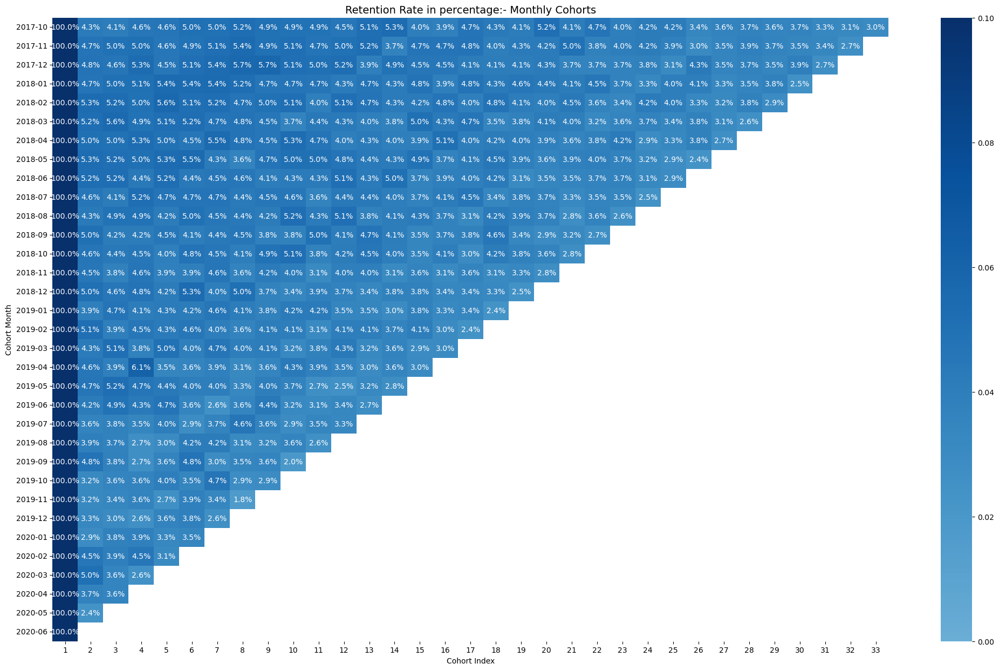

In [338]:
plt.figure(figsize=(25, 15))

plt.title('Retention Rate in percentage:- Monthly Cohorts', fontsize = 14)

sns.heatmap(retention, cmap='Blues', fmt= '.1%', center=0, annot=True, vmin = 0.0 , vmax = 0.1)
plt.ylabel('Cohort Month')
plt.xlabel('Cohort Index')
plt.show()

# Вывод

**Итоги проекта:**

    1) Предобработка данных
    2) Работа с выбросами
    3) Визуализация и описание параметров
    4) Проверка статистических гипотез
    5) Сегментация пользователей
    6) Построение линейной регрессии и проверка значимости коэффициентов
    7) Подсчет продуктовых метрик